# STREAM usecase

## Imports

In [1]:
import anndata as ad
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.decomposition import PCA as sklearnPCA
from sklearn.manifold import LocallyLinearEmbedding, TSNE, SpectralEmbedding
import umap

import dynchro

/home/louise/miniforge3/envs/dynchro/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# 1. STREAM functions for dimred en visualisation

In [2]:
def dimension_reduction(adata,n_neighbors=50, nb_pct = None,n_components = 3,n_jobs = 1,
                        feature='var_genes',method = 'se',eigen_solver=None):

    """Perform dimension reduction.
    
    Parameters
    ----------
    adata: AnnData
        Annotated data matrix.
    n_neighbors: `int`, optional (default: 50)
        The number of neighbor cells used for manifold learning (only valid when 'mlle','se', or 'umap' is specified).
    nb_pct: `float`, optional (default: None)
        The percentage of neighbor cells (when sepcified, it will overwrite n_neighbors).
    n_components: `int`, optional (default: 3)
        Number of components to keep.
    n_jobs: `int`, optional (default: 1)
        The number of parallel jobs to run.
    feature: `str`, optional (default: 'var_genes')
        Choose from {{'var_genes','top_pcs','all'}}
        Feature used for dimension reduction.
        'var_genes': most variable genes
        'top_pcs': top principal components
        'all': all available features (genes)
    method: `str`, optional (default: 'se')
        Choose from {{'se','mlle','umap','pca'}}
        Method used for dimension reduction.
        'se': Spectral embedding algorithm
        'mlle': Modified locally linear embedding algorithm
        'umap': Uniform Manifold Approximation and Projection
        'pca': Principal component analysis
    eigen_solver: `str`, optional (default: None)
        For 'mlle', choose from {{'arpack', 'dense'}}
        For 'se', choose from {{'arpack', 'lobpcg', or 'amg'}}
        The eigenvalue decomposition strategy to use
   
    Returns
    -------
    updates `adata` with the following fields.
    
    X_dr : `numpy.ndarray` (`adata.obsm['X_dr']`)
        A #observations × n_components data matrix after dimension reduction.
    X_mlle : `numpy.ndarray` (`adata.obsm['X_mlle']`)
        Store #observations × n_components data matrix after mlle.
    X_se : `numpy.ndarray` (`adata.obsm['X_se']`)
        Store #observations × n_components data matrix after spectral embedding.    
    X_umap : `numpy.ndarray` (`adata.obsm['X_umap']`)
        Store #observations × n_components data matrix after umap.
    X_pca : `numpy.ndarray` (`adata.obsm['X_pca']`)
        Store #observations × n_components data matrix after pca.
    trans_mlle : `sklearn.manifold.locally_linear.LocallyLinearEmbedding` (`adata.uns['trans_mlle']`)
        Store mlle object
    trans_se : `sklearn.manifold.spectral_embedding_.SpectralEmbedding` (`adata.uns['trans_se']`)
        Store se object
    trans_umap : `umap.UMAP` (`adata.uns['trans_umap']`)
        Store umap object
    trans_pca : `sklearn.decomposition.PCA` (`adata.uns['trans_pca']`)
        Store pca object 
    """

    if(feature not in ['var_genes','top_pcs','all']):
        raise ValueError("unrecognized feature '%s'" % feature)
    if(method not in ['mlle','se','umap','pca']):
        raise ValueError("unrecognized method '%s'" % method)
    if(feature == 'var_genes'):
        input_data = adata.obsm['var_genes']
    if(feature == 'top_pcs'):
        input_data = adata.obsm['top_pcs']
    if(feature == 'all'):
        input_data = adata.X
    print('feature ' + feature + ' is being used ...')
    print(str(n_jobs)+' cpus are being used ...')
    if(nb_pct!=None):
        n_neighbors = int(np.around(input_data.shape[0]*nb_pct))

    if(method == 'mlle'):
        np.random.seed(2)
        if(eigen_solver==None):
            if(input_data.shape[0]<=2000):
                reducer = LocallyLinearEmbedding(n_neighbors=n_neighbors, 
                                                     n_components=n_components,
                                                     n_jobs = n_jobs,
                                                     method = 'modified',eigen_solver = 'dense',random_state=10,
                                                     neighbors_algorithm = 'kd_tree')
            else:
                reducer = LocallyLinearEmbedding(n_neighbors=n_neighbors, 
                                                     n_components=n_components,
                                                     n_jobs = n_jobs,
                                                     method = 'modified',eigen_solver = 'arpack',random_state=10,
                                                     neighbors_algorithm = 'kd_tree')
                
        else:
            reducer = LocallyLinearEmbedding(n_neighbors=n_neighbors, 
                                                 n_components=n_components,
                                                 n_jobs = n_jobs,
                                                 method = 'modified',eigen_solver = eigen_solver,random_state=10,
                                                 neighbors_algorithm = 'kd_tree')        
        trans = reducer.fit(input_data)
        adata.uns['trans_mlle'] = trans
        adata.obsm['X_mlle'] = trans.embedding_
        adata.obsm['X_dr'] = trans.embedding_
    if(method == 'se'):
        np.random.seed(2)
        reducer = SpectralEmbedding(n_neighbors=n_neighbors, 
                                         n_components=n_components,
                                         n_jobs = n_jobs,
                                         eigen_solver = eigen_solver,random_state=10)
        trans = reducer.fit(input_data)
        adata.uns['trans_se'] = trans
        adata.obsm['X_se'] = trans.embedding_
        adata.obsm['X_dr'] = trans.embedding_
    if(method == 'umap'):
        reducer = umap.UMAP(n_neighbors=n_neighbors,n_components=n_components,random_state=42)
        trans = reducer.fit(input_data)
        adata.uns['trans_umap'] = trans
        adata.obsm['X_umap'] = trans.embedding_
        adata.obsm['X_dr'] = trans.embedding_
    if(method == 'pca'):
        reducer = sklearnPCA(n_components=n_components,svd_solver='arpack',random_state=42)
        trans = reducer.fit(input_data)
        adata.uns['trans_pca'] = trans
        adata.obsm['X_pca'] = trans.transform(input_data) 
        adata.obsm['X_dr'] = adata.obsm['X_pca']
    if('params' not in adata.uns_keys()):
        adata.uns['params'] = dict()
    adata.uns['params']['dimension_reduction'] = {'feature':feature,'method':method,'n_components':n_components}
    return None

In [9]:
import shapely.geometry as geom
from statsmodels.nonparametric.smoothers_lowess import lowess
import matplotlib as mpl
import multiprocessing

def project_point_to_curve_distance(XP,p):
    curve = geom.LineString(XP)
    point = geom.Point(p)
    #distance from point to curve
    dist_p_to_c = point.distance(curve)
    return dist_p_to_c   

def select_variable_genes(adata,loess_frac=0.01,percentile=95,n_genes = None,n_jobs = multiprocessing.cpu_count(),
                          save_fig=False,fig_name='std_vs_means.pdf',fig_path=None,fig_size=(4,4),
                          pad=1.08,w_pad=None,h_pad=None):

    """Select the most variable genes.

    Parameters
    ----------
    adata: AnnData
        Annotated data matrix.
    loess_frac: `float`, optional (default: 0.1)
        Between 0 and 1. The fraction of the data used when estimating each y-value in LOWESS function.
    percentile: `int`, optional (default: 95)
        Between 0 and 100. Specify the percentile to select genes.Genes are ordered based on its distance from the fitted curve.
    n_genes: `int`, optional (default: None)
        Specify the number of selected genes. Genes are ordered based on its distance from the fitted curve.
    n_jobs: `int`, optional (default: all available cpus)
        The number of parallel jobs to run when calculating the distance from each gene to the fitted curve
    save_fig: `bool`, optional (default: False)
        if True,save the figure.
    fig_size: `tuple`, optional (default: (4,4))
        figure size.
    fig_path: `str`, optional (default: '')
        if empty, adata.uns['workdir'] will be used.
    fig_name: `str`, optional (default: 'std_vs_means.pdf')
        if save_fig is True, specify figure name.
    pad: `float`, optional (default: 1.08)
        Padding between the figure edge and the edges of subplots, as a fraction of the font size.
    h_pad, w_pad: `float`, optional (default: None)
        Padding (height/width) between edges of adjacent subplots, as a fraction of the font size. Defaults to pad.

    Returns
    -------
    updates `adata` with the following fields.
    var_genes: `numpy.ndarray` (`adata.obsm['var_genes']`)
        Store #observations × #var_genes data matrix used for subsequent dimension reduction.
    var_genes: `pandas.core.indexes.base.Index` (`adata.uns['var_genes']`)
        The selected variable gene names.
    """

    # if(not issparse(adata.X)):
    #     adata.X = csr_matrix(adata.X) 

    if(fig_path is None):
        fig_path = adata.uns['workdir']  
    fig_size = mpl.rcParams['figure.figsize'] if fig_size is None else fig_size
    mean_genes = np.mean(adata.X,axis=0)
    std_genes = np.std(adata.X,ddof=1,axis=0)
    loess_fitted = lowess(std_genes,mean_genes,return_sorted=False,frac=loess_frac)
    residuals = std_genes - loess_fitted
    XP = np.column_stack((np.sort(mean_genes),loess_fitted[np.argsort(mean_genes)]))
    mat_p = np.column_stack((mean_genes,std_genes))
    with multiprocessing.Pool(processes=n_jobs) as pool:
        dist_point_to_curve = pool.starmap(project_point_to_curve_distance,[(XP,mat_p[i,]) for i in range(XP.shape[0])])
    mat_sign = np.ones(XP.shape[0])
    mat_sign[np.where(residuals<0)[0]] = -1
    dist_point_to_curve = np.array(dist_point_to_curve)*mat_sign
    if(n_genes is None):
        cutoff = np.percentile(dist_point_to_curve,percentile)
        id_var_genes = np.where(dist_point_to_curve>cutoff)[0]
        id_non_var_genes = np.where(residuals<=cutoff)[0]
    else:
        id_var_genes = np.argsort(dist_point_to_curve)[::-1][:n_genes]
        id_non_var_genes = np.argsort(dist_point_to_curve)[::-1][n_genes:]
 
    adata.obsm['var_genes'] = adata.X[:,id_var_genes].copy()
    adata.uns['var_genes'] = adata.var_names[id_var_genes]
    print(str(len(id_var_genes))+' variable genes are selected')
    ###plotting
    fig = plt.figure(figsize=fig_size)      
    plt.scatter(mean_genes[id_non_var_genes], std_genes[id_non_var_genes],s=5,alpha=0.2,zorder=1,c='#6baed6')
    plt.scatter(mean_genes[id_var_genes], std_genes[id_var_genes],s=5,alpha=0.9,zorder=2,c='#EC4E4E')
    plt.plot(np.sort(mean_genes), loess_fitted[np.argsort(mean_genes)],linewidth=3,zorder=3,c='#3182bd')
    plt.xlabel('mean value')
    plt.ylabel('standard deviation')
    plt.locator_params(axis='x',nbins=5)
    plt.locator_params(axis='y',nbins=5)
    plt.tight_layout(pad=pad, h_pad=h_pad, w_pad=w_pad)
    if(save_fig):
        plt.savefig(os.path.join(fig_path,fig_name),pad_inches=1,bbox_inches='tight')
        plt.close(fig)
    return None

In [10]:
from pandas.api.types import is_string_dtype
import os

def plot_visualization_2D(adata,method='umap',n_neighbors=50, nb_pct=None,perplexity=30.0,color=None,use_precomputed=True,
                          fig_size=None,fig_ncol=3,fig_legend_ncol=1,fig_legend_order = None,
                          vmin=None,vmax=None,alpha=0.8,
                          pad=1.08,w_pad=None,h_pad=None,
                          save_fig=False,fig_path=None,fig_name='visualization_2D.pdf',
                          plotly=False):

    """ Visualize the results in 2D plane
    
    Parameters
    ----------
    adata: AnnData
        Annotated data matrix. 
    method: `str`, optional (default: 'umap')
        Choose from {{'umap','tsne'}}
        Method used for visualization.
        'umap': Uniform Manifold Approximation and Projection      
        'tsne': t-Distributed Stochastic Neighbor Embedding
    n_neighbors: `int`, optional (default: 50)
        The number of neighbor cells (only valid when 'umap' is specified).
    nb_pct: `float`, optional (default: None)
        The percentage of neighbor cells (when sepcified, it will overwrite n_neighbors).
    perplexity: `float`, optional (default: 30.0)
        The perplexity used for tSNE. 
    color: `list` optional (default: None)
        Column names of observations (adata.obs.columns) or variable names(adata.var_names). A list of names to be plotted.    
    use_precomputed: `bool`, optional (default: True)
        If True, the visualization coordinates from previous computing will be used
    fig_size: `tuple`, optional (default: None)
        figure size.
    fig_legend_order: `dict`,optional (default: None)
        Specified order for the appearance of the annotation keys.Only valid for ategorical variable  
        e.g. fig_legend_order = {'ann1':['a','b','c'],'ann2':['aa','bb','cc']}
    fig_legend_ncol: `int`, optional (default: 1)
        The number of columns that the legend has.
    vmin,vmax: `float`, optional (default: None)
        The min and max values are used to normalize continuous values. If None, the respective min and max of continuous values is used.
    alpha: `float`, optional (default: 0.8)
        0.0 transparent through 1.0 opaque
    pad: `float`, optional (default: 1.08)
        Padding between the figure edge and the edges of subplots, as a fraction of the font size.
    h_pad, w_pad: `float`, optional (default: None)
        Padding (height/width) between edges of adjacent subplots, as a fraction of the font size. Defaults to pad.
    save_fig: `bool`, optional (default: False)
        if True,save the figure.
    fig_path: `str`, optional (default: None)
        if save_fig is True, specify figure path. if None, adata.uns['workdir'] will be used.
    fig_name: `str`, optional (default: 'visualization_2D.pdf')
        if save_fig is True, specify figure name.
    plotly: `bool`, optional (default: False)
        if True, plotly will be used to make interactive plots

    Returns
    -------
    updates `adata` with the following fields. (Depending on `method`)
    vis_trans_umap : `umap.UMAP` (`adata.uns['vis_trans_umap']`)
        Store umap object
    vis_trans_tsne : `sklearn.manifold._t_sne.TSNE` (`adata.uns['vis_trans_tsne']`)
        Store tsne object
    X_vis_umap: `numpy.ndarray` (`adata.obsm['X_vis_umap']`)
        Store #observations × 2 umap data matrix. 
    X_vis_tsne: `numpy.ndarray` (`adata.obsm['X_vis_tsne']`)
        Store #observations × 2 tsne data matrix. 
    X_vis : `numpy.ndarray` (`adata.obsm['X_vis']`)
        A #observations × 2 data matrix after visualization.   
    """    
    if(fig_path is None):
        fig_path = adata.uns['workdir']
    fig_size = mpl.rcParams['figure.figsize'] if fig_size is None else fig_size

    if(method not in ['umap','tsne']):
        raise ValueError("unrecognized method '%s'" % method)
    if(color is None):
        color = ['label']
    ###remove duplicate keys
    color = list(dict.fromkeys(color))

    dict_ann = dict()
    for ann in color:
        if(ann in adata.obs.columns):
            dict_ann[ann] = adata.obs[ann]
        elif(ann in adata.var_names):
            dict_ann[ann] = adata.obs_vector(ann)
        else:
            raise ValueError("could not find '%s' in `adata.obs.columns` and `adata.var_names`"  % (ann))
    input_data = adata.obsm['X_dr']
    if(nb_pct!=None):
        n_neighbors = int(np.around(input_data.shape[0]*nb_pct)) 
    if(method == 'umap'):       
        if(use_precomputed and ('X_vis_umap' in adata.obsm_keys())):
            print('Importing precomputed umap visualization ...')
            embedding = adata.obsm['X_vis_umap']
        else:
            reducer = umap.UMAP(n_neighbors=n_neighbors,n_components=2,random_state=42)
            trans = reducer.fit(input_data)
            embedding = trans.embedding_
            adata.uns['vis_trans_umap'] = trans
            adata.obsm['X_vis_umap'] = embedding
    if(method == 'tsne'):
        if(use_precomputed and ('X_vis_tsne' in adata.obsm_keys())):
            print('Importing precomputed tsne visualization ...')
            embedding = adata.obsm['X_vis_tsne']
        else:
            reducer = TSNE(n_components=2, init='pca',perplexity=perplexity, random_state=42)
            trans = reducer.fit(input_data)
            embedding = trans.embedding_
            adata.uns['vis_trans_tsne'] = trans
            adata.obsm['X_vis_tsne'] = embedding
    adata.obsm['X_vis'] = embedding
    if('params' not in adata.uns_keys()):
        adata.uns['params'] = dict()
    adata.uns['params']['plot_visualization_2D'] = {'method':method}
    
    df_plot = pd.DataFrame(index=adata.obs.index,data = embedding,columns=[method.upper()+str(x) for x in [1,2]])
    for ann in color:
        df_plot[ann] = dict_ann[ann]
    df_plot_shuf = df_plot.sample(frac=1,random_state=100)
    
    legend_order = {ann:np.unique(df_plot_shuf[ann]) for ann in color if is_string_dtype(df_plot_shuf[ann])}
    if(fig_legend_order is not None):
        if(not isinstance(fig_legend_order, dict)):
            raise TypeError("`fig_legend_order` must be a dictionary")
        for ann in fig_legend_order.keys():
            if(ann in legend_order.keys()):
                legend_order[ann] = fig_legend_order[ann]
            else:
                print("'%s' is ignored for ordering legend labels due to incorrect name or data type" % ann)

    # if(plotly):
    #     for ann in color:
    #         fig = px.scatter(df_plot_shuf, x='Dim'+str(comp1+1), y='Dim'+str(comp2+1),color=ann,
    #                             opacity=alpha,width=500,height=500,
    #                             color_continuous_scale=px.colors.sequential.Viridis,
    #                             color_discrete_map=adata.uns[ann+'_color'] if ann+'_color' in adata.uns_keys() else {})
    #         fig.update_layout(legend= {'itemsizing': 'constant'}) 
    #         fig.show(renderer="notebook")
    else:
        if(len(color)<fig_ncol):
            fig_ncol=len(color)
        fig_nrow = int(np.ceil(len(color)/fig_ncol))
        fig = plt.figure(figsize=(fig_size[0]*fig_ncol*1.05,fig_size[1]*fig_nrow))
        for i,ann in enumerate(color):
            ax_i = fig.add_subplot(fig_nrow,fig_ncol,i+1)
            if(is_string_dtype(df_plot[ann])):
                sc_i=sns.scatterplot(ax=ax_i,
                                    x=method.upper()+'1', y=method.upper()+'2', 
                                    hue=ann,hue_order = legend_order[ann],
                                    data=df_plot_shuf,
                                    alpha=alpha,linewidth=0,
                                    palette= adata.uns[ann+'_color'] \
                                            if (ann+'_color' in adata.uns_keys()) and (set(adata.uns[ann+'_color'].keys()) >= set(np.unique(df_plot_shuf[ann]))) \
                                            else None
                                    )
                legend_handles, legend_labels = ax_i.get_legend_handles_labels()
                ax_i.legend(handles=legend_handles, labels=legend_labels,
                            bbox_to_anchor=(1, 0.5), loc='center left', ncol=fig_legend_ncol,
                            frameon=False,
                            )
                if(ann+'_color' not in adata.uns_keys()):
                    colors_sns = sc_i.get_children()[0].get_facecolors()
                    colors_sns_scaled = (255*colors_sns).astype(int)
                    adata.uns[ann+'_color'] = {df_plot_shuf[ann][i]:'#%02x%02x%02x' % (colors_sns_scaled[i][0], colors_sns_scaled[i][1], colors_sns_scaled[i][2])
                                                for i in np.unique(df_plot_shuf[ann],return_index=True)[1]}
                ### remove legend title
                # ax_i.get_legend().texts[0].set_text("")
            else:
                vmin_i = df_plot[ann].min() if vmin is None else vmin
                vmax_i = df_plot[ann].max() if vmax is None else vmax
                sc_i = ax_i.scatter(df_plot_shuf[method.upper()+'1'], df_plot_shuf[method.upper()+'2'],
                                    c=df_plot_shuf[ann],vmin=vmin_i,vmax=vmax_i,alpha=alpha)
                cbar = plt.colorbar(sc_i,ax=ax_i, pad=0.01, fraction=0.05, aspect=40)
                cbar.solids.set_edgecolor("face")
                cbar.ax.locator_params(nbins=5)                    
            ax_i.set_xlabel(method.upper()+'1')
            ax_i.set_ylabel(method.upper()+'2',labelpad=2)
            ax_i.get_xaxis().set_ticks([])
            ax_i.get_yaxis().set_ticks([])
            ax_i.set_title(ann)
#             plt.subplots_adjust(hspace=hspace,wspace=wspace)
        plt.tight_layout(pad=pad, h_pad=h_pad, w_pad=w_pad)
        if(save_fig):
            plt.savefig(os.path.join(fig_path,fig_name),pad_inches=1,bbox_inches='tight')
            plt.close(fig)

# 2. Data loading

We make sure that we have the wildtype dataset, the ko dataset, the mapped ko dataset, the separate ko datasets and the separate mapped ko datasets in memory.

In [11]:
adata = ad.read_h5ad('orig.h5ad')
adata_ko = ad.read_h5ad('before_knockout.h5ad')
adata_all = ad.concat([adata, adata_ko], label = "batch")
adata_all.uns["workdir"] = "."
ko_labels = ["Irf8--", "Gfi1--",  "Gfi1--Irf8--"]

## 2.1 Explore and prep wildtype dataset

In [12]:
adata.uns["workdir"] = "."

500 variable genes are selected


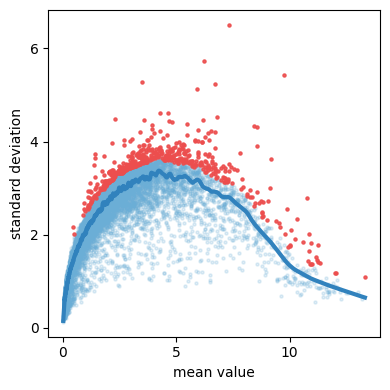

In [13]:
select_variable_genes(adata, loess_frac=0.01, n_genes=500)
adata = adata[:, adata.uns["var_genes"]]

/home/louise/miniforge3/envs/dynchro/lib/python3.12/site-packages/scanpy/plotting/_utils.py:465: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


AttributeError: 'Legend' object has no attribute 'legendHandles'

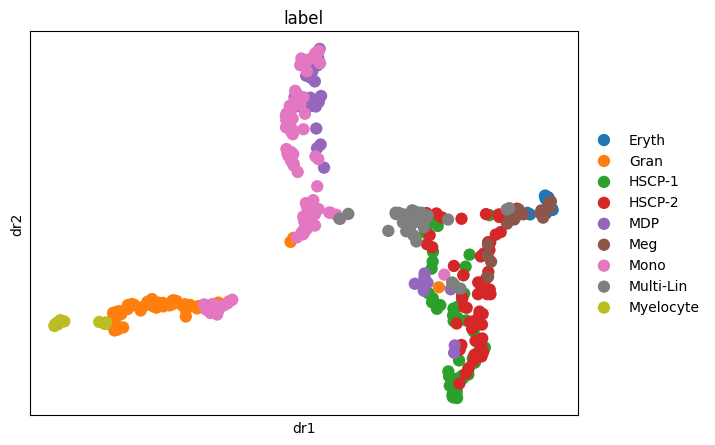

In [14]:
sc.pl.scatter(adata, color='label', basis='dr')

Importing precomputed umap visualization ...
Importing precomputed umap visualization ...


/tmp/ipykernel_21835/1666004347.py:165: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  adata.uns[ann+'_color'] = {df_plot_shuf[ann][i]:'#%02x%02x%02x' % (colors_sns_scaled[i][0], colors_sns_scaled[i][1], colors_sns_scaled[i][2])
/tmp/ipykernel_21835/1666004347.py:165: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  adata.uns[ann+'_color'] = {df_plot_shuf[ann][i]:'#%02x%02x%02x' % (colors_sns_scaled[i][0], colors_sns_scaled[i][1], colors_sns_scaled[i][2])


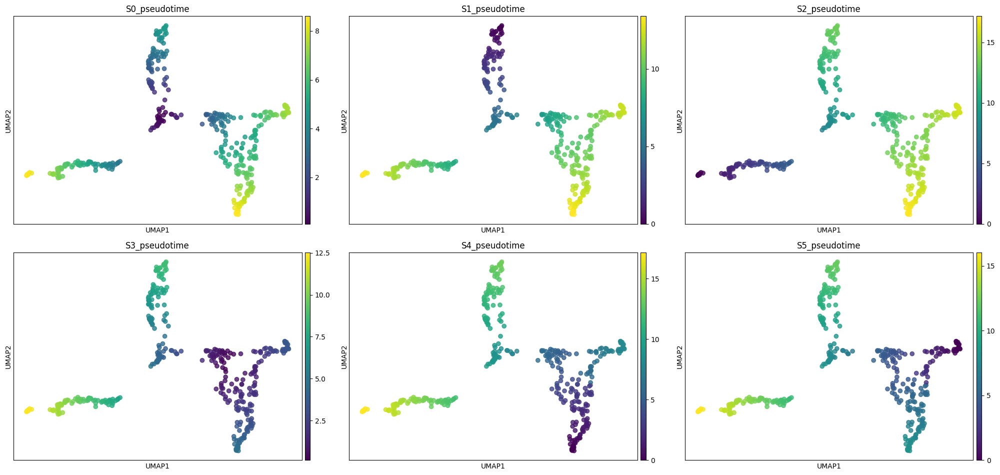

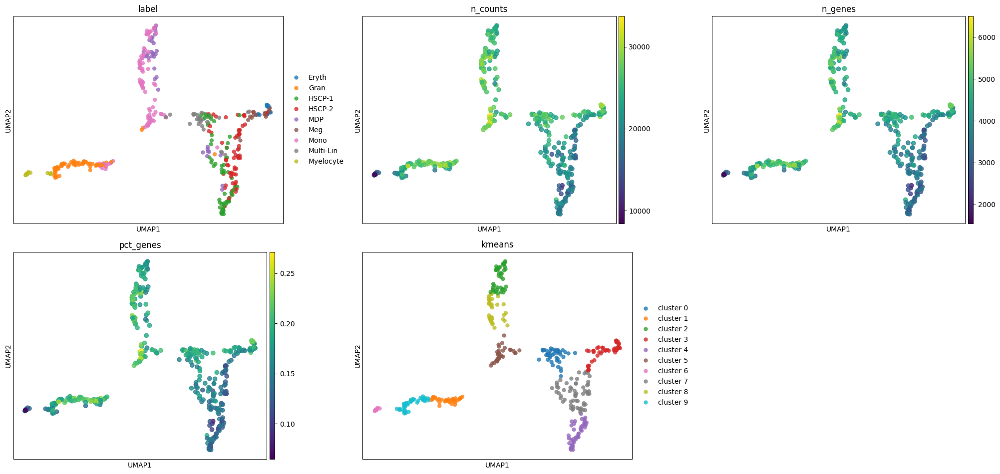

In [16]:
plot_visualization_2D(adata,n_neighbors=50,method='umap',color=['S0_pseudotime', 'S1_pseudotime', 'S2_pseudotime', 'S3_pseudotime', 'S4_pseudotime', 'S5_pseudotime'],use_precomputed=True)
plot_visualization_2D(adata,n_neighbors=50,method='umap',color=['label', 'n_counts', 'n_genes', 'pct_genes', 'kmeans'],use_precomputed=True)

In [17]:
adata.obs["branch_id_id"] = [list(adata.obs["branch_id"].cat.categories).index(x) for x in adata.obs["branch_id"]]


Importing precomputed umap visualization ...


/tmp/ipykernel_21835/1666004347.py:165: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  adata.uns[ann+'_color'] = {df_plot_shuf[ann][i]:'#%02x%02x%02x' % (colors_sns_scaled[i][0], colors_sns_scaled[i][1], colors_sns_scaled[i][2])


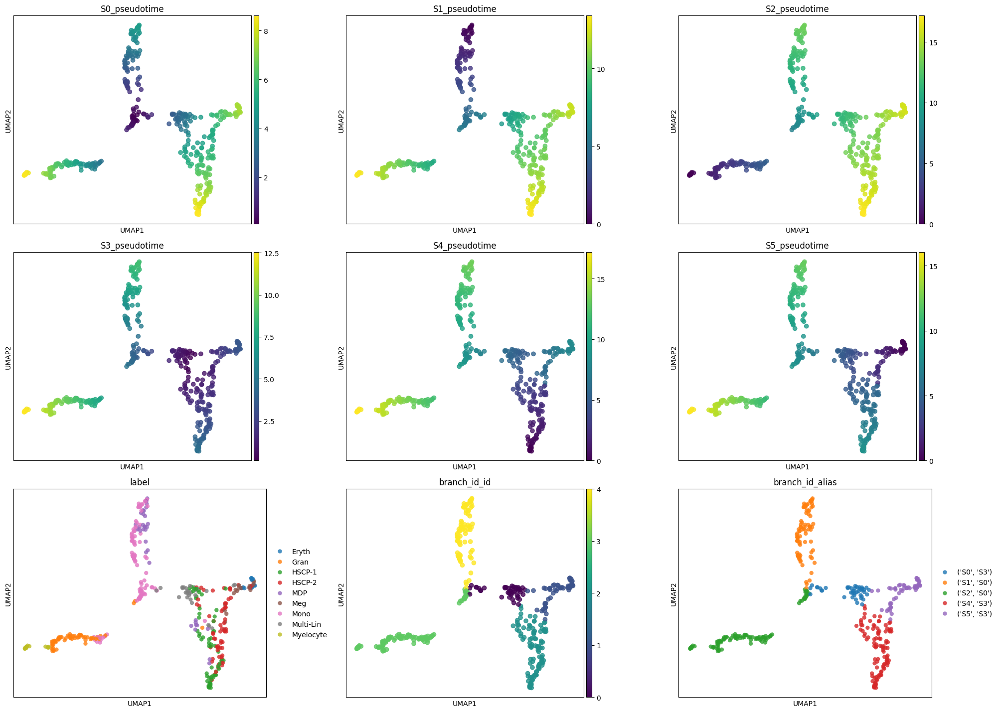

In [18]:
plot_visualization_2D(adata,n_neighbors=50,method='umap',color=['S0_pseudotime', 'S1_pseudotime', 'S2_pseudotime', 'S3_pseudotime', 'S4_pseudotime', 'S5_pseudotime', 'label', 'branch_id_id', 'branch_id_alias'],use_precomputed=True)

From the above figures, we can see that S4_pseudotime is most likely to be the pseudotimevalues used for the dataset if we compare with the results from the paper.

In [19]:
del adata.obsm["var_genes"]

In [20]:
adata.obsm

AxisArrays with keys: X_dr, X_mlle, X_spring, X_stream_S4, X_vis, X_vis_umap

In [21]:
adata.obs["pseudotime"] = adata.obs["S4_pseudotime"]
adata.obs["milestones"] = adata.obs["branch_id_id"]
lineages = {"erythrocytic": [2, 1], "monocytic": [2, 0, 4], "granulocytic": [2, 0, 3]}
adata.uns["lineages"] = lineages
# adata.write_h5ad("dynchro_prepped_orig.h5ad")

## 2.2 Explore combination of both datasets

500 variable genes are selected


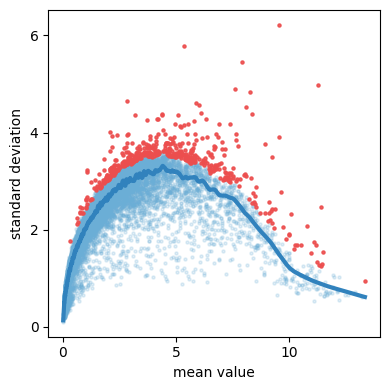

In [22]:
select_variable_genes(adata_all, loess_frac=0.01, n_genes=500)

In [23]:
dimension_reduction(adata_all, method='mlle',feature='var_genes',n_components=4,n_neighbors=50,n_jobs=4)

feature var_genes is being used ...
4 cpus are being used ...


/home/louise/miniforge3/envs/dynchro/lib/python3.12/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/tmp/ipykernel_21835/1666004347.py:165: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  adata.uns[ann+'_color'] = {df_plot_shuf[ann][i]:'#%02x%02x%02x' % (colors_sns_scaled[i][0], colors_sns_scaled[i][1], colors_sns_scaled[i][2])
/tmp/ipykernel_21835/1666004347.py:165: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  adata.uns[ann+'_co

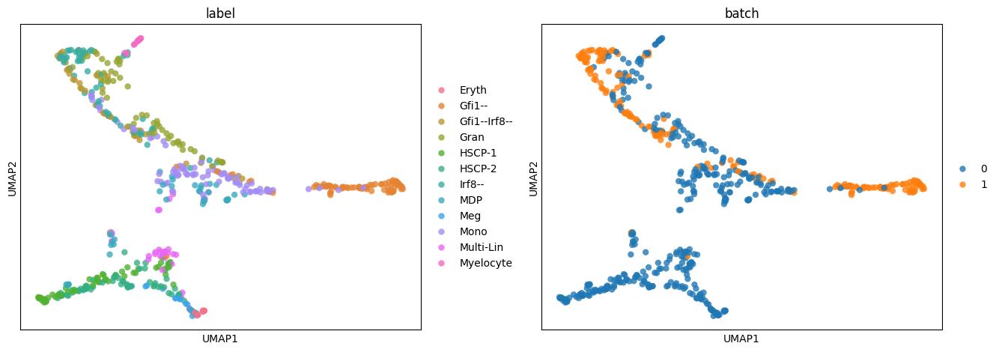

In [24]:
plot_visualization_2D(adata_all,n_neighbors=50,method='umap',color=['label','batch'],use_precomputed=False)

They do seem to be quite well defined and localised near where they should be here already.

## 2.3 Knockout data

/home/louise/miniforge3/envs/dynchro/lib/python3.12/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/home/louise/miniforge3/envs/dynchro/lib/python3.12/site-packages/shapely/measurement.py:72: RuntimeWarning: invalid value encountered in distance
  return lib.distance(a, b, **kwargs)
/home/louise/miniforge3/envs/dynchro/lib/python3.12/site-packages/shapely/measurement.py:72: RuntimeWarning: invalid value encountered in distance
  return lib.distance(a, b, **kwargs)
/home/louise/miniforge3/envs/dynchro/lib/python3.12/site-packages/shapely/measurement.py:72: RuntimeWarning: invalid value encountered in distance
  return lib.distance(a, b, **kwargs)
/home/louise/miniforge3/envs/dynchro/lib/python3.12/site-packages/shapely/measurement.py:72: RuntimeWarning: invalid value encountered in distance
  return lib.distance(a, b, **kwargs)
/home/louise/miniforge3/envs/dynchro/lib/pytho

500 variable genes are selected


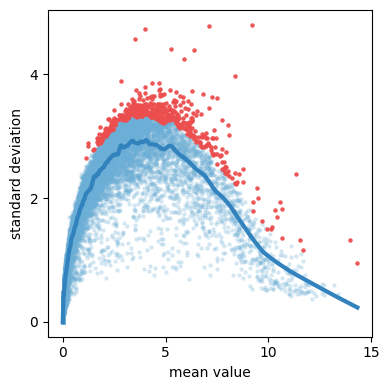

In [25]:
select_variable_genes(adata_ko, loess_frac=0.01, n_genes=500)

In [26]:
dimension_reduction(adata_ko, method="mlle", feature="var_genes", n_components=4, n_neighbors=50, n_jobs=4)

feature var_genes is being used ...
4 cpus are being used ...


In [27]:
dimension_reduction(adata_ko, method="pca", feature="var_genes", n_components=10, n_neighbors=50, n_jobs=4)

feature var_genes is being used ...
4 cpus are being used ...


In [28]:
for k, v in adata_ko.uns["label_color"].items():
    adata_ko.uns["label_color"][k] = v[0]

/home/louise/miniforge3/envs/dynchro/lib/python3.12/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


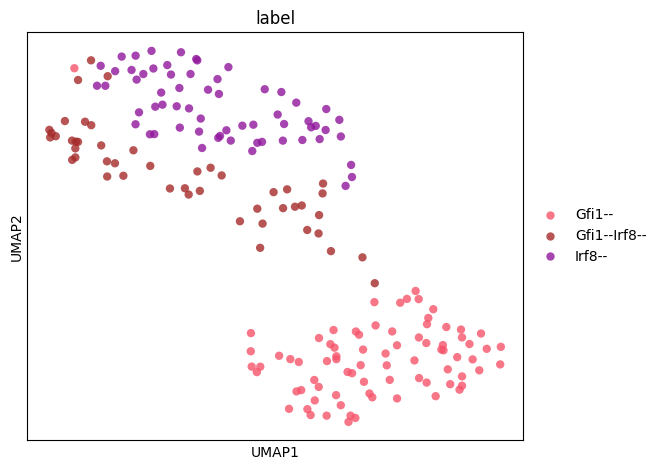

In [29]:
plot_visualization_2D(adata_ko, n_neighbors=50, method="umap", color = ["label"], use_precomputed=False)

In [30]:
# select only highly variable genes
adata_ko = adata_ko[:, adata_ko.uns["var_genes"]]

In [31]:
irf8 = adata_ko[adata_ko.obs.label == "Irf8--"]
gfi1 = adata_ko[adata_ko.obs.label == "Gfi1--"]
both = adata_ko[adata_ko.obs.label == "Gfi1--Irf8--"]
irf8, gfi1, both

(View of AnnData object with n_obs × n_vars = 62 × 500
     obs: 'label'
     uns: 'label_color', 'workdir', 'var_genes', 'trans_mlle', 'params', 'trans_pca', 'vis_trans_umap'
     obsm: 'var_genes', 'X_mlle', 'X_dr', 'X_pca', 'X_vis_umap', 'X_vis',
 View of AnnData object with n_obs × n_vars = 79 × 500
     obs: 'label'
     uns: 'label_color', 'workdir', 'var_genes', 'trans_mlle', 'params', 'trans_pca', 'vis_trans_umap'
     obsm: 'var_genes', 'X_mlle', 'X_dr', 'X_pca', 'X_vis_umap', 'X_vis',
 View of AnnData object with n_obs × n_vars = 47 × 500
     obs: 'label'
     uns: 'label_color', 'workdir', 'var_genes', 'trans_mlle', 'params', 'trans_pca', 'vis_trans_umap'
     obsm: 'var_genes', 'X_mlle', 'X_dr', 'X_pca', 'X_vis_umap', 'X_vis')

In [32]:
mapped_irf8 = ad.read_h5ad("irf8_mapped.h5ad")
mapped_gfi1 = ad.read_h5ad("gfil_mapped.h5ad")
mapped_both = ad.read_h5ad("both_mapped.h5ad")
mapped_irf8, mapped_gfi1, mapped_both

(AnnData object with n_obs × n_vars = 62 × 23955
     obs: 'label', 'node', 'branch_id', 'branch_id_alias', 'branch_lam', 'branch_dist', 'S0_pseudotime', 'S3_pseudotime', 'S5_pseudotime', 'S4_pseudotime', 'S2_pseudotime', 'S1_pseudotime', 'batch'
     uns: 'epg', 'flat_tree', 'label_color', 'var_genes', 'vis_trans_umap', 'workdir'
     obsm: 'X_dr', 'X_vis_umap', 'var_genes',
 AnnData object with n_obs × n_vars = 79 × 23955
     obs: 'label', 'node', 'branch_id', 'branch_id_alias', 'branch_lam', 'branch_dist', 'S0_pseudotime', 'S3_pseudotime', 'S5_pseudotime', 'S4_pseudotime', 'S2_pseudotime', 'S1_pseudotime', 'batch'
     uns: 'epg', 'flat_tree', 'label_color', 'var_genes', 'vis_trans_umap', 'workdir'
     obsm: 'X_dr', 'X_vis_umap', 'var_genes',
 AnnData object with n_obs × n_vars = 47 × 23955
     obs: 'label', 'node', 'branch_id', 'branch_id_alias', 'branch_lam', 'branch_dist', 'S0_pseudotime', 'S3_pseudotime', 'S5_pseudotime', 'S4_pseudotime', 'S2_pseudotime', 'S1_pseudotime', 'ba

In [33]:
# presume that the mapped pseudotime is the real pseudotime for the KO samples
irf8.obs["pseudotime"] = mapped_irf8.obs["S4_pseudotime"].values
gfi1.obs["pseudotime"] = mapped_gfi1.obs["S4_pseudotime"].values
both.obs["pseudotime"] = mapped_both.obs["S4_pseudotime"].values
irf8, gfi1, both

/tmp/ipykernel_21835/3458327699.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  irf8.obs["pseudotime"] = mapped_irf8.obs["S4_pseudotime"].values
/tmp/ipykernel_21835/3458327699.py:3: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  gfi1.obs["pseudotime"] = mapped_gfi1.obs["S4_pseudotime"].values
/tmp/ipykernel_21835/3458327699.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  both.obs["pseudotime"] = mapped_both.obs["S4_pseudotime"].values


(AnnData object with n_obs × n_vars = 62 × 500
     obs: 'label', 'pseudotime'
     uns: 'label_color', 'workdir', 'var_genes', 'trans_mlle', 'params', 'trans_pca', 'vis_trans_umap'
     obsm: 'var_genes', 'X_mlle', 'X_dr', 'X_pca', 'X_vis_umap', 'X_vis',
 AnnData object with n_obs × n_vars = 79 × 500
     obs: 'label', 'pseudotime'
     uns: 'label_color', 'workdir', 'var_genes', 'trans_mlle', 'params', 'trans_pca', 'vis_trans_umap'
     obsm: 'var_genes', 'X_mlle', 'X_dr', 'X_pca', 'X_vis_umap', 'X_vis',
 AnnData object with n_obs × n_vars = 47 × 500
     obs: 'label', 'pseudotime'
     uns: 'label_color', 'workdir', 'var_genes', 'trans_mlle', 'params', 'trans_pca', 'vis_trans_umap'
     obsm: 'var_genes', 'X_mlle', 'X_dr', 'X_pca', 'X_vis_umap', 'X_vis')

# 3. Dynchro analysis

In [35]:
lineages = {"erythrocytic": [2, 1], "monocytic": [2, 0, 4], "granulocytic": [2, 0, 3]}
adata, irf8, gfi1, both, lineages

(AnnData object with n_obs × n_vars = 382 × 500
     obs: 'label', 'n_counts', 'n_genes', 'pct_genes', 'kmeans', 'node', 'branch_id', 'branch_id_alias', 'branch_lam', 'branch_dist', 'S0_pseudotime', 'S3_pseudotime', 'S5_pseudotime', 'S4_pseudotime', 'S2_pseudotime', 'S1_pseudotime', 'branch_id_id', 'pseudotime', 'milestones'
     var: 'n_counts', 'n_cells', 'pct_cells'
     uns: 'workdir', 'var_genes', 'label_colors', 'params', 'label_color', 'kmeans_color', 'branch_id_alias_color', 'lineages'
     obsm: 'X_dr', 'X_mlle', 'X_spring', 'X_stream_S4', 'X_vis', 'X_vis_umap',
 AnnData object with n_obs × n_vars = 62 × 500
     obs: 'label', 'pseudotime'
     uns: 'label_color', 'workdir', 'var_genes', 'trans_mlle', 'params', 'trans_pca', 'vis_trans_umap'
     obsm: 'var_genes', 'X_mlle', 'X_dr', 'X_pca', 'X_vis_umap', 'X_vis',
 AnnData object with n_obs × n_vars = 79 × 500
     obs: 'label', 'pseudotime'
     uns: 'label_color', 'workdir', 'var_genes', 'trans_mlle', 'params', 'trans_pca', '

## 3.1 Prep samples

In [36]:
# Run lineage prep on adata
adata.uns["id"] = "wildtype"
adata.uns["lineages"] = lineages
adata.obs["milestones"] = adata.obs["branch_id_id"]
for name, labels in lineages.items():
    adata = dynchro.pp.label_lineage(adata, "milestones", labels, name)
for name, labels in lineages.items():
    adata = dynchro.pp.calculate_pseudocells(adata, 50, name)
adata = dynchro.pp.merge_pseudocells_lineages(adata, list(lineages.keys()), 50)
adata

/home/louise/Work/dynchro/src/dynchro/pp/pseudocells.py:53: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[f"transition_matrix_{amount}"] = np.array(
/home/louise/Work/dynchro/src/dynchro/pp/pseudocells.py:108: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pseudotimes_sorted = pseudotimes[np.argsort(pseudotimes)]
/home/louise/Work/dynchro/src/dynchro/pp/pseudocells.py:139: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cur_score = scipy.stats.percentileofscore(cell_pseudotime, pseudotimes_sorted[cur])
/home/louise/Work/dynchro/src/dynchro/pp/pseudocell

AnnData object with n_obs × n_vars = 382 × 500
    obs: 'label', 'n_counts', 'n_genes', 'pct_genes', 'kmeans', 'node', 'branch_id', 'branch_id_alias', 'branch_lam', 'branch_dist', 'S0_pseudotime', 'S3_pseudotime', 'S5_pseudotime', 'S4_pseudotime', 'S2_pseudotime', 'S1_pseudotime', 'branch_id_id', 'pseudotime', 'milestones', 'erythrocytic', 'monocytic', 'granulocytic'
    var: 'n_counts', 'n_cells', 'pct_cells'
    uns: 'workdir', 'var_genes', 'label_colors', 'params', 'label_color', 'kmeans_color', 'branch_id_alias_color', 'lineages', 'id', 'lineage_labels', 'pseudocells_50_erythrocytic_pseudotime', 'pseudocells', 'pseudocells_50_monocytic_pseudotime', 'pseudocells_50_granulocytic_pseudotime'
    obsm: 'X_dr', 'X_mlle', 'X_spring', 'X_stream_S4', 'X_vis', 'X_vis_umap'
    varm: 'pseudocells_50_erythrocytic', 'pseudocells_50_monocytic', 'pseudocells_50_granulocytic'

In [37]:
# Run lineage prep on irf8, gfi1, both
irf8.uns["id"] = "irf8"
gfi1.uns["id"] = "gfi1"
both.uns["id"] = "both"

for a in [irf8, gfi1, both]:
    a.uns["lineages"] = lineages
    a.obs["milestones"] = 1
    a = dynchro.pp.label_lineage(a, "milestones", [1], a.uns["id"])
    a = dynchro.pp.calculate_pseudocells(a, 50, a.uns["id"])

irf8, gfi1, both

/home/louise/Work/dynchro/src/dynchro/pp/pseudocells.py:53: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[f"transition_matrix_{amount}"] = np.array(
/home/louise/Work/dynchro/src/dynchro/pp/pseudocells.py:53: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[f"transition_matrix_{amount}"] = np.array(
/home/louise/Work/dynchro/src/dynchro/pp/pseudocells.py:53: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[f"transition_matrix_{amount}"] = np.array(


(AnnData object with n_obs × n_vars = 62 × 500
     obs: 'label', 'pseudotime', 'milestones', 'irf8'
     uns: 'label_color', 'workdir', 'var_genes', 'trans_mlle', 'params', 'trans_pca', 'vis_trans_umap', 'id', 'lineages', 'lineage_labels', 'pseudocells_50_irf8_pseudotime', 'pseudocells'
     obsm: 'var_genes', 'X_mlle', 'X_dr', 'X_pca', 'X_vis_umap', 'X_vis'
     varm: 'pseudocells_50_irf8',
 AnnData object with n_obs × n_vars = 79 × 500
     obs: 'label', 'pseudotime', 'milestones', 'gfi1'
     uns: 'label_color', 'workdir', 'var_genes', 'trans_mlle', 'params', 'trans_pca', 'vis_trans_umap', 'id', 'lineages', 'lineage_labels', 'pseudocells_50_gfi1_pseudotime', 'pseudocells'
     obsm: 'var_genes', 'X_mlle', 'X_dr', 'X_pca', 'X_vis_umap', 'X_vis'
     varm: 'pseudocells_50_gfi1',
 AnnData object with n_obs × n_vars = 47 × 500
     obs: 'label', 'pseudotime', 'milestones', 'both'
     uns: 'label_color', 'workdir', 'var_genes', 'trans_mlle', 'params', 'trans_pca', 'vis_trans_umap', 'id

In [38]:
irf8.uns["var_genes"] = irf8.uns["var_genes"].to_list()
gfi1.uns["var_genes"] = gfi1.uns["var_genes"].to_list()
both.uns["var_genes"] = both.uns["var_genes"].to_list()

In [39]:
irf8.uns["trans_pca"] = []
gfi1.uns["trans_pca"] = []
both.uns["trans_pca"] = []
irf8.uns["vis_trans_umap"] = []
gfi1.uns["vis_trans_umap"] = []
both.uns["vis_trans_umap"] = []
irf8.uns["pseudocells_50_irf8_pseudotime"] = irf8.uns["pseudocells_50_irf8_pseudotime"].to_dict()
gfi1.uns["pseudocells_50_gfi1_pseudotime"] = gfi1.uns["pseudocells_50_gfi1_pseudotime"].to_dict()
both.uns["pseudocells_50_both_pseudotime"] = both.uns["pseudocells_50_both_pseudotime"].to_dict()

In [40]:
irf8.uns["trans_mlle"] = []
gfi1.uns["trans_mlle"] = []
both.uns["trans_mlle"] = []

In [41]:
adata.uns["var_genes"] = adata.uns["var_genes"].to_list()

In [42]:
adata.write_h5ad("dynchro_prepped_orig.h5ad")
irf8.write_h5ad("dynchro_prepped_irf8.h5ad")
gfi1.write_h5ad("dynchro_prepped_gfi1.h5ad")
both.write_h5ad("dynchro_prepped_both.h5ad")

## 3.2 Run dynchro

In [43]:
adata = ad.read_h5ad("dynchro_prepped_orig.h5ad")
irf8 = ad.read_h5ad("dynchro_prepped_irf8.h5ad")
gfi1 = ad.read_h5ad("dynchro_prepped_gfi1.h5ad")
both = ad.read_h5ad("dynchro_prepped_both.h5ad")

AttributeError: 'Legend' object has no attribute 'legendHandles'

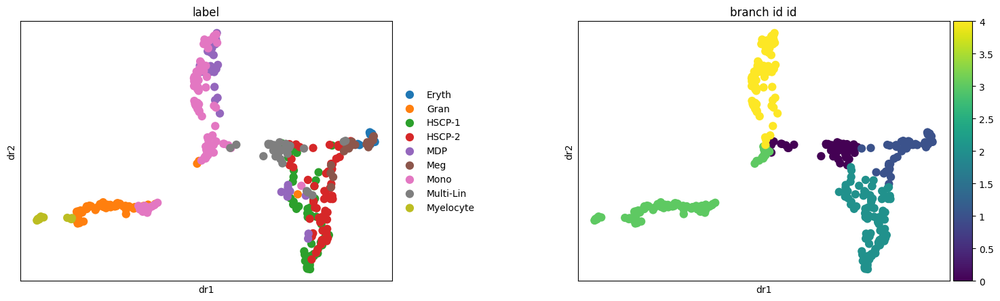

In [44]:
sc.pl.scatter(adata, color=['label', 'branch_id_id'], basis='dr')
# we don't need the cells labeled 1 and 2 in branch_id_id

AttributeError: 'Legend' object has no attribute 'legendHandles'

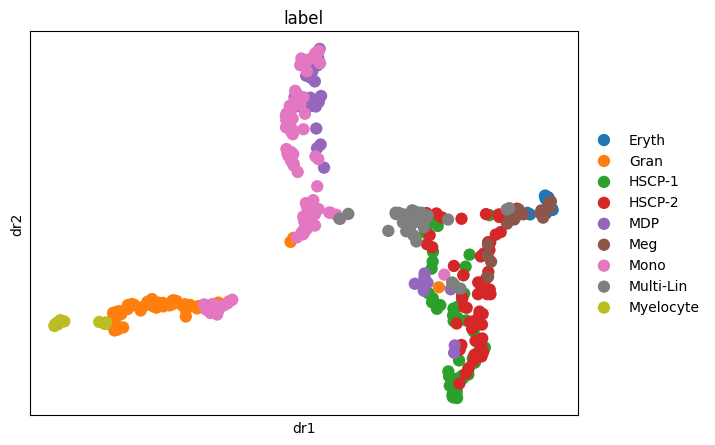

In [45]:
sc.pl.scatter(adata, color='label', basis='dr')
sc.pl.scatter(adata, color='pseudotime', basis='dr')

In [46]:
adata, irf8, gfi1, both

(AnnData object with n_obs × n_vars = 382 × 500
     obs: 'label', 'n_counts', 'n_genes', 'pct_genes', 'kmeans', 'node', 'branch_id', 'branch_id_alias', 'branch_lam', 'branch_dist', 'S0_pseudotime', 'S3_pseudotime', 'S5_pseudotime', 'S4_pseudotime', 'S2_pseudotime', 'S1_pseudotime', 'branch_id_id', 'pseudotime', 'milestones', 'erythrocytic', 'monocytic', 'granulocytic'
     var: 'n_counts', 'n_cells', 'pct_cells'
     uns: 'branch_id_alias_color', 'id', 'kmeans_color', 'label_color', 'label_colors', 'lineage_labels', 'lineages', 'params', 'pseudocells', 'pseudocells_50_erythrocytic_pseudotime', 'pseudocells_50_granulocytic_pseudotime', 'pseudocells_50_monocytic_pseudotime', 'var_genes', 'workdir'
     obsm: 'X_dr', 'X_mlle', 'X_spring', 'X_stream_S4', 'X_vis', 'X_vis_umap'
     varm: 'pseudocells_50_erythrocytic', 'pseudocells_50_granulocytic', 'pseudocells_50_monocytic',
 AnnData object with n_obs × n_vars = 62 × 500
     obs: 'label', 'pseudotime', 'milestones', 'irf8'
     uns: 'id'

In [47]:
adata.obsm["var_genes"][0]

KeyError: 'var_genes'

In [48]:
def calculate_single_correlation(cost_matrix, dist_cells1, dist_cells2):
    distances = []
    for x in dist_cells1:
        for y in dist_cells2:
            distances.append(abs(x-y))
    costs = []
    for i in range(len(cost_matrix)):
        for j in range(len(cost_matrix[i])):
            costs.append(cost_matrix[i][j])

    import scipy as sp
    corr = sp.stats.pearsonr(costs, distances)[0]
    return corr

In [49]:
def run_matching_lineages(data, ko):
    config = {
        "compare_lineages_pseudocells": False,
        "compare_lineages_pseudocells_label": "pseudocells_50",
        "compare_trajectories_pseudocells": False,
        "compare_trajectories_pseudocells_label": "pseudocells_50",
        "align_pseudocells": False,
    }
    res = dynchro.tl.get_matching_lineages([data, ko], config)
    res, data.uns["lineage_labels"]

In [50]:
run_matching_lineages(adata, irf8)
run_matching_lineages(adata, gfi1)
run_matching_lineages(adata, both)

In [51]:
def get_config(trajectories, sort = True):
    config = {
        "compare_lineages_pseudocells": False,
        "compare_lineages_pseudocells_label": "pseudocells_50",
        "compare_trajectories_pseudocells": False,
        "compare_trajectories_pseudocells_label": "pseudocells_50",
        "align_pseudocells": False,
    }


    common_vars = list(set.intersection(*(set(trajectory.var_names) for trajectory in trajectories)))

    lineages = [
        [
            dynchro.tl.get_counts_common_vars(trajectory, config, "compare_trajectories_pseudocells", linlabel, common_vars, get_x = False)
            for linlabel in trajectory.uns["lineage_labels"]
        ]
        for trajectory in trajectories
    ]

    if sort:
        lineages = [[ lin[np.argsort(lin.obs.pseudotime)] for lin in lineages1 ] for lineages1 in lineages]

    return lineages

In [52]:
def plot_cost_distances(cost, distances, path1, path2):
    fig, (ax1, ax2) = plt.subplots(1,2)
    fig.set_size_inches(12, 4)
    sns.heatmap(cost, ax = ax1)
    distances = distances[1:, 1:]
    sns.heatmap(distances, ax = ax2)
    plt.scatter(path2, path1, c = "white", s = 3)
    plt.show()

In [96]:
def plot_cost_distances(cost, distances, path1, path2):
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(12, 4)
    sns.heatmap(cost, ax=ax1)
    distances = distances[1:, 1:]
    sns.heatmap(distances, ax=ax2)
    plt.scatter(path2, path1, c="white", s=3)
    plt.show()


class DTWResult:
    def __init__(self, id, lin1, lin2, cost, distances, path1, path2, dist):
        self._id = id
        self._lin1 = lin1
        self._lin2 = lin2
        self._cost = cost
        self._distances = distances
        self._path1 = path1
        self._path2 = path2
        self._dist = dist
        self._dist_norm = dist / (lin1.X.shape[0] + lin2.X.shape[0])
        self._dist_norm_path = dist / len(path1)

    def id(self):
        return self._id

    def cost(self):
        return self._cost

    def distances(self):
        return self._distances

    def path1(self):
        return self._path1

    def path2(self):
        return self._path2

    def dist(self):
        return self._dist

    def dist_norm(self):
        return self._dist_norm

    def dist_norm_path(self):
        return self._dist_norm_path

    def get_warping(self):
        return self._path1, self._path2
    
    def __str__(self):
        return f"ID: {self._id}, Normalized distance: {self._dist_norm_path:.2f}"
    
    def __repr__(self):
        return self.__str__()

    def plot_cost_distances(self):
        plot_cost_distances(self._cost, self._distances, self._path1, self._path2)

In [75]:
def plot_comparisons_keep(adata, ko, label_ko, distance_measure = "euclidean", only_keep = None):
    lineages = get_config([adata, ko])

    results = []
    for lineage1, label in zip(lineages[0], adata.uns["lineage_labels"]):
        for lineage2 in lineages[1]:
            total_dist, cost, distances = dynchro.tl.skip_dtw(lineage2.X, lineage1.X, distance = distance_measure)
            path1, path2 = dynchro.tl.skip_traceback(distances)

            result = DTWResult(f"{label} {lineage2.uns["id"]}", lineage1, lineage2, cost, distances, path1, path2, total_dist)
            results.append(result)

            plot_cost_distances(cost, distances, path1, path2)

    return results

In [68]:
irf8.uns

{'id': 'irf8',
 'label_color': {'Gfi1--': '#F6546A',
  'Gfi1--Irf8--': '#A52A2A',
  'Irf8--': '#90179B'},
 'lineage_labels': array(['irf8'], dtype=object),
 'lineages': {'erythrocytic': array([2, 1]),
  'granulocytic': array([2, 0, 3]),
  'monocytic': array([2, 0, 4])},
 'params': {'dimension_reduction': {'feature': 'var_genes',
   'method': 'pca',
   'n_components': 10},
  'plot_visualization_2D': {'method': 'umap'}},
 'pseudocells': array(['pseudocells_50_irf8'], dtype=object),
 'pseudocells_50_irf8_pseudotime': {'pseudocell_irf8_0': 3.130042850499459,
  'pseudocell_irf8_1': 7.061366768856111,
  'pseudocell_irf8_10': 8.956026628259304,
  'pseudocell_irf8_11': 9.014098945693705,
  'pseudocell_irf8_12': 9.167745069040846,
  'pseudocell_irf8_13': 9.208333610161208,
  'pseudocell_irf8_14': 9.290313144218931,
  'pseudocell_irf8_15': 9.430406029648482,
  'pseudocell_irf8_16': 9.536711735309979,
  'pseudocell_irf8_17': 9.562108334679877,
  'pseudocell_irf8_18': 9.578524296595889,
  'pseudoc

In [54]:
adata[adata.obs.branch_id_id.isin([1,2])]
# adata.obs.branch_id_id


View of AnnData object with n_obs × n_vars = 155 × 500
    obs: 'label', 'n_counts', 'n_genes', 'pct_genes', 'kmeans', 'node', 'branch_id', 'branch_id_alias', 'branch_lam', 'branch_dist', 'S0_pseudotime', 'S3_pseudotime', 'S5_pseudotime', 'S4_pseudotime', 'S2_pseudotime', 'S1_pseudotime', 'branch_id_id', 'pseudotime', 'milestones', 'erythrocytic', 'monocytic', 'granulocytic'
    var: 'n_counts', 'n_cells', 'pct_cells'
    uns: 'branch_id_alias_color', 'id', 'kmeans_color', 'label_color', 'label_colors', 'lineage_labels', 'lineages', 'params', 'pseudocells', 'pseudocells_50_erythrocytic_pseudotime', 'pseudocells_50_granulocytic_pseudotime', 'pseudocells_50_monocytic_pseudotime', 'var_genes', 'workdir'
    obsm: 'X_dr', 'X_mlle', 'X_spring', 'X_stream_S4', 'X_vis', 'X_vis_umap'
    varm: 'pseudocells_50_erythrocytic', 'pseudocells_50_granulocytic', 'pseudocells_50_monocytic'

In [55]:
def plot_comparisons(adata, ko, label_ko, distance_measure = "euclidean"):
    trajectories = [adata, ko]

    # select only relevant part
    lineages = get_config(trajectories)

    results = []
    for lineage1, label in zip(lineages[0], adata.uns["lineage_labels"]):
        for lineage2 in lineages[1]:
            total_dist, cost, distances = dynchro.tl.skip_dtw(lineage2.X, lineage1.X, distance = distance_measure)
            total_dist_norm = total_dist / (lineage1.X.shape[0] + lineage2.X.shape[0])
            path1, path2 = dynchro.tl.skip_traceback(distances)
            print(max(path1), max(path2))

            total_dist_norm2 = total_dist / len(path1)

            pseudotime_d1_l1 = lineage1.obs.pseudotime
            pseudotime_d2_l1 = lineage2.obs.pseudotime
            pseudotime_d1_l1 = pseudotime_d1_l1[np.argsort(pseudotime_d1_l1)]
            pseudotime_d2_l1 = pseudotime_d2_l1[np.argsort(pseudotime_d2_l1)]

            corr = calculate_single_correlation(cost, pseudotime_d1_l1, pseudotime_d2_l1)

            plot_cost_distances(cost, distances, path1, path2)

            results.append(f"{label_ko.upper()},{label},{total_dist},{total_dist_norm},{total_dist_norm2},{corr}")
    # print("KO\tbranch_name\t\ttotal_dist\ttotal_dist_norm\t\ttotal_dist_norm_path\t\tcorr\n")
    print("\n".join(results))

### 3.2.1 Run with var_genes

62 155


/tmp/ipykernel_21835/3543606668.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pseudotime_d1_l1 = pseudotime_d1_l1[np.argsort(pseudotime_d1_l1)]
/tmp/ipykernel_21835/3543606668.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pseudotime_d2_l1 = pseudotime_d2_l1[np.argsort(pseudotime_d2_l1)]


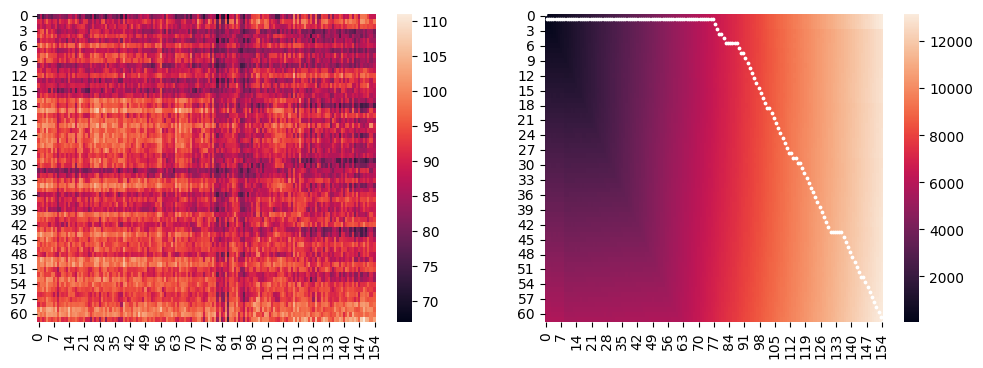

62 231


/tmp/ipykernel_21835/3543606668.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pseudotime_d1_l1 = pseudotime_d1_l1[np.argsort(pseudotime_d1_l1)]
/tmp/ipykernel_21835/3543606668.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pseudotime_d2_l1 = pseudotime_d2_l1[np.argsort(pseudotime_d2_l1)]


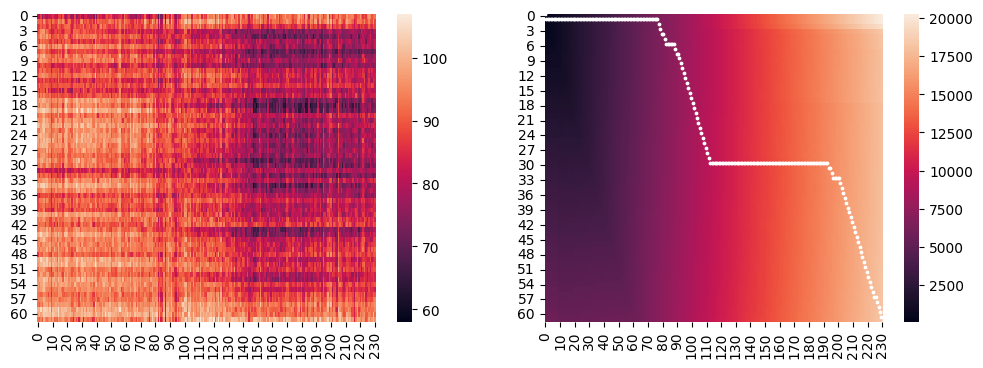

62 246


/tmp/ipykernel_21835/3543606668.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pseudotime_d1_l1 = pseudotime_d1_l1[np.argsort(pseudotime_d1_l1)]
/tmp/ipykernel_21835/3543606668.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pseudotime_d2_l1 = pseudotime_d2_l1[np.argsort(pseudotime_d2_l1)]


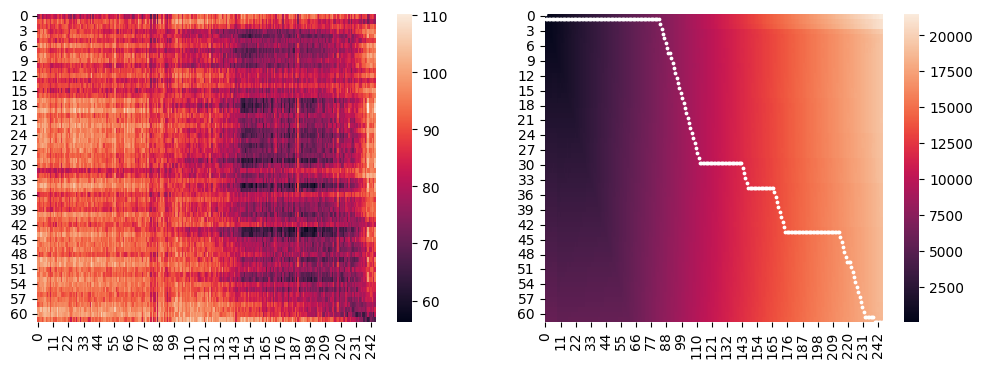

IRF8,erythrocytic,13148.442302353822,60.591900010847105,84.28488655355014,-0.27291035156977905
IRF8,monocytic,18238.73201798361,62.24823214328877,78.61522421544659,-0.1928060094866458
IRF8,granulocytic,18615.71883174877,60.44064555762588,75.36728271963065,0.0003506022183083176


In [56]:
plot_comparisons(adata, irf8, "irf8") #granulocytic, nr3

79 155


/tmp/ipykernel_21835/3543606668.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pseudotime_d1_l1 = pseudotime_d1_l1[np.argsort(pseudotime_d1_l1)]
/tmp/ipykernel_21835/3543606668.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pseudotime_d2_l1 = pseudotime_d2_l1[np.argsort(pseudotime_d2_l1)]


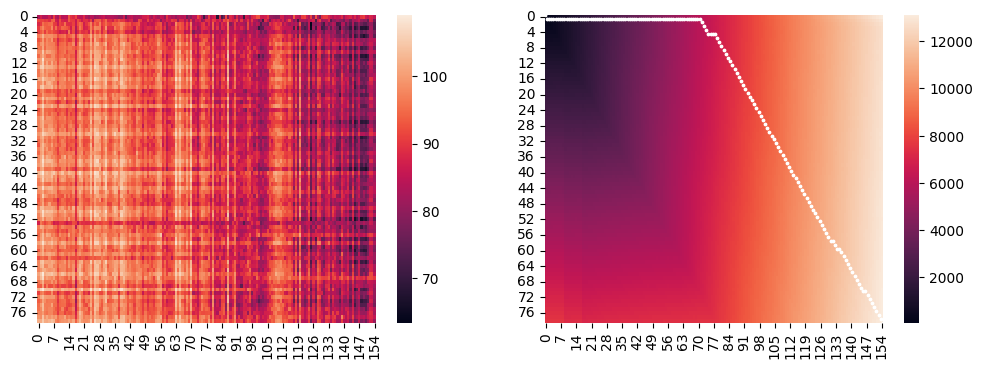

79 231


/tmp/ipykernel_21835/3543606668.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pseudotime_d1_l1 = pseudotime_d1_l1[np.argsort(pseudotime_d1_l1)]
/tmp/ipykernel_21835/3543606668.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pseudotime_d2_l1 = pseudotime_d2_l1[np.argsort(pseudotime_d2_l1)]


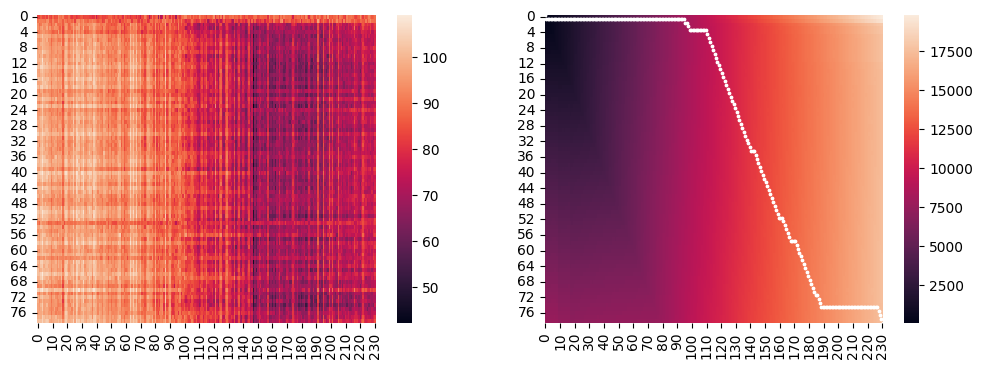

79 246


/tmp/ipykernel_21835/3543606668.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pseudotime_d1_l1 = pseudotime_d1_l1[np.argsort(pseudotime_d1_l1)]
/tmp/ipykernel_21835/3543606668.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pseudotime_d2_l1 = pseudotime_d2_l1[np.argsort(pseudotime_d2_l1)]


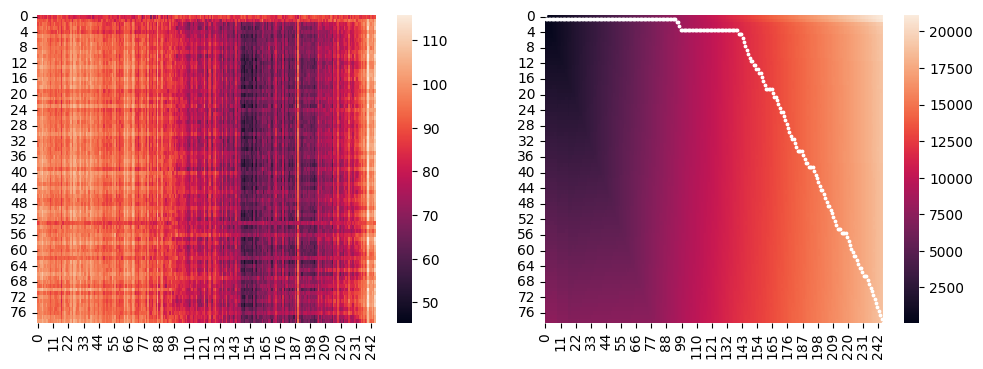

GFI1,erythrocytic,13119.564525049389,56.06651506431363,84.09977259647044,-0.09175351665710436
GFI1,monocytic,17527.54333082453,56.540462357498484,75.54975573631263,-0.02885245255203011
GFI1,granulocytic,18837.902786525923,57.96277780469515,76.26681290091467,0.006547445034718567


In [57]:
plot_comparisons(adata, gfi1, "gfi1") # == monocytic, nr 2

47 155


/tmp/ipykernel_21835/3543606668.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pseudotime_d1_l1 = pseudotime_d1_l1[np.argsort(pseudotime_d1_l1)]
/tmp/ipykernel_21835/3543606668.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pseudotime_d2_l1 = pseudotime_d2_l1[np.argsort(pseudotime_d2_l1)]


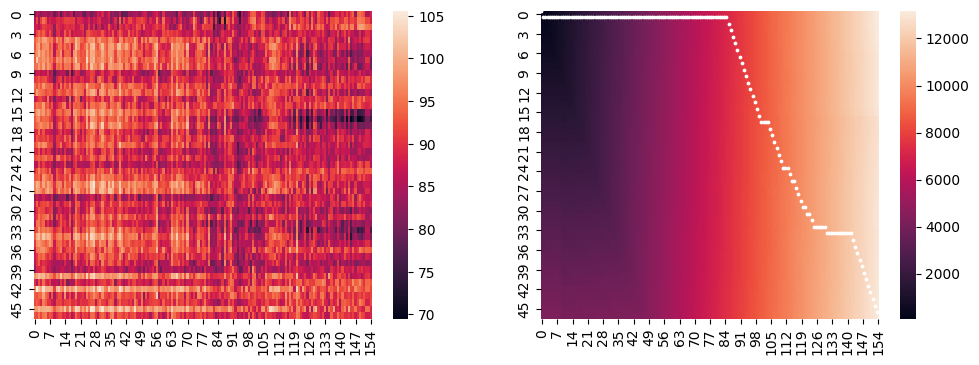

47 231


/tmp/ipykernel_21835/3543606668.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pseudotime_d1_l1 = pseudotime_d1_l1[np.argsort(pseudotime_d1_l1)]
/tmp/ipykernel_21835/3543606668.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pseudotime_d2_l1 = pseudotime_d2_l1[np.argsort(pseudotime_d2_l1)]


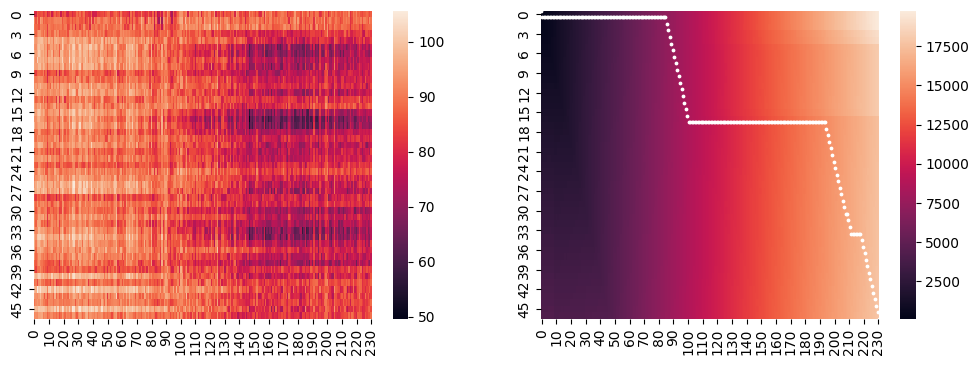

47 246


/tmp/ipykernel_21835/3543606668.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pseudotime_d1_l1 = pseudotime_d1_l1[np.argsort(pseudotime_d1_l1)]
/tmp/ipykernel_21835/3543606668.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pseudotime_d2_l1 = pseudotime_d2_l1[np.argsort(pseudotime_d2_l1)]


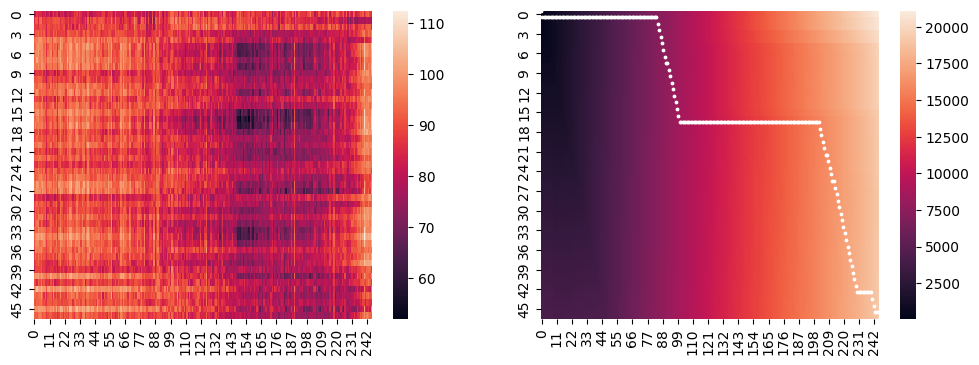

BOTH,erythrocytic,13087.145676903843,64.7878498856626,83.89195946733233,-0.10100258520494076
BOTH,monocytic,17775.177097929107,63.93948596377376,76.61714266348753,0.03411358852824156
BOTH,granulocytic,19069.935448142347,65.08510391857456,77.20621638924027,0.043166509447765185


In [58]:
plot_comparisons(adata, both, "both") # == none

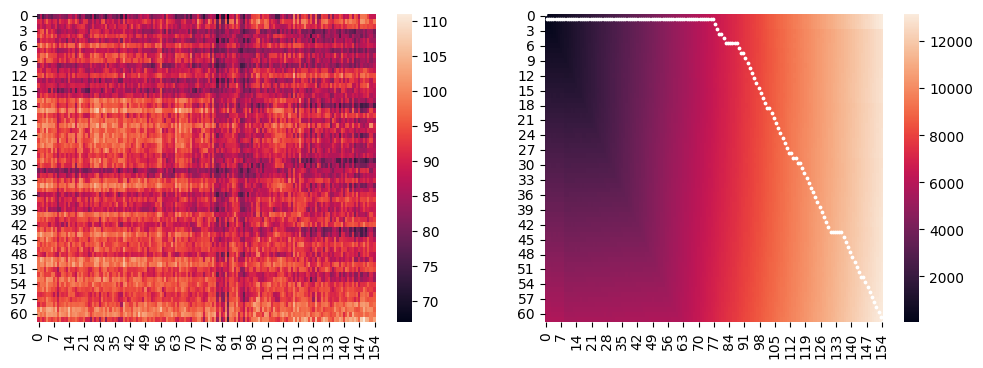

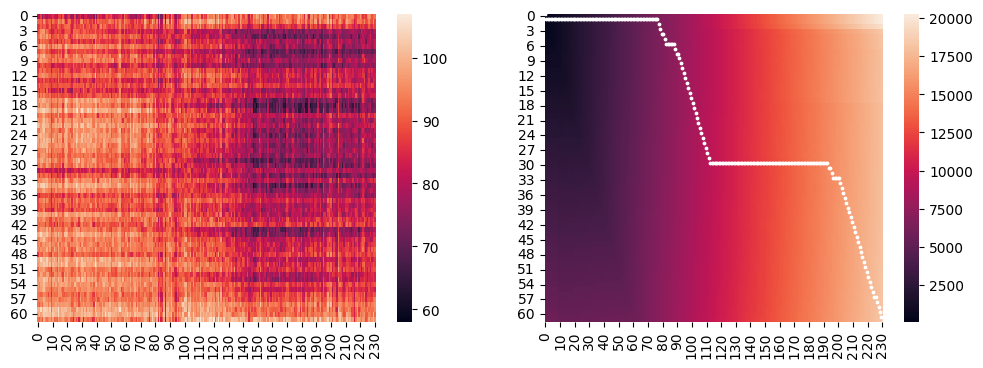

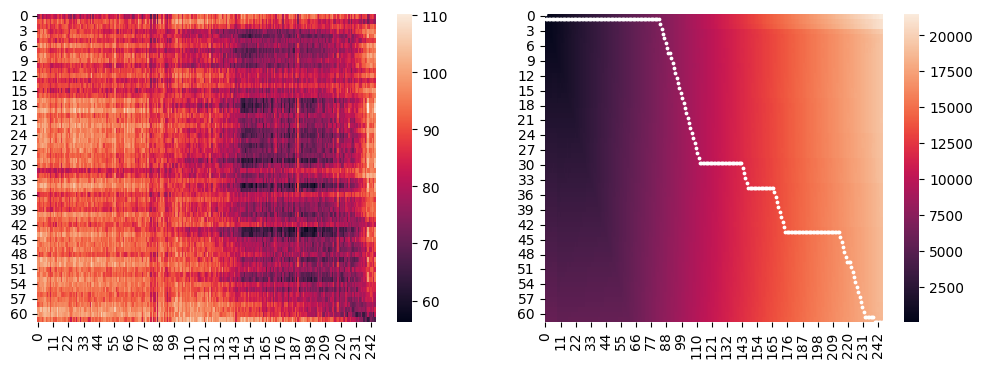

In [97]:
warping_irf8 = plot_comparisons_keep(adata, irf8, "irf8") #granulocytic, nr3

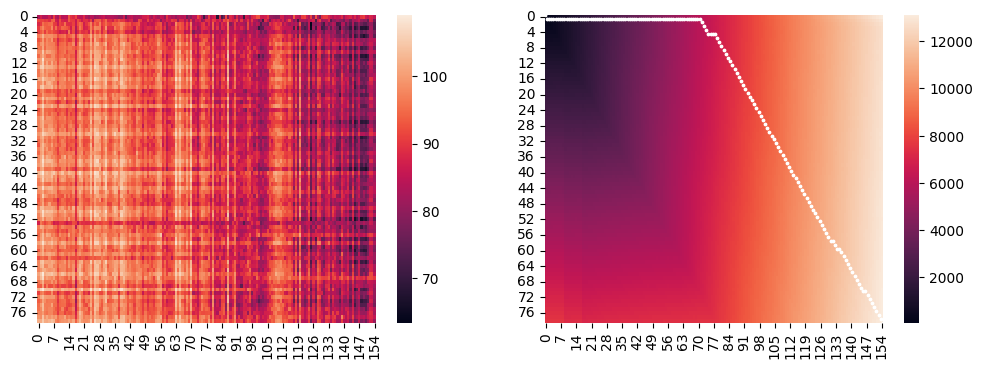

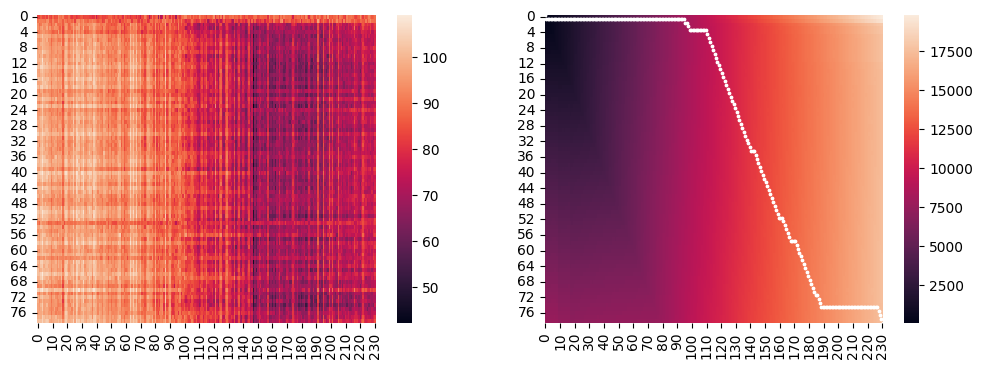

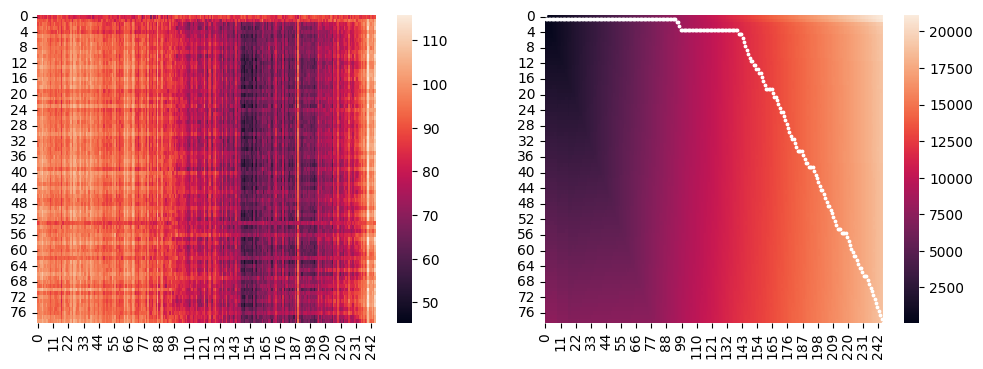

In [98]:
warping_gfi1 = plot_comparisons_keep(adata, gfi1, "gfi1") # == monocytic, nr 2

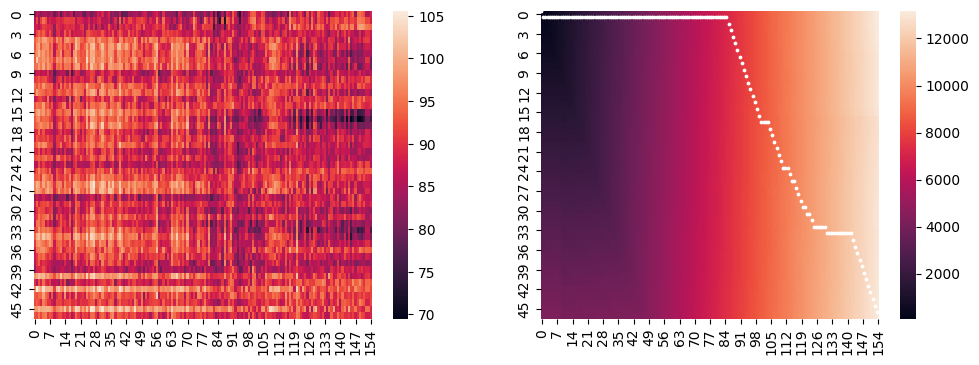

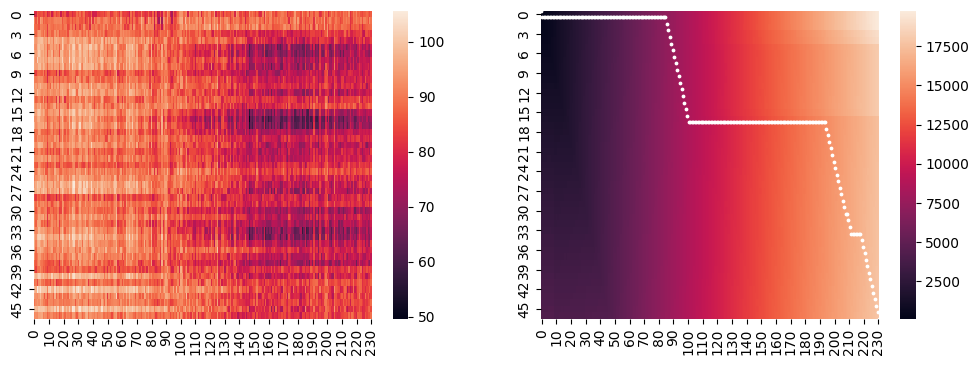

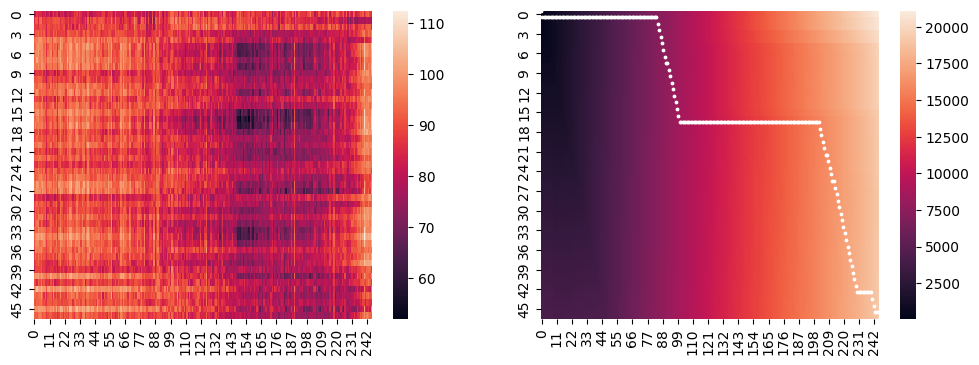

In [99]:
warping_both = plot_comparisons_keep(adata, both, "both") # == none

### 3.2.2 Permute pseudotimes

In [58]:
rng = np.random.default_rng()

def plot_comparisons_shuffle(adata, ko, label_ko, distance_measure = "correlation"):
    trajectories = [adata, ko]

    lineages = get_config(trajectories)

    # config = {
    #     "compare_lineages_pseudocells": False,
    #     "compare_lineages_pseudocells_label": "pseudocells_50",
    #     "compare_trajectories_pseudocells": False,
    #     "compare_trajectories_pseudocells_label": "pseudocells_50",
    #     "align_pseudocells": False,
    # }


    # common_vars = list(set.intersection(*(set(trajectory.var_names) for trajectory in trajectories)))

    # lineages = [
    #     [
    #         dynchro.tl.get_counts_common_vars(trajectory, config, "compare_trajectories_pseudocells", linlabel, common_vars)
    #         for linlabel in trajectory.uns["lineage_labels"]
    #     ]
    #     for trajectory in trajectories
    # ]
    lin2 = lineages[1][0].X.toarray()
    rng.shuffle(lin2)
    lineages[1][0].X = lin2
    results = []
    print(label_ko)
    for lineage1, label in zip(lineages[0], adata.uns["lineage_labels"]):
        
        for lineage2 in lineages[1]:
            total_dist, cost, distances = dynchro.tl.skip_dtw(lineage2.X, lineage1.X, distance = distance_measure)
            total_dist_norm = total_dist / (lineage1.X.shape[0] * lineage2.X.shape[0])
            path1, path2 = dynchro.tl.skip_traceback(distances[1:, 1:])
            print(max(path1), max(path2))

            fig, (ax1, ax2) = plt.subplots(1,2)
            fig.set_size_inches(12, 4)
            sns.heatmap(cost, ax = ax1)
            distances = distances[1:, 1:]
            sns.heatmap(distances, ax = ax2)
            # plot the path
            # path1 = [max(path1) - x for x in path1]
            plt.scatter(path2, path1, c = "white")
            plt.show()

            results.append(f"{label_ko.upper()}: \t{label}: \t{total_dist}, \t{total_dist_norm}\n")

    print("".join(results))

irf8
61 154


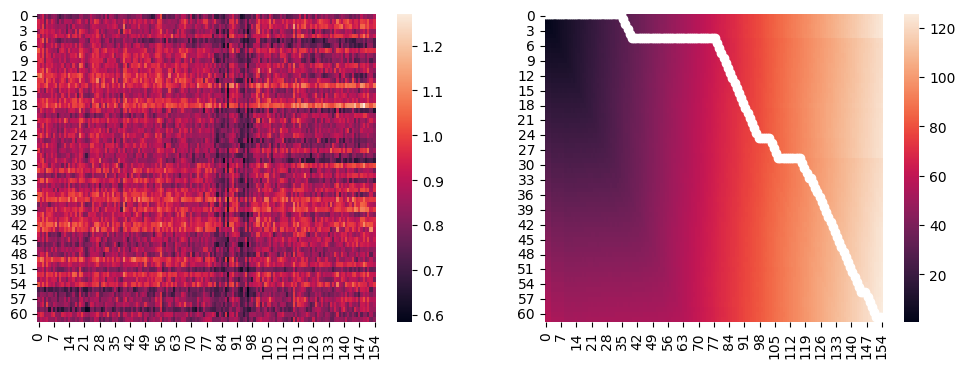

61 230


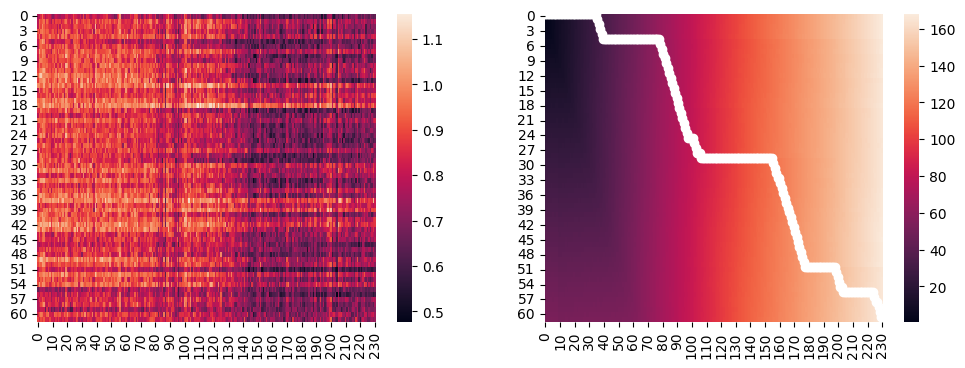

61 245


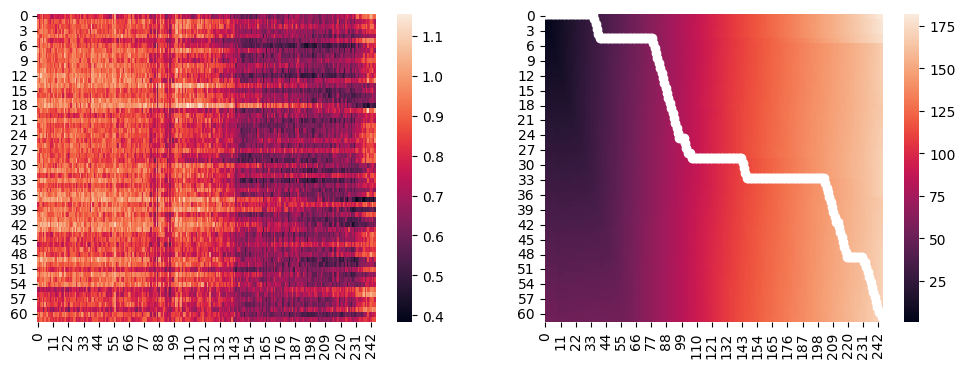

IRF8: 	erythrocytic: 	125.72487978462695, 	0.013082713817338913
IRF8: 	monocytic: 	166.3821269911326, 	0.01161724109699292
IRF8: 	granulocytic: 	170.8655887609525, 	0.01120283167853085

irf8
61 154


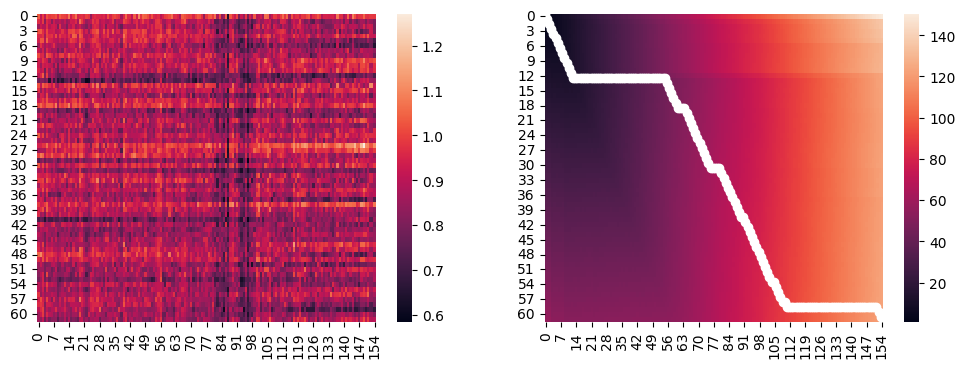

61 230


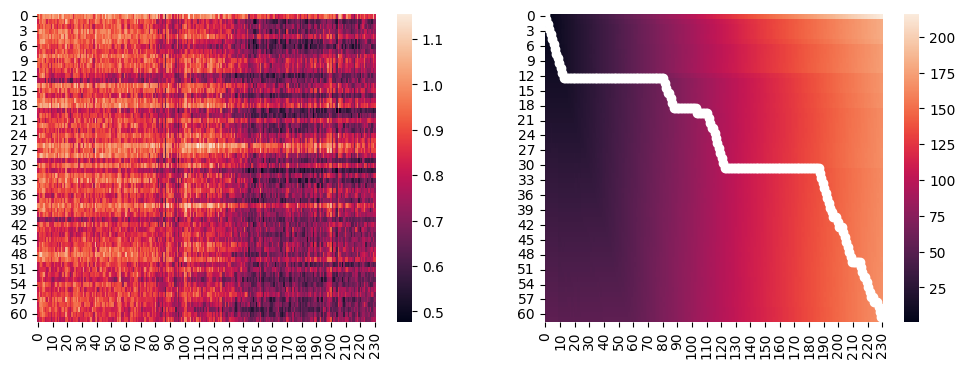

61 245


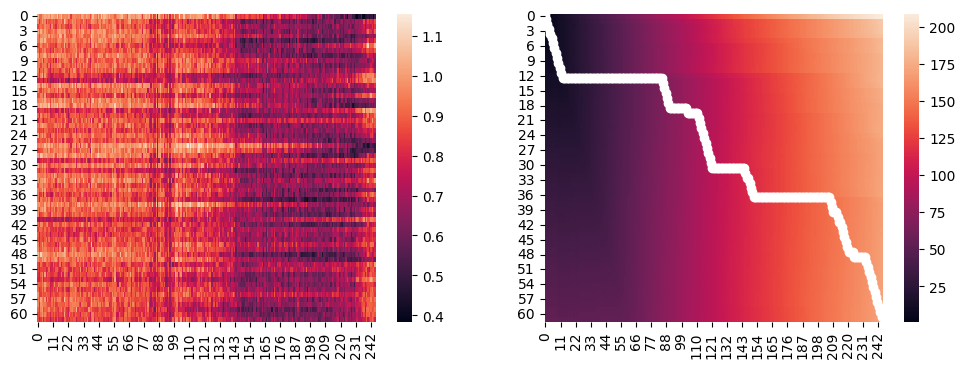

IRF8: 	erythrocytic: 	121.8944262316563, 	0.012684123437217096
IRF8: 	monocytic: 	166.6019284262214, 	0.011632588215767448
IRF8: 	granulocytic: 	170.62643176469896, 	0.011187151308988917

irf8
61 154


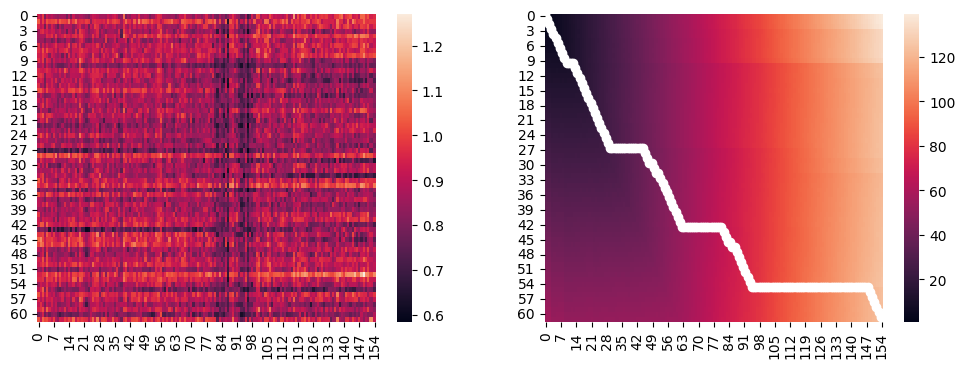

61 230


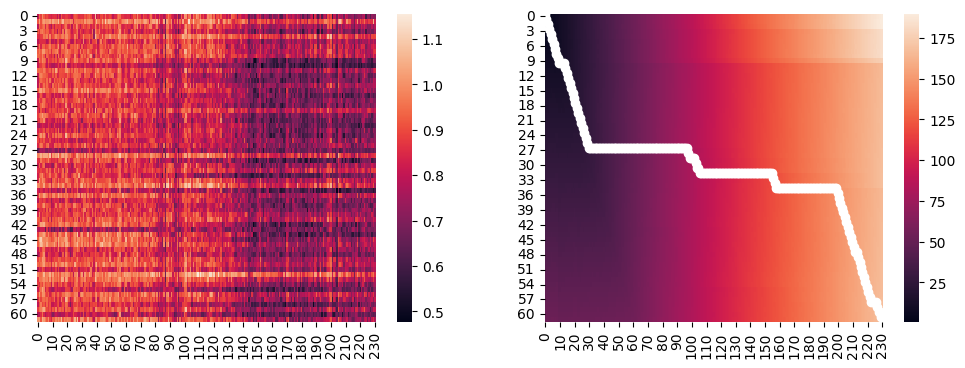

61 245


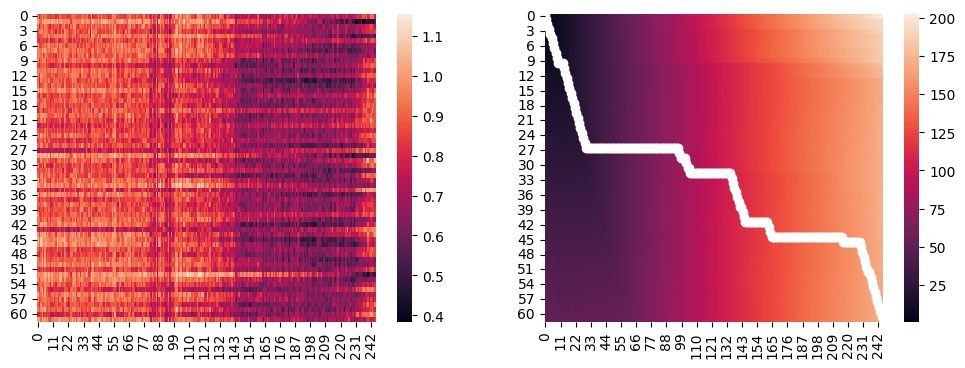

IRF8: 	erythrocytic: 	123.58397761960173, 	0.012859935236170836
IRF8: 	monocytic: 	167.42962010582775, 	0.011690379842607719
IRF8: 	granulocytic: 	170.78480280980648, 	0.011197534933766488



In [59]:
plot_comparisons_shuffle(adata, irf8, "irf8") #granulocytic, nr3
plot_comparisons_shuffle(adata, irf8, "irf8") #granulocytic, nr3
plot_comparisons_shuffle(adata, irf8, "irf8") #granulocytic, nr3

gfi1
78 154


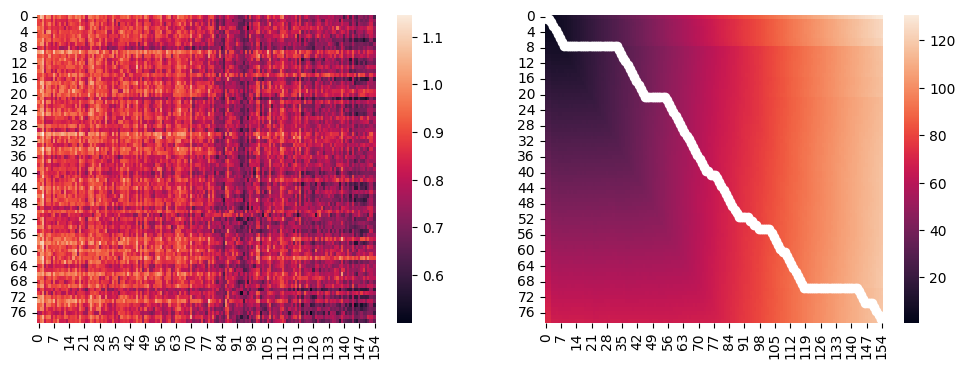

78 230


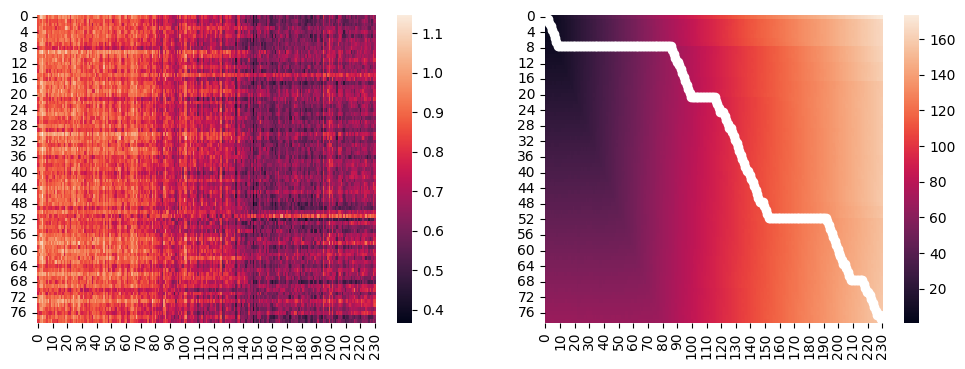

78 245


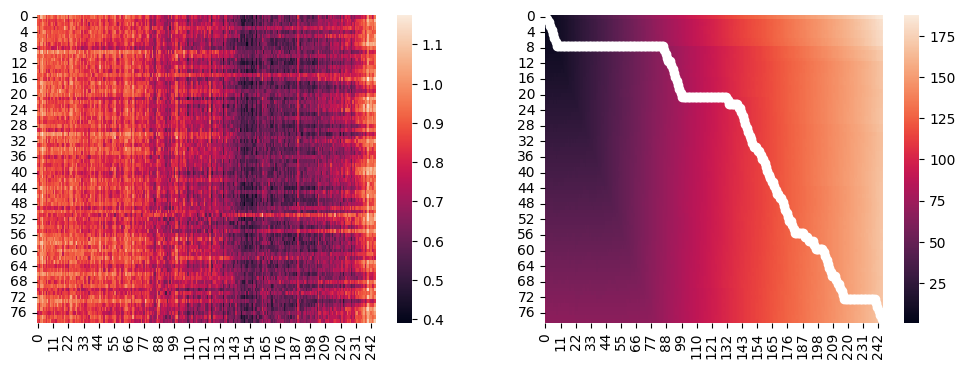

GFI1: 	erythrocytic: 	117.92466317529656, 	0.009630433905700005
GFI1: 	monocytic: 	157.02622291478235, 	0.008604648085636601
GFI1: 	granulocytic: 	169.07472319402703, 	0.008699944591644903

gfi1
78 154


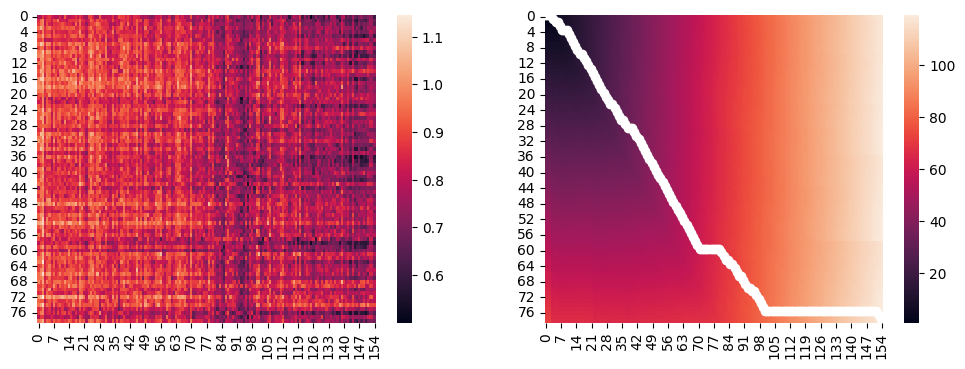

78 230


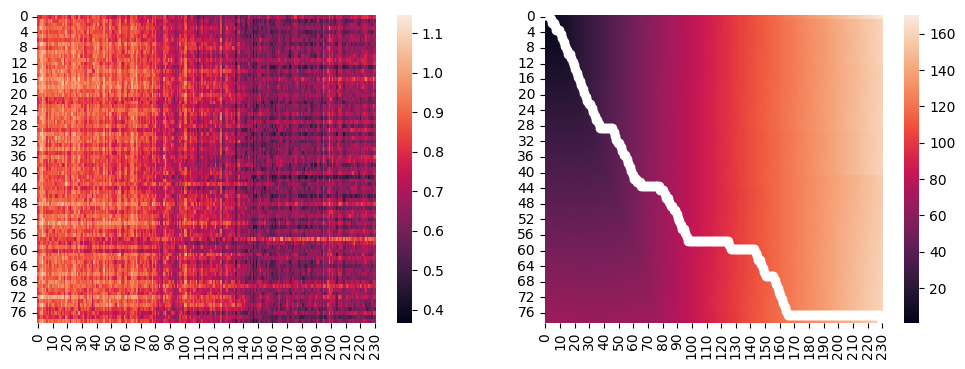

78 245


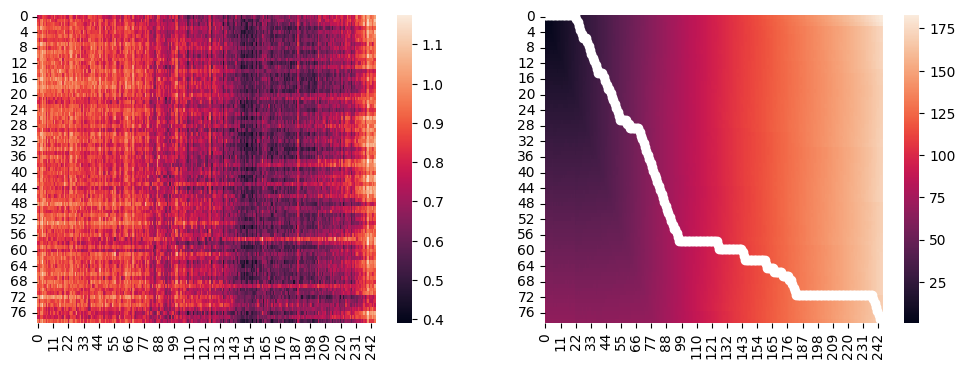

GFI1: 	erythrocytic: 	118.39217165416234, 	0.009668613446644535
GFI1: 	monocytic: 	158.44734237175547, 	0.008682521911981779
GFI1: 	granulocytic: 	169.33555481006084, 	0.00871336599825362

gfi1
78 154


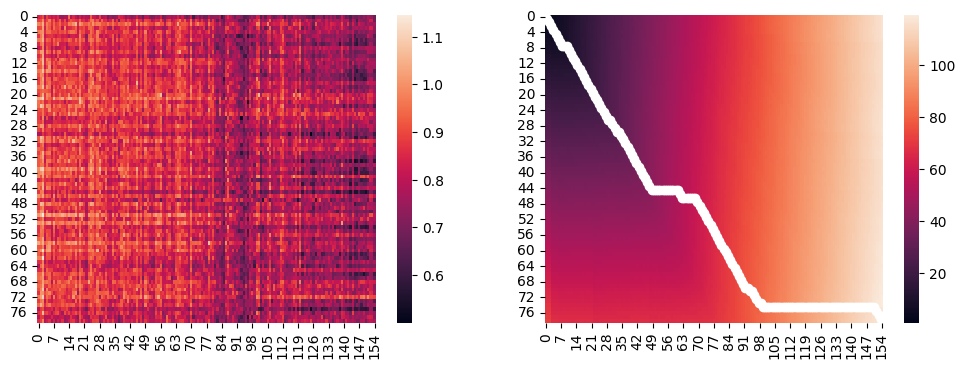

78 230


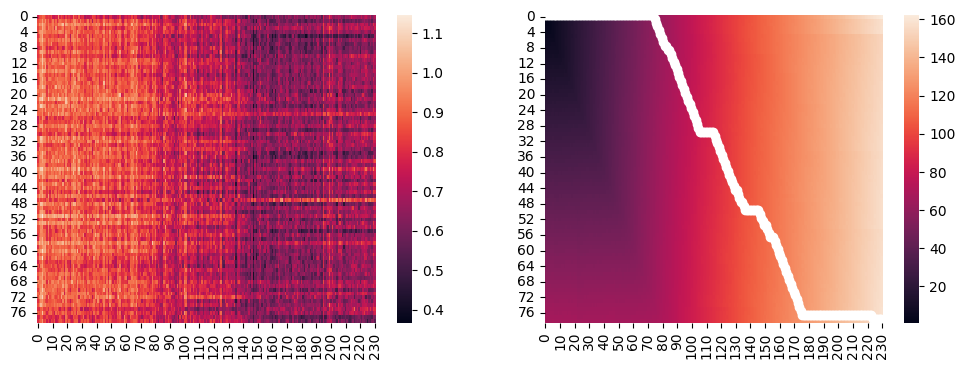

78 245


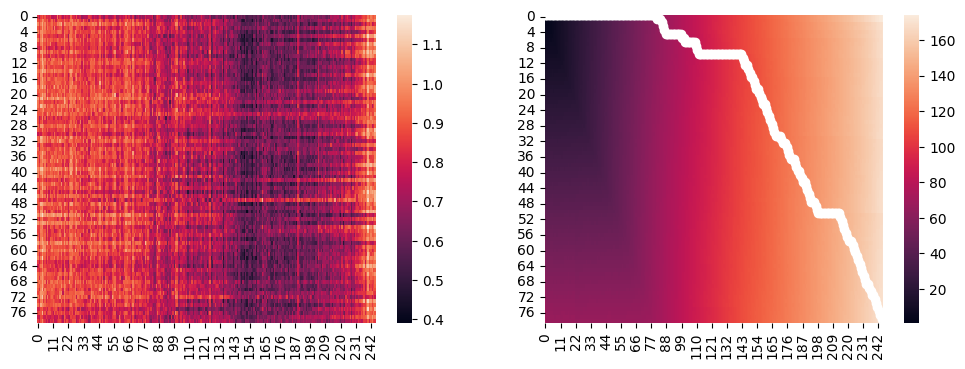

GFI1: 	erythrocytic: 	118.29130659690831, 	0.00966037620227916
GFI1: 	monocytic: 	157.69050679286198, 	0.00864104919682514
GFI1: 	granulocytic: 	169.95187176854955, 	0.008745079333567435



In [60]:
plot_comparisons_shuffle(adata, gfi1, "gfi1") # == monocytic
plot_comparisons_shuffle(adata, gfi1, "gfi1") # == monocytic
plot_comparisons_shuffle(adata, gfi1, "gfi1") # == monocytic

In [61]:
rng = np.random.default_rng()

def plot_comparisons_shuffle_100(adata, ko, label_ko, distance_measure = "correlation"):
    trajectories = [adata, ko]

    # config = {
    #     "compare_lineages_pseudocells": False,
    #     "compare_lineages_pseudocells_label": "pseudocells_50",
    #     "compare_trajectories_pseudocells": False,
    #     "compare_trajectories_pseudocells_label": "pseudocells_50",
    #     "align_pseudocells": False,
    # }


    # common_vars = list(set.intersection(*(set(trajectory.var_names) for trajectory in trajectories)))

    lineages = get_config(trajectories)


    results = []
    print(label_ko)
    for lineage1, label in zip(lineages[0], adata.uns["lineage_labels"]):
        btwn_results = []
        for lineage2 in lineages[1]:
            print(label_ko, label)
            path1s = []
            path2s = []

            total_dist, cost, distances = dynchro.tl.skip_dtw(lineage2.X, lineage1.X, distance = distance_measure)
            path1, path2 = dynchro.tl.skip_traceback(distances[1:, 1:])

            # path2 = [max(path2) - x for x in path2]

            path1 = [max(path1) - x for x in path1]

            path1s.append(path1)
            path2s.append(path2)

            pseudotime_d1_l1 = lineage1.obs.pseudotime
            pseudotime_d2_l1 = lineage2.obs.pseudotime
            pseudotime_d1_l1 = pseudotime_d1_l1[np.argsort(pseudotime_d1_l1)]
            pseudotime_d2_l1 = pseudotime_d2_l1[np.argsort(pseudotime_d2_l1)]

            corr = calculate_single_correlation(cost, pseudotime_d1_l1, pseudotime_d2_l1)

            fig, (ax1, ax2) = plt.subplots(1,2)
            fig.set_size_inches(12, 4)

            ax1.scatter(path2, path1, c = "red", s = 3, alpha = 1)
            ax2.scatter(0, corr, c = "red", s = 3)


            for i in range(100):
                lin2X = lineage2.X
                rng.shuffle(lin2X)
                total_dist, cost, distances = dynchro.tl.skip_dtw(lin2X, lineage1.X, distance = distance_measure)
                path1, path2 = dynchro.tl.skip_traceback(distances[1:, 1:])

                path1 = [max(path1) - x for x in path1]
                path2 = [x for x in path2]

                # this is not yet correct, as the pseudotime is not changed and is the same still
                # pseudotime_d1_l1 = lineage1.obs.pseudotime
                # pseudotime_d2_l1 = lineage2.obs.pseudotime

                # corr = calculate_single_correlation(cost, pseudotime_d1_l1, pseudotime_d2_l1)
                # ax2.scatter(i+1, corr, c = "black", s = 3)


                path1s.append(path1)
                path2s.append(path2)
                ax1.scatter(path2, path1, c = "black", s = 3, alpha = 0.1)
            

            plt.show()
            btwn_results.append((path1s, path2s))
        results.append(btwn_results)
    return results

In [62]:
import scipy.stats as stats
stats.bootstrap(adata.X, np.mean)

TypeError: mean() got multiple values for argument 'axis'

irf8
irf8 erythrocytic


/tmp/ipykernel_1564654/3242407535.py:55: ImplicitModificationWarning: Trying to modify attribute `.X` of view, initializing view as actual.
  rng.shuffle(lin2X)


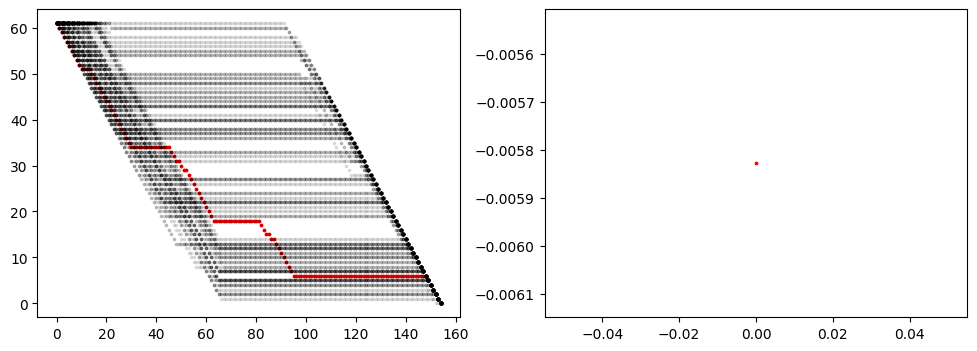

irf8 monocytic


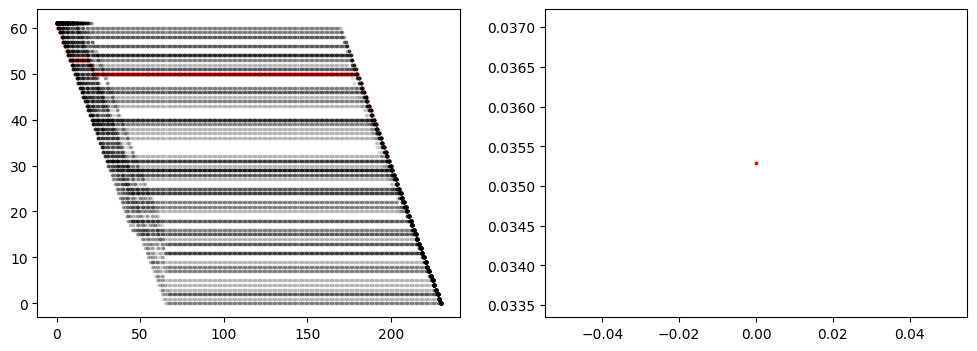

irf8 granulocytic


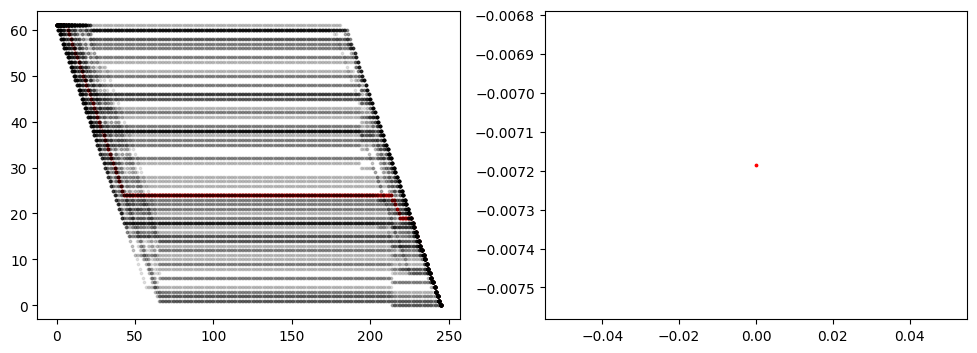

In [63]:
res_irf8 = plot_comparisons_shuffle_100(adata, irf8, "irf8") #granulocytic, nr3

gfi1
gfi1 erythrocytic


/tmp/ipykernel_1564654/3242407535.py:55: ImplicitModificationWarning: Trying to modify attribute `.X` of view, initializing view as actual.
  rng.shuffle(lin2X)
/home/louise/Work/dynchro/lib/python3.11/site-packages/scipy/spatial/distance.py:163: RuntimeWarning: invalid value encountered in cast
  return np.ascontiguousarray(X, dtype=out_type)


IndexError: index -156 is out of bounds for axis 1 with size 155

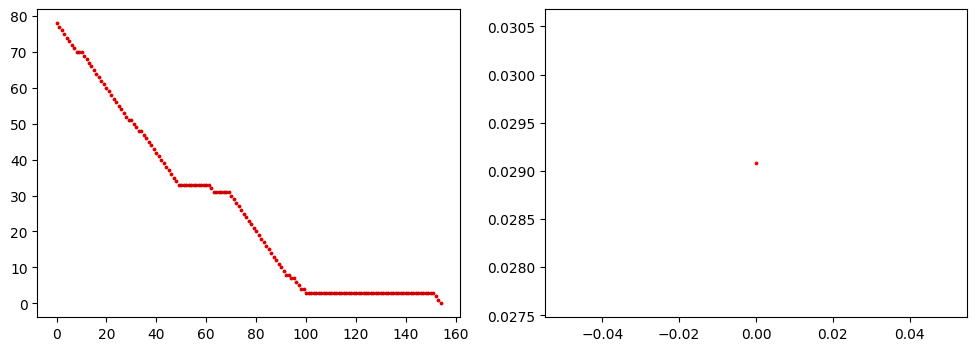

In [64]:
res_gfi1 = plot_comparisons_shuffle_100(adata, gfi1, "gfi1") # == monocytic, nr 2

both
both erythrocytic


/tmp/ipykernel_1564654/3242407535.py:55: ImplicitModificationWarning: Trying to modify attribute `.X` of view, initializing view as actual.
  rng.shuffle(lin2X)
/home/louise/Work/dynchro/lib/python3.11/site-packages/scipy/spatial/distance.py:163: RuntimeWarning: invalid value encountered in cast
  return np.ascontiguousarray(X, dtype=out_type)


IndexError: index -156 is out of bounds for axis 1 with size 155

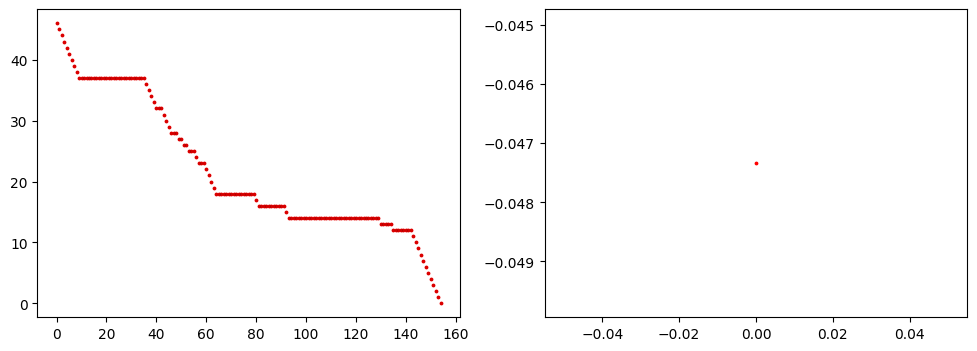

In [65]:
res_both = plot_comparisons_shuffle_100(adata, both, "both") # == none

### 3.2.3 Run with scaled genes

In [68]:
adata_scaled = sc.pp.scale(adata, zero_center = False, copy = True)
irf8_scaled = sc.pp.scale(irf8, zero_center = False, copy = True)
gfi1_scaled = sc.pp.scale(gfi1, zero_center = False, copy = True)
both_scaled = sc.pp.scale(both, zero_center = False, copy = True)

62 155


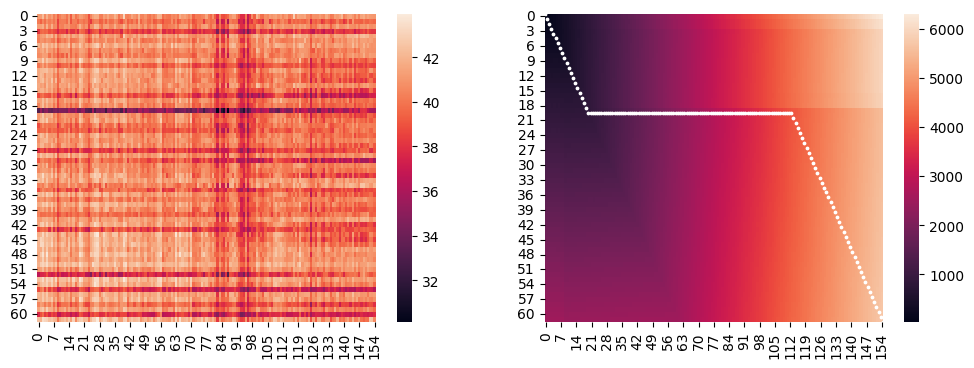

62 231


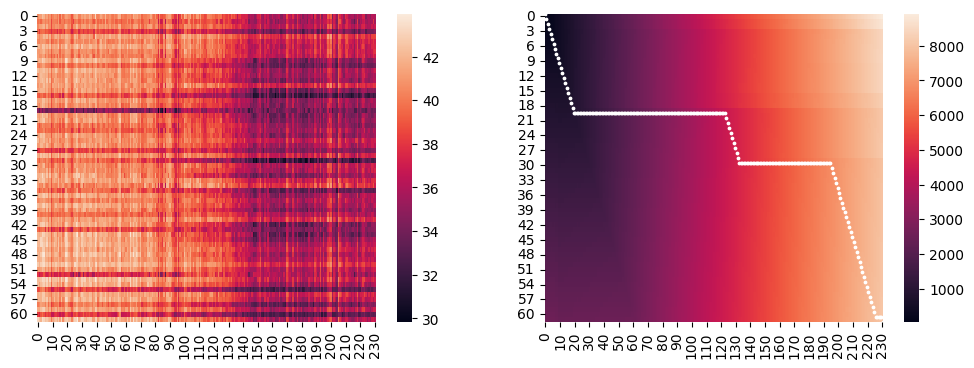

62 246


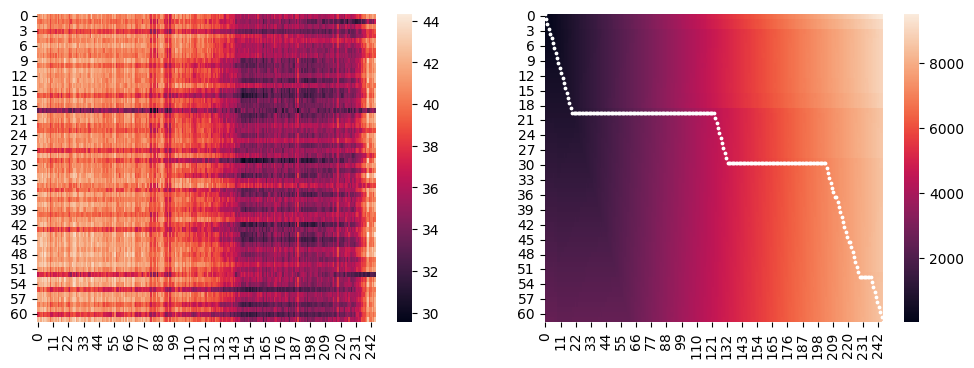

IRF8,erythrocytic,5690.632282655971,26.22411190164042,36.478412068307506,-0.056103315106537516
IRF8,monocytic,8036.5301347434415,27.42843049400492,34.64021609803208,-0.016255085365542613
IRF8,granulocytic,8523.500313231812,27.673702315687702,34.50809843413689,-0.008928042472324114
62 155


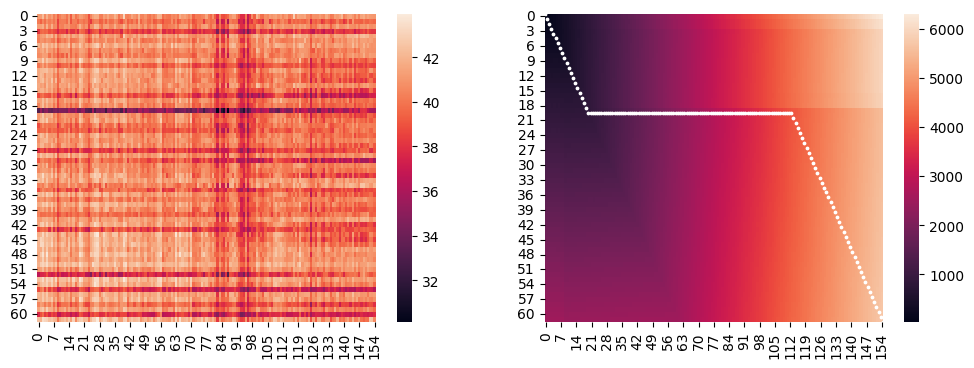

62 231


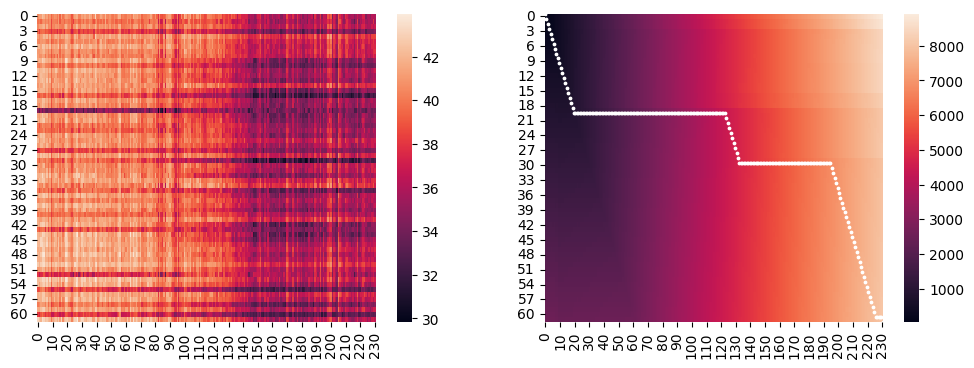

62 246


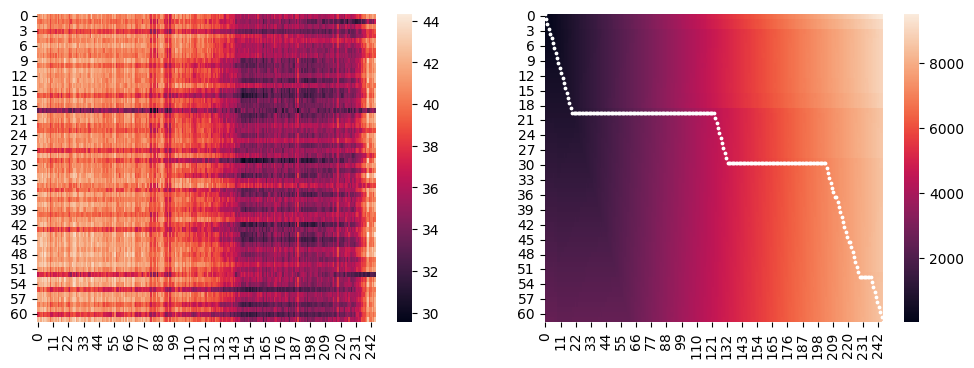

IRF8,erythrocytic,5690.632282655971,26.22411190164042,36.478412068307506,-0.056103315106537516
IRF8,monocytic,8036.5301347434415,27.42843049400492,34.64021609803208,-0.016255085365542613
IRF8,granulocytic,8523.500313231812,27.673702315687702,34.50809843413689,-0.008928042472324114


In [69]:
plot_comparisons(adata_scaled, irf8_scaled, "irf8") # == granulocytic
plot_comparisons(adata_scaled, irf8_scaled, "irf8", distance_measure="euclidean") # == monocytic

79 155


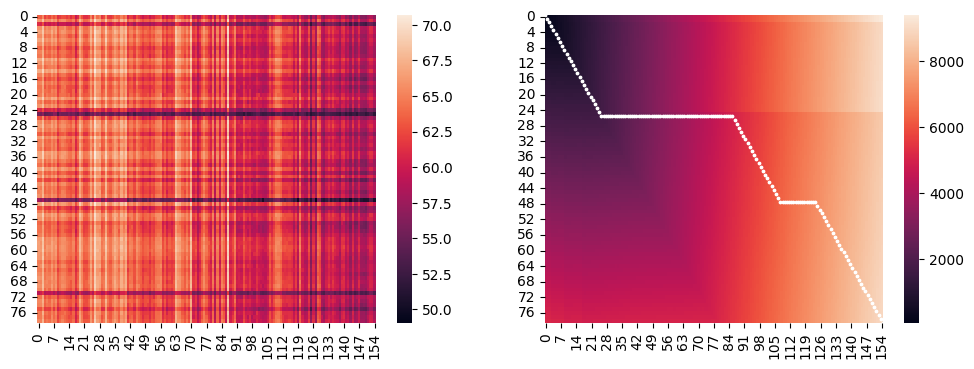

79 231


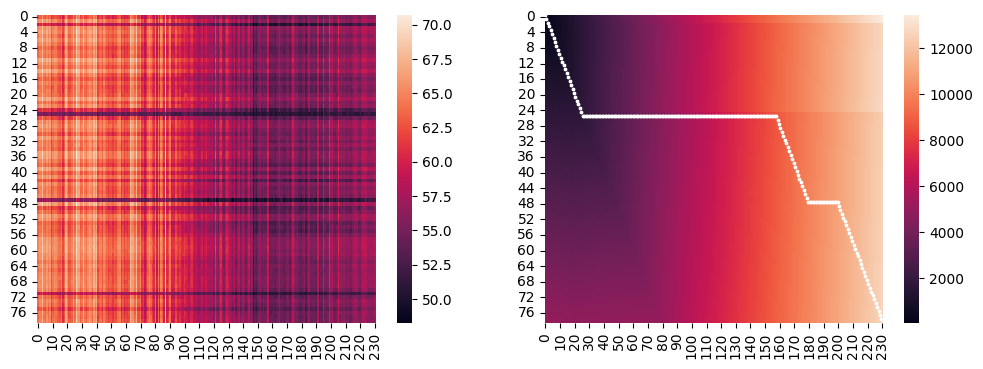

79 246


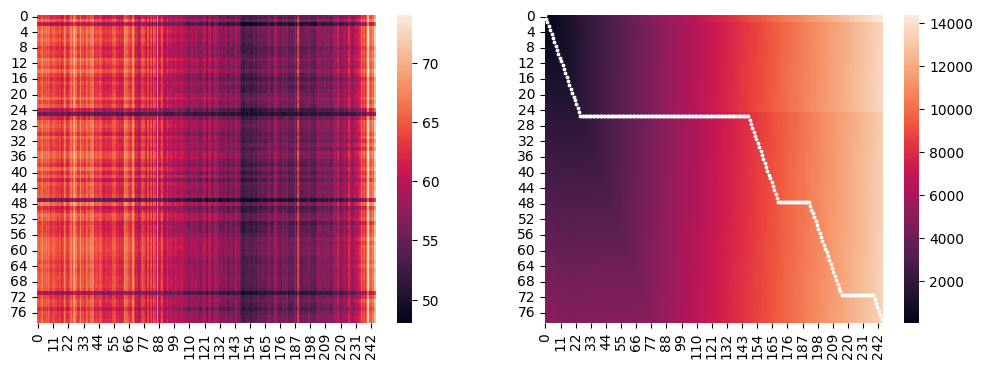

GFI1,erythrocytic,8929.962817573658,38.16223426313529,57.243351394702934,0.00792198489331574
GFI1,monocytic,12608.576677224944,40.67282799104821,54.347313263900624,0.004106722017863313
GFI1,granulocytic,13521.872133825853,41.605760411771854,54.74442159443665,0.011640602241664319
79 155


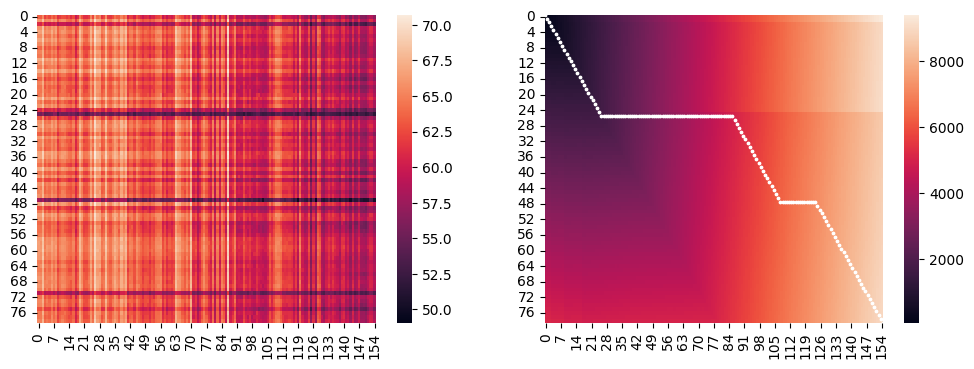

79 231


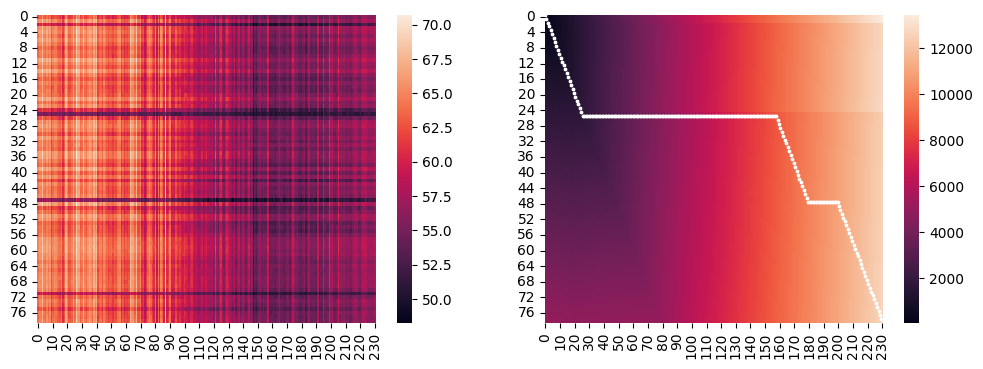

79 246


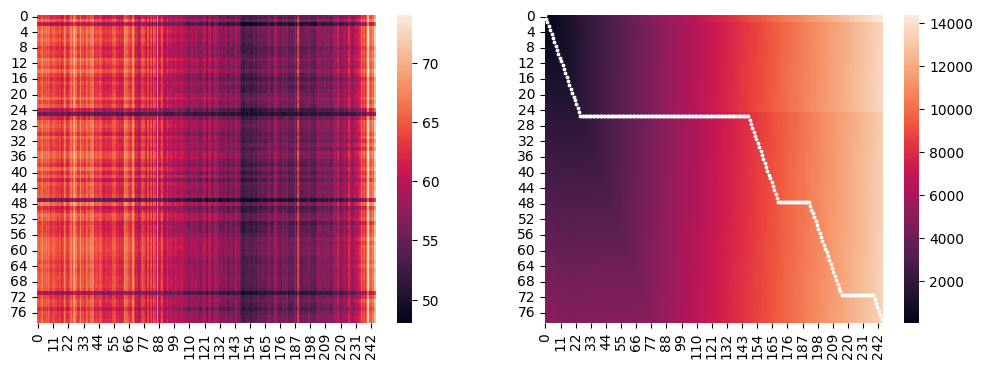

GFI1,erythrocytic,8929.962817573658,38.16223426313529,57.243351394702934,0.00792198489331574
GFI1,monocytic,12608.576677224944,40.67282799104821,54.347313263900624,0.004106722017863313
GFI1,granulocytic,13521.872133825853,41.605760411771854,54.74442159443665,0.011640602241664319


In [70]:
plot_comparisons(adata_scaled, gfi1_scaled, "gfi1") # == monocytic
plot_comparisons(adata_scaled, gfi1_scaled, "gfi1", distance_measure="euclidean") # == none

47 155


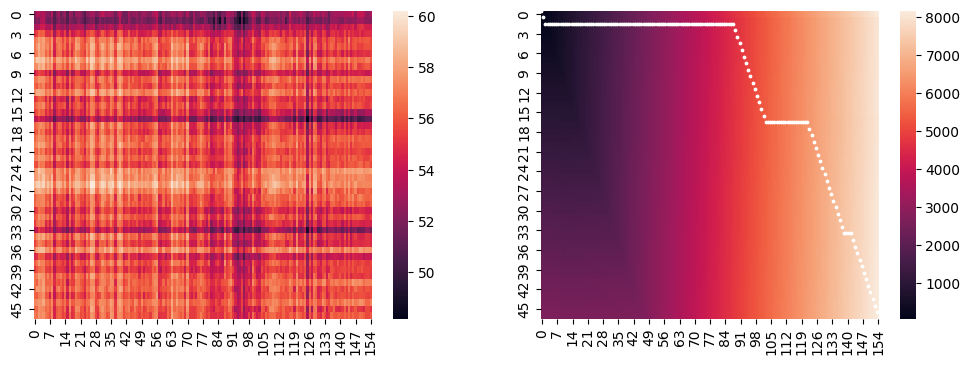

47 231


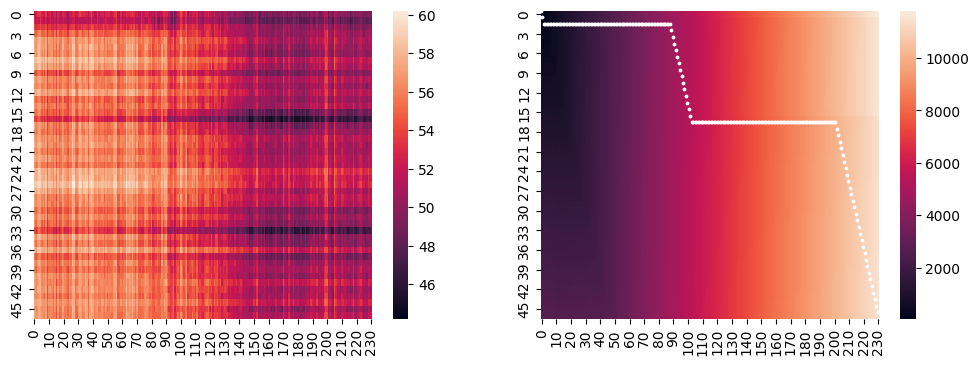

47 246


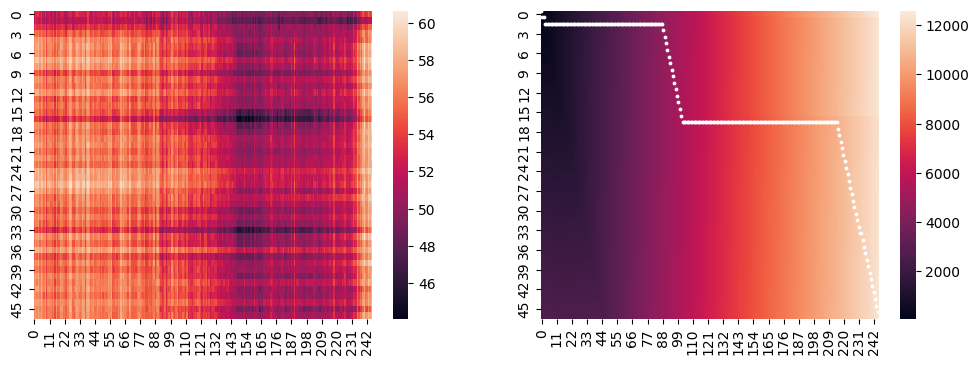

BOTH,erythrocytic,8169.374671596054,40.4424488692874,52.36778635638496,-0.14161897736272336
BOTH,monocytic,11527.150368692974,41.464569671557456,49.685992968504195,-0.07095142062890597
BOTH,granulocytic,12336.005505173378,42.10240786748593,49.94334212620801,-0.10344222769205717
47 155


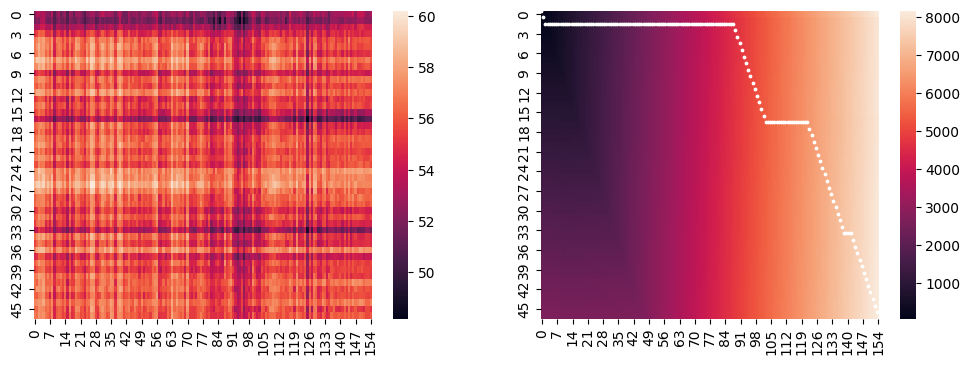

47 231


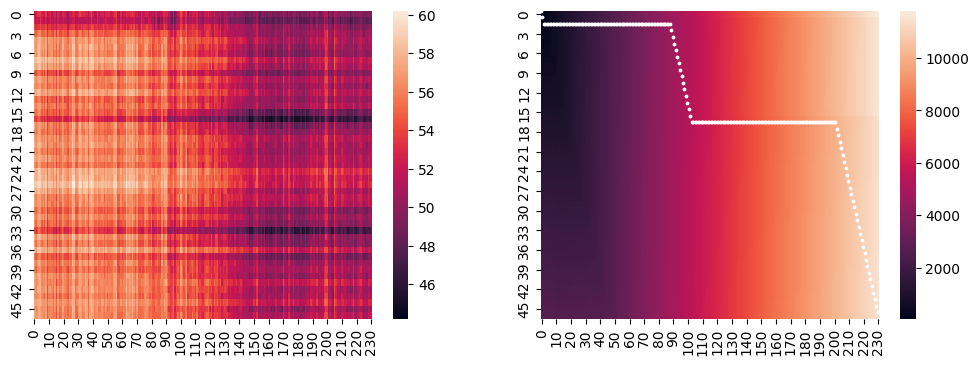

47 246


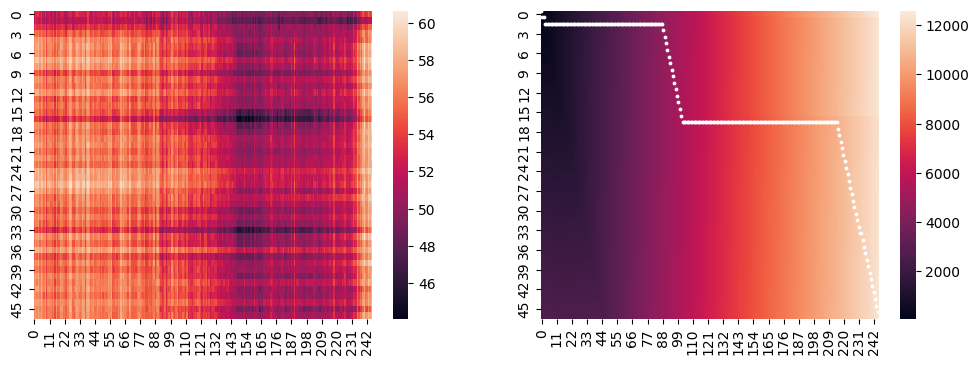

BOTH,erythrocytic,8169.374671596054,40.4424488692874,52.36778635638496,-0.14161897736272336
BOTH,monocytic,11527.150368692974,41.464569671557456,49.685992968504195,-0.07095142062890597
BOTH,granulocytic,12336.005505173378,42.10240786748593,49.94334212620801,-0.10344222769205717


In [71]:
plot_comparisons(adata_scaled, both_scaled, "both") # == none
plot_comparisons(adata_scaled, both_scaled, "both", distance_measure = "euclidean") # == none

### 3.2.4 Run on dimred

In [72]:
def plot_comparisons_dimred(adata, ko, label_ko, dimred = "X_mlle", distance_measure = "correlation"):
    trajectories = [adata, ko]

    lineages = get_config(trajectories)

    results = []
    print(label_ko)
    for lineage1, label in zip(lineages[0], adata.uns["lineage_labels"]):
        lineage1 = lineage1.obsm[dimred]
        for lineage2 in lineages[1]:
            lineage2 = lineage2.obsm[dimred]
            total_dist, cost, distances = dynchro.tl.skip_dtw(lineage2, lineage1, distance = distance_measure)
            path1, path2 = dynchro.tl.skip_traceback(distances[1:, 1:])
            print(max(path1), max(path2))
            total_dist_norm = total_dist / len(path1)

            fig, (ax1, ax2) = plt.subplots(1,2)
            fig.set_size_inches(12, 4)
            sns.heatmap(cost, ax = ax1)
            distances = distances[1:, 1:]
            sns.heatmap(distances, ax = ax2)
            # plot the path
            # path1 = [max(path1) - x for x in path1]
            plt.scatter(path2, path1, c = "white")
            plt.show()

            results.append(f"{label_ko.upper()}: \t{label}: \t{total_dist}, \t{total_dist_norm}\n")

    print("".join(results))

irf8
61 154


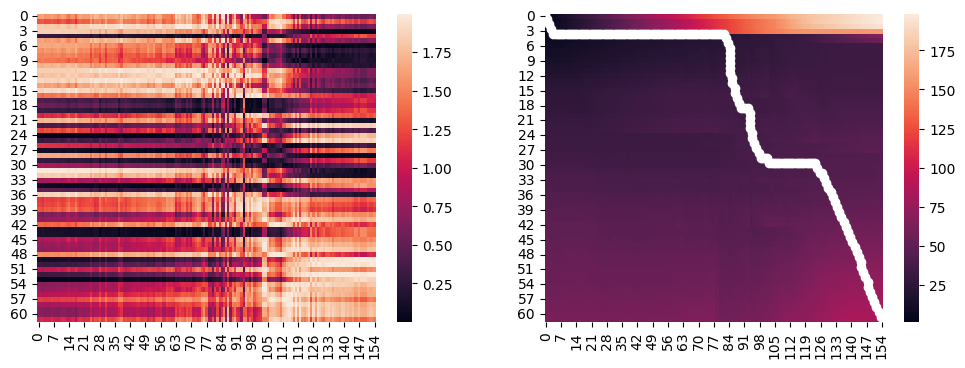

61 230


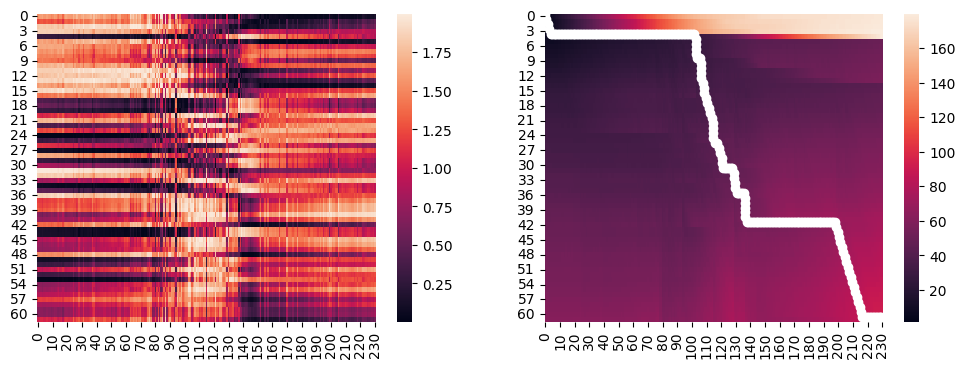

61 245


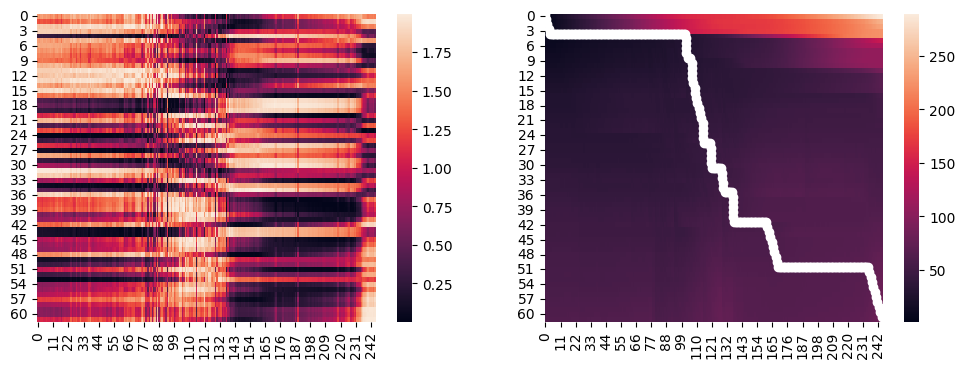

IRF8: 	erythrocytic: 	86.13698128141033, 	0.5127201266750615
IRF8: 	monocytic: 	92.44950279950876, 	0.3727802532238257
IRF8: 	granulocytic: 	84.95779422032808, 	0.3205954498880305

irf8
61 154


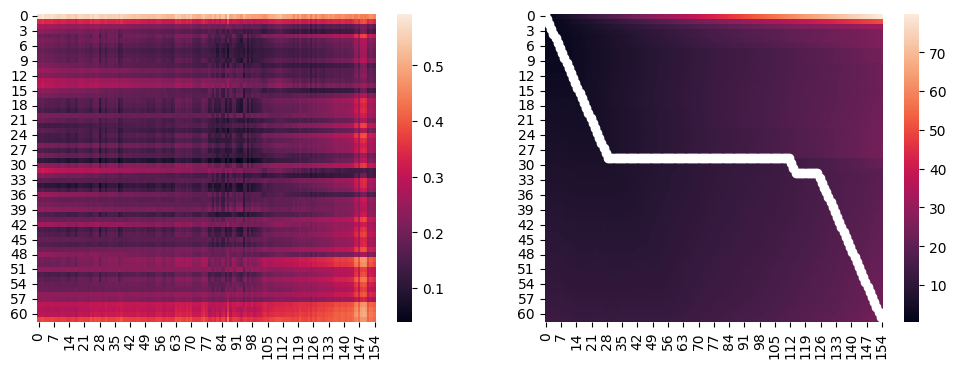

61 230


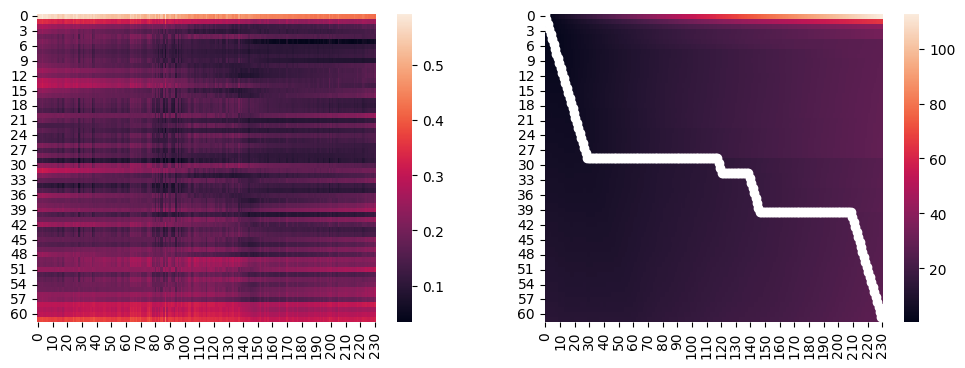

61 245


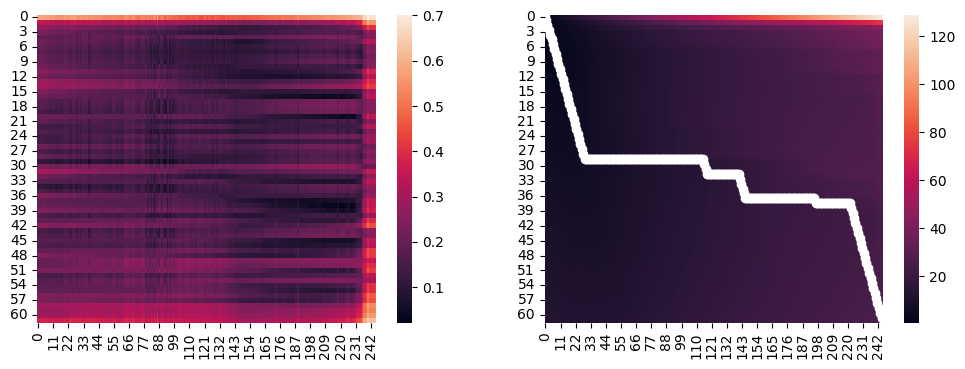

IRF8: 	erythrocytic: 	23.974246724314636, 	0.15467255951170733
IRF8: 	monocytic: 	27.81986897129068, 	0.12043233320905057
IRF8: 	granulocytic: 	28.28477495836455, 	0.11497875999335183



In [73]:
plot_comparisons_dimred(adata, irf8, "irf8") #granulocytic, nr3
plot_comparisons_dimred(adata, irf8, "irf8", distance_measure="euclidean") #granulocytic, nr3

gf1
78 154


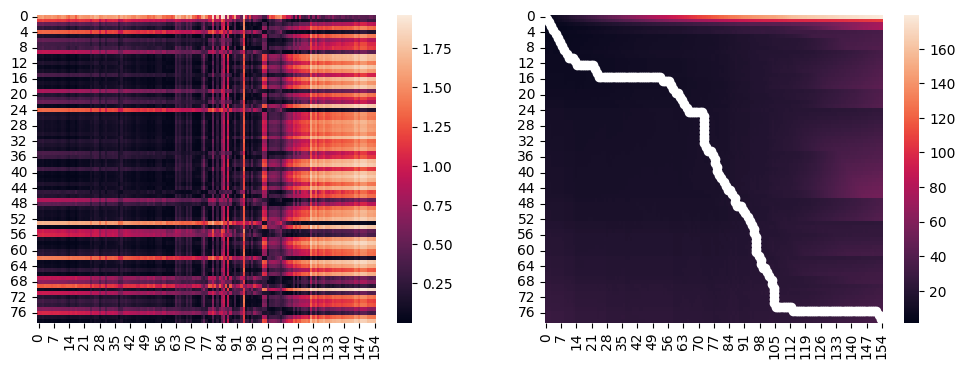

78 230


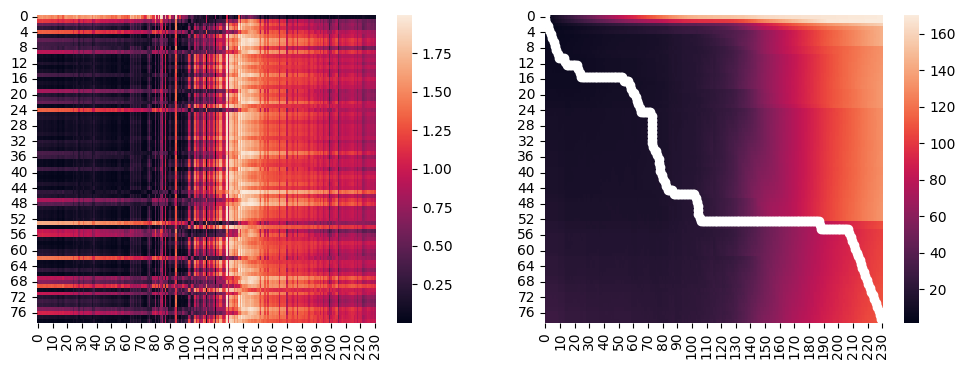

78 245


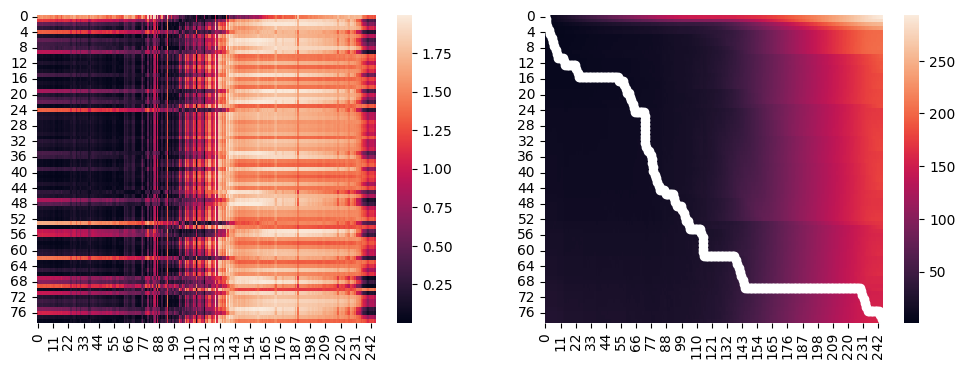

GF1: 	erythrocytic: 	36.37780254472495, 	0.20669205991320994
GF1: 	monocytic: 	111.1888474454659, 	0.45756727343813125
GF1: 	granulocytic: 	156.6595121717596, 	0.6025365852759984

gfi1
78 154


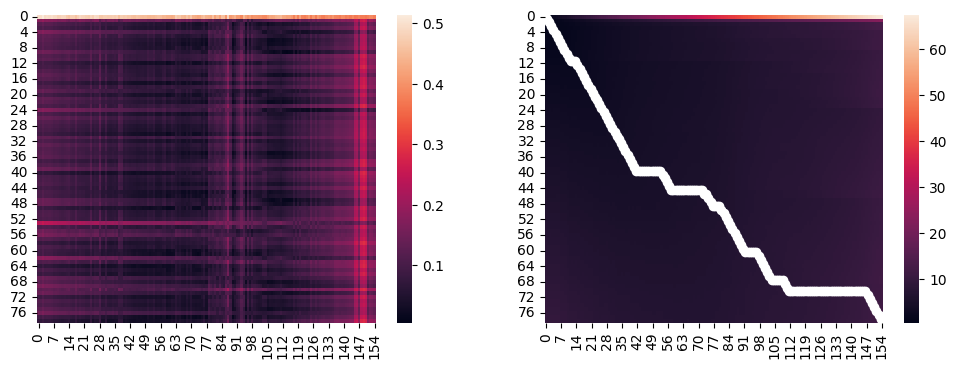

78 230


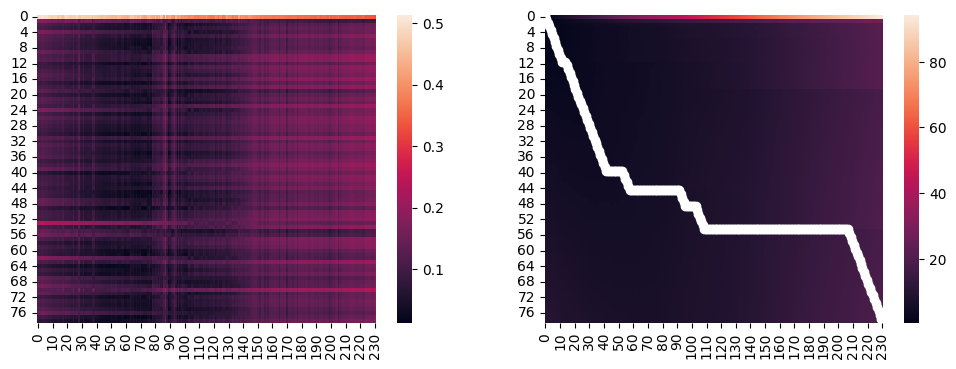

78 245


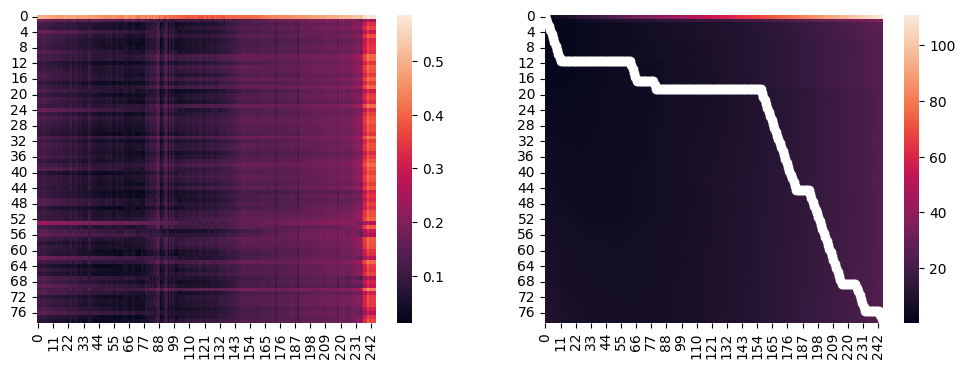

GFI1: 	erythrocytic: 	11.790414298627393, 	0.07606718902340254
GFI1: 	monocytic: 	19.400516874230096, 	0.08398492153346362
GFI1: 	granulocytic: 	25.125298632398444, 	0.10213536029430262



In [74]:
plot_comparisons_dimred(adata, gfi1, "gf1") # == monocytic, nr 2
plot_comparisons_dimred(adata, gfi1, "gfi1", distance_measure="euclidean") # == monocytic, nr 2

both
46 154


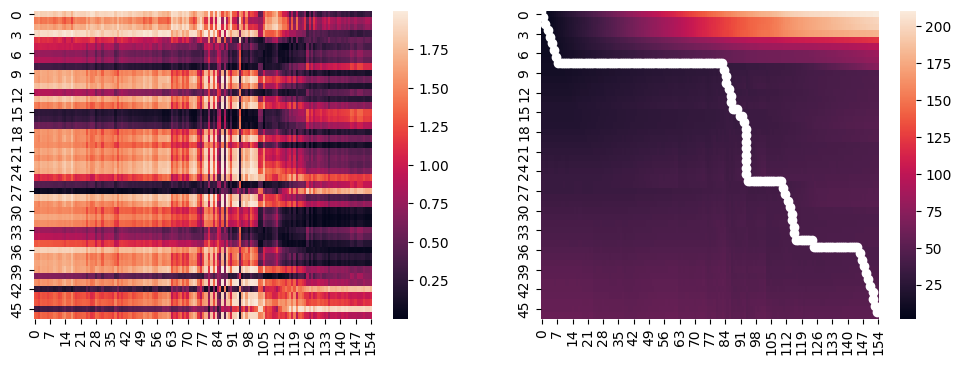

46 230


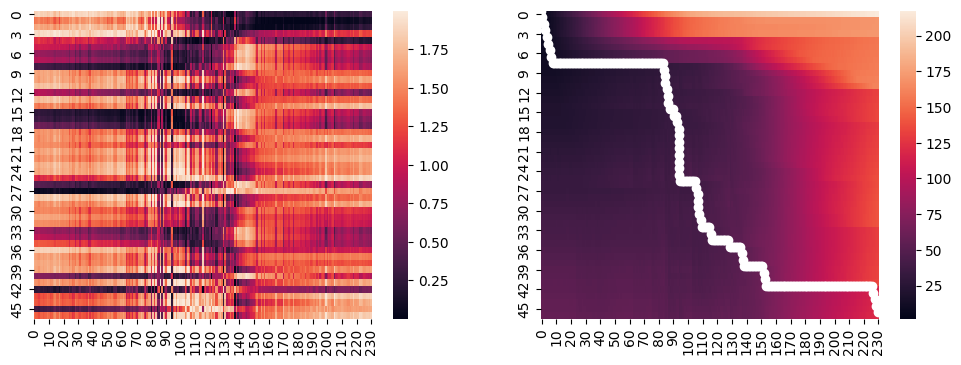

46 245


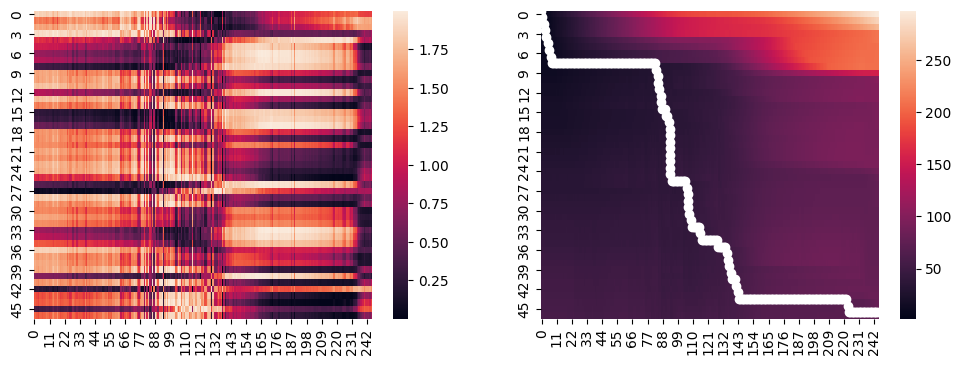

BOTH: 	erythrocytic: 	52.73538073395726, 	0.3157807229578279
BOTH: 	monocytic: 	121.57534347468237, 	0.5023774523747205
BOTH: 	granulocytic: 	75.94415930135008, 	0.29550256537490305

both
46 154


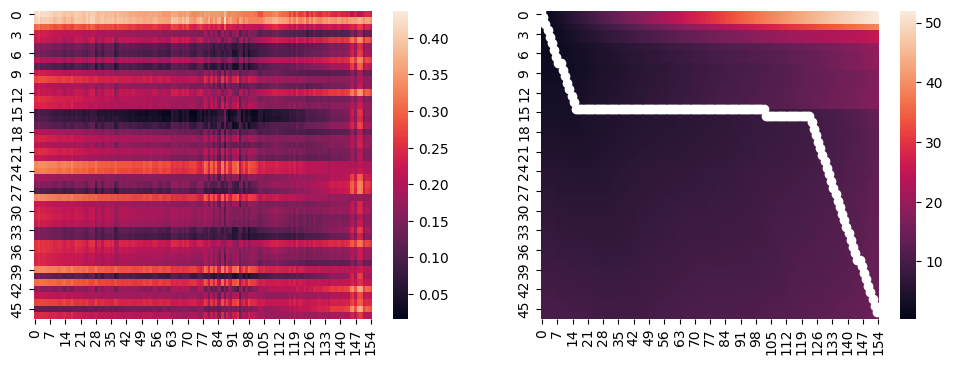

46 230


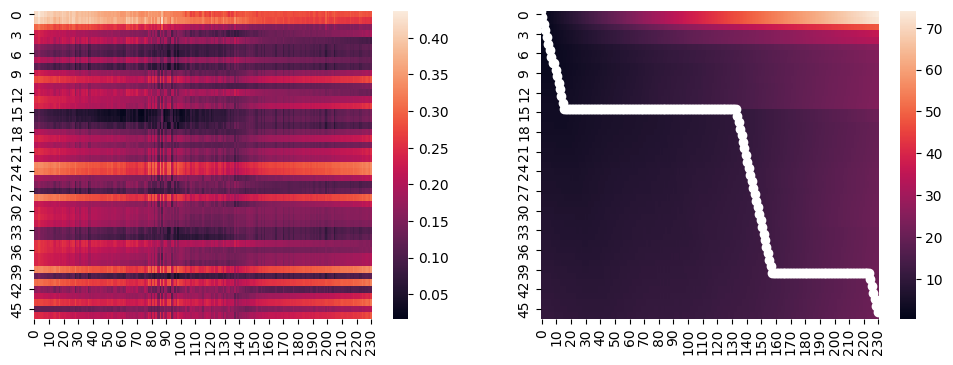

46 245


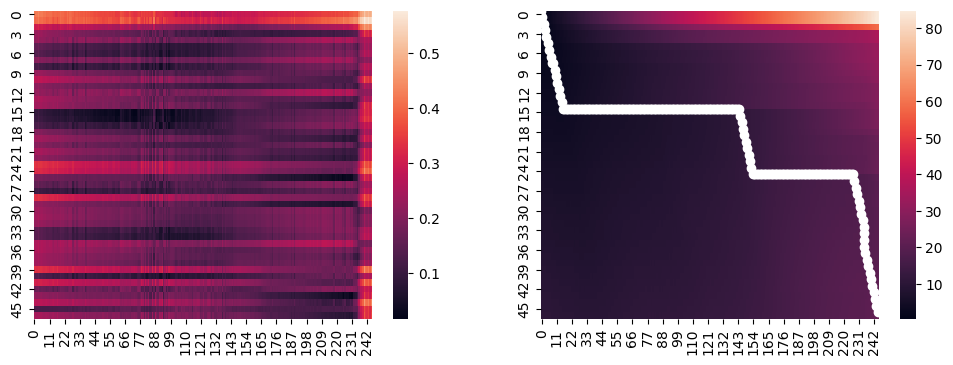

BOTH: 	erythrocytic: 	14.985555278677618, 	0.09668100179792011
BOTH: 	monocytic: 	21.34836822166559, 	0.09241717844876879
BOTH: 	granulocytic: 	22.021699123861765, 	0.08844055873036853



In [75]:
plot_comparisons_dimred(adata, both, "both") # == none
plot_comparisons_dimred(adata, both, "both", distance_measure="euclidean")

In [76]:
adata.obsm

AxisArrays with keys: X_dr, X_mlle, X_spring, X_stream_S4, X_vis, X_vis_umap

### 3.2.5 bootstrap

In [77]:
import scipy.stats as stats

In [78]:
def dtw_comparisons(lineages, distance_measure = "euclidean"):
    results = []
    for lineage1 in lineages[0]:
        lineage2 = lineages[1][0]
        # print(lineage1)
        # print(lineage2)
        total_dist, cost, distances = dynchro.tl.skip_dtw(lineage2.X, lineage1.X, distance = distance_measure)
        path1, path2 = dynchro.tl.skip_traceback(distances)
        total_dist_norm2 = total_dist / len(path1)

        # print(distances[1:, 1:])

        results.append(total_dist_norm2)

    return results

In [79]:
lineages[1][0].X

KeyError: 1

In [80]:
trajectories = [adata, irf8]
lineages = get_config(trajectories)

In [81]:
from random import choices
t = choices(irf8.obs_names, k=200)
print(len(t))
print(len(set(t)))
t

200
58


['Irf8.Null.42',
 'Irf8.Null.53',
 'Irf8.Null.15',
 'Irf8.Null.28',
 'Irf8.Null.13',
 'Irf8.Null.35',
 'Irf8.Null.59',
 'Irf8.Null.50',
 'Irf8.Null.46',
 'Irf8.Null.40',
 'Irf8.Null.12',
 'Irf8.Null.47',
 'Irf8.Null.56',
 'Irf8.Null.15',
 'Irf8.Null.8',
 'Irf8.Null.45',
 'Irf8.Null.60',
 'Irf8.Null.42',
 'Irf8.Null.47',
 'Irf8.Null.46',
 'Irf8.Null.47',
 'Irf8.Null.25',
 'Irf8.Null.45',
 'Irf8.Null.41',
 'Irf8.Null.56',
 'Irf8.Null.53',
 'Irf8.Null.22',
 'Irf8.Null.5',
 'Irf8.Null.10',
 'Irf8.Null.53',
 'Irf8.Null.46',
 'Irf8.Null.53',
 'Irf8.Null.43',
 'Irf8.Null.49',
 'Irf8.Null.6',
 'Irf8.Null.43',
 'Irf8.Null.51',
 'Irf8.Null.58',
 'Irf8.Null.17',
 'Irf8.Null.17',
 'Irf8.Null.57',
 'Irf8.Null.4',
 'Irf8.Null.61',
 'Irf8.Null.55',
 'Irf8.Null.47',
 'Irf8.Null.17',
 'Irf8.Null.58',
 'Irf8.Null.28',
 'Irf8.Null.61',
 'Irf8.Null.7',
 'Irf8.Null.4',
 'Irf8.Null.38',
 'Irf8.Null.40',
 'Irf8.Null.63',
 'Irf8.Null.56',
 'Irf8.Null.34',
 'Irf8.Null.11',
 'Irf8.Null.19',
 'Irf8.Null.55',
 'I

In [82]:
irf8

AnnData object with n_obs × n_vars = 62 × 500
    obs: 'label', 'pseudotime', 'milestones', 'irf8'
    uns: 'id', 'label_color', 'lineage_labels', 'lineages', 'params', 'pseudocells', 'pseudocells_50_irf8_pseudotime', 'trans_mlle', 'trans_pca', 'var_genes', 'vis_trans_umap', 'workdir'
    obsm: 'X_dr', 'X_mlle', 'X_pca', 'X_vis', 'X_vis_umap', 'var_genes'
    varm: 'pseudocells_50_irf8'

In [83]:
irf8[t]

View of AnnData object with n_obs × n_vars = 200 × 500
    obs: 'label', 'pseudotime', 'milestones', 'irf8'
    uns: 'id', 'label_color', 'lineage_labels', 'lineages', 'params', 'pseudocells', 'pseudocells_50_irf8_pseudotime', 'trans_mlle', 'trans_pca', 'var_genes', 'vis_trans_umap', 'workdir'
    obsm: 'X_dr', 'X_mlle', 'X_pca', 'X_vis', 'X_vis_umap', 'var_genes'
    varm: 'pseudocells_50_irf8'

In [84]:
adata = adata[adata.obs.branch_id_id.isin([0, 1, 3, 4])]

def calculate_distance_irf8(names):
    # subset the data and resample using the names, but ordered along the pseudotime
    # print(names)
    knockout = irf8[names]
    trajectories = [adata, knockout]
    lineages = get_config(trajectories)
    return dtw_comparisons(lineages)

def calculate_distance_gfi1(names):
    # subset the data and resample using the names, but ordered along the pseudotime
    # print(names)
    knockout = gfi1[names]
    trajectories = [adata, knockout]
    lineages = get_config(trajectories)
    return dtw_comparisons(lineages)

def calculate_distance_both(names):
    # subset the data and resample using the names, but ordered along the pseudotime
    # print(names)
    knockout = both[names]
    trajectories = [adata, knockout]
    lineages = get_config(trajectories)
    return dtw_comparisons(lineages)
    

In [85]:
tt = irf8.obs_names
res = stats.bootstrap([tt], calculate_distance_irf8, n_resamples= 100, vectorized=False, axis = 0)

In [86]:
res.bootstrap_distribution

array([[86.46338478, 86.40886885, 86.52663986, 87.91591862, 86.50074256,
        86.54964495, 86.74270475, 85.9431278 , 86.93920923, 86.22333812,
        87.4023282 , 87.37768983, 86.71053283, 87.38692965, 86.97924144,
        86.17331761, 86.53992171, 87.6675952 , 86.71119601, 85.83076816,
        87.23759127, 86.64017345, 87.52937348, 86.74772886, 87.90244004,
        87.30170431, 87.21826383, 87.5245014 , 87.17928144, 86.29223958,
        86.07808313, 87.57198644, 87.82211159, 86.99989877, 87.77873502,
        87.31055742, 86.76935799, 87.20442714, 86.88546145, 87.73184549,
        87.79229461, 86.77155938, 86.76880008, 87.52310703, 86.85651262,
        85.84039395, 86.55850496, 87.20835803, 86.0043321 , 86.03682619,
        88.03522971, 86.8466307 , 87.50294898, 87.17315193, 86.61390543,
        86.46674645, 86.26250873, 87.02192971, 86.96204079, 86.21450636,
        86.61296784, 86.53673172, 86.64165878, 87.26231355, 86.83608324,
        86.24784612, 87.86732053, 86.63609455, 85.9

In [87]:
res_gfi1 = stats.bootstrap([gfi1.obs_names], calculate_distance_gfi1, n_resamples = 100, vectorized = False, axis = 0)
res_gfi1.bootstrap_distribution

array([[80.81080095, 80.17813949, 80.54522223, 81.11881712, 80.10985784,
        80.01560327, 79.62778027, 80.32041977, 80.28301976, 80.91633525,
        80.63726317, 79.85165264, 80.11901496, 80.74466314, 80.19478266,
        79.83587574, 80.11324417, 80.0339347 , 80.28013966, 80.4650554 ,
        79.86821712, 80.5550303 , 80.3175601 , 79.78078037, 80.21800675,
        80.88358101, 80.166326  , 80.17980665, 81.10766389, 80.27406518,
        80.48336203, 79.43405091, 80.62660743, 80.2038118 , 80.20485725,
        80.17901598, 80.74858843, 80.07054313, 80.82400228, 79.89943419,
        80.27700213, 80.45638671, 80.5375949 , 80.63908736, 80.52589566,
        80.17887073, 80.31933108, 79.88734351, 80.11167684, 80.06063733,
        80.74162275, 80.34762563, 81.12826782, 80.41598271, 80.30837868,
        80.96359265, 80.34560784, 80.0387322 , 80.24315555, 80.42658094,
        80.21447562, 80.32628151, 80.8027763 , 81.31916456, 79.85214667,
        80.59471557, 80.36163729, 80.56687072, 80.4

In [88]:
res_both = stats.bootstrap([both.obs_names], calculate_distance_both, n_resamples = 100, vectorized = False, axis = 0)
res_both.bootstrap_distribution

array([[86.58554922, 85.58714204, 86.16972535, 86.35480114, 86.67967837,
        86.44737285, 85.99324212, 86.00151888, 86.13491208, 85.98446303,
        86.19957245, 86.4748342 , 85.97264722, 86.43979868, 86.38229073,
        86.23984761, 85.93542367, 85.07372171, 86.1796227 , 86.51316079,
        85.78962685, 86.83980461, 86.73511537, 85.42726312, 86.98829101,
        86.25795998, 86.06418658, 85.52666187, 86.42811529, 86.04121501,
        86.18802726, 85.78373446, 85.15439379, 84.9470008 , 85.04395733,
        85.71066206, 86.44114233, 85.28891713, 86.11511348, 85.41873935,
        86.38460564, 86.52188581, 86.11449585, 86.17525227, 86.64968524,
        85.29254044, 85.84618166, 85.7629298 , 86.43830766, 85.53328315,
        86.41382909, 85.26163909, 87.08562301, 85.76474342, 85.93268601,
        85.61331707, 86.29316793, 85.30604428, 85.55031957, 86.30954602,
        85.56492128, 87.0516876 , 85.01621608, 85.61731789, 85.07951075,
        85.73475131, 86.36581096, 84.6167865 , 86.4

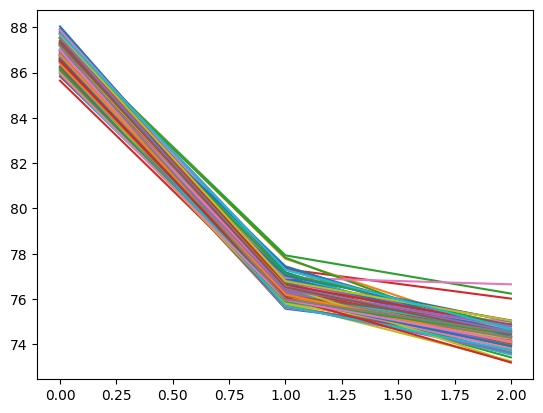

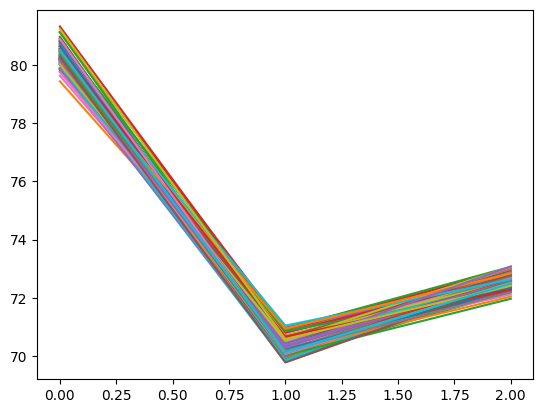

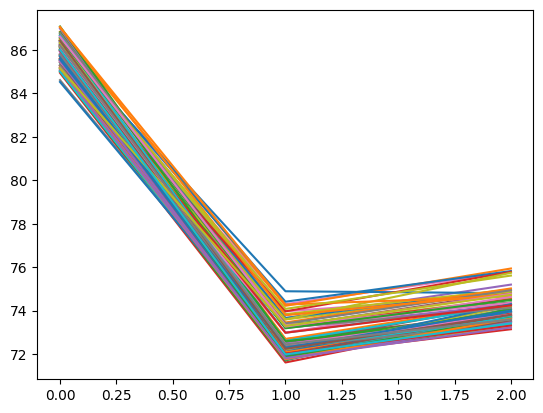

In [89]:
import matplotlib.pyplot as plt

results_irf8 = res.bootstrap_distribution

# for each three values, plot a line plot
for i, g, b in zip(results_irf8[0], results_irf8[1], results_irf8[2]):
    plt.plot([i, g, b])

plt.show()

results_gfi1 = res_gfi1.bootstrap_distribution

# for each three values, plot a line plot
for i, g, b in zip(results_gfi1[0], results_gfi1[1], results_gfi1[2]):
    plt.plot([i, g, b])

plt.show()
results_both = res_both.bootstrap_distribution

for i, g, b in zip(results_both[0], results_both[1], results_both[2]):
    plt.plot([i, g, b])


In [90]:
%load_ext rpy2.ipython

In [91]:
%%R
install.packages("statsExpressions")

* installing *source* package ‘statsExpressions’ ...
** package ‘statsExpressions’ successfully unpacked and MD5 sums checked
** using staged installation
** R
** data
*** moving datasets to lazyload DB
** inst
** byte-compile and prepare package for lazy loading
** help
*** installing help indices
*** copying figures
** building package indices
** installing vignettes
** testing if installed package can be loaded from temporary location
** testing if installed package can be loaded from final location
** testing if installed package keeps a record of temporary installation path
* DONE (statsExpressions)


Installing package into ‘/home/louise/R/x86_64-pc-linux-gnu-library/4.3’
(as ‘lib’ is unspecified)
trying URL 'https://cloud.r-project.org/src/contrib/statsExpressions_1.5.4.tar.gz'
Content type 'application/x-gzip' length 3296087 bytes (3.1 MB)
downloaded 3.1 MB


The downloaded source packages are in
	‘/tmp/RtmpH9rIrw/downloaded_packages’
In addition: Warning message:
In (function (package, help, pos = 2, lib.loc = NULL, character.only = FALSE,  :
  libraries ‘/usr/local/lib/R/site-library’, ‘/usr/lib/R/site-library’ contain no packages


In [92]:
%%R -i results_irf8,results_gfi1,results_both
library("ggstatsplot")
bugs_long

# A tibble: 372 × 6
   subject gender region        education condition desire
     <int> <fct>  <fct>         <fct>     <chr>      <dbl>
 1       1 Female North America some      LDLF         6  
 2       2 Female North America advance   LDLF        10  
 3       3 Female Europe        college   LDLF         5  
 4       4 Female North America college   LDLF         6  
 5       5 Female North America some      LDLF         3  
 6       6 Female Europe        some      LDLF         2  
 7       7 Female North America some      LDLF        10  
 8       8 Female North America high      LDLF        10  
 9       9 Female North America high      LDLF         9.5
10      10 Female Other         high      LDLF         8.5
# ℹ 362 more rows
# ℹ Use `print(n = ...)` to see more rows


You can cite this package as:
     Patil, I. (2021). Visualizations with statistical details: The 'ggstatsplot' approach.
     Journal of Open Source Software, 6(61), 3167, doi:10.21105/joss.03167


Needs to be

id  branch  normlalised distance

In [93]:
irf8_data = pd.DataFrame({"erythrocytic": results_irf8[0], "monocytic": results_irf8[1], "granulocytic": results_irf8[2], "id": range(len(results_irf8[0]))}).melt(id_vars = "id")
# rename variable to branch and value to normalised distance
irf8_data = irf8_data.rename(columns = {"variable": "branch", "value": "normalised_distance"})
irf8_data

,id,branch,normalised_distance
0,0,erythrocytic,86.463385
1,1,erythrocytic,86.408869
2,2,erythrocytic,86.526640
3,3,erythrocytic,87.915919
4,4,erythrocytic,86.500743
...,...,...,...
295,95,granulocytic,74.452457
296,96,granulocytic,74.127071
297,97,granulocytic,74.505509
298,98,granulocytic,75.037315


In [94]:
gfi1_data = pd.DataFrame({"erythrocytic": results_gfi1[0], "monocytic": results_gfi1[1], "granulocytic": results_gfi1[2], "id": range(len(results_gfi1[0]))}).melt(id_vars = "id")
# rename variable to branch and value to normalised distance
gfi1_data = gfi1_data.rename(columns = {"variable": "branch", "value": "normalised_distance"})
gfi1_data

,id,branch,normalised_distance
0,0,erythrocytic,80.810801
1,1,erythrocytic,80.178139
2,2,erythrocytic,80.545222
3,3,erythrocytic,81.118817
4,4,erythrocytic,80.109858
...,...,...,...
295,95,granulocytic,72.512806
296,96,granulocytic,72.520647
297,97,granulocytic,72.194079
298,98,granulocytic,72.411382


In [95]:
both_data = pd.DataFrame({"erythrocytic": results_both[0], "monocytic": results_both[1], "granulocytic": results_both[2], "id": range(len(results_both[0]))}).melt(id_vars = "id")
# rename variable to branch and value to normalised distance
both_data = both_data.rename(columns = {"variable": "branch", "value": "normalised_distance"})
both_data

,id,branch,normalised_distance
0,0,erythrocytic,86.585549
1,1,erythrocytic,85.587142
2,2,erythrocytic,86.169725
3,3,erythrocytic,86.354801
4,4,erythrocytic,86.679678
...,...,...,...
295,95,granulocytic,73.810752
296,96,granulocytic,74.769337
297,97,granulocytic,73.590633
298,98,granulocytic,74.724633


In [96]:
%load_ext rpy2.ipython

The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


Error in validObject(.Object) : 
  invalid class “dsparseModelMatrix” object: superclass "xMatrix" not defined in the environment of the object's class
Error in validObject(.Object) : 
  invalid class “dsparseModelMatrix” object: superclass "xMatrix" not defined in the environment of the object's class
Error in validObject(.Object) : 
  invalid class “dsparseModelMatrix” object: superclass "xMatrix" not defined in the environment of the object's class


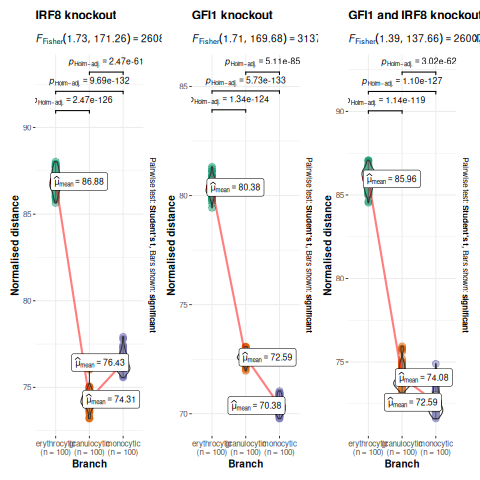

In [97]:
%%R -i irf8_data,gfi1_data,both_data
saveRDS(irf8_data, "irf8_data.rds")
saveRDS(gfi1_data, "gfi1_data.rds")
saveRDS(both_data, "both_data.rds")
options(repr.plot.width = 1, repr.plot.height = 0.75, repr.plot.res = 100)
p1 <- ggwithinstats(irf8_data, x = branch, y = normalised_distance, title = "IRF8 knockout", xlab = "Branch", ylab = "Normalised distance")
p2 <- ggwithinstats(gfi1_data, x = branch, y = normalised_distance, title = "GFI1 knockout", xlab = "Branch", ylab = "Normalised distance")
p3 <- ggwithinstats(both_data, x = branch, y = normalised_distance, title = "GFI1 and IRF8 knockout", xlab = "Branch", ylab = "Normalised distance")
p1 + p2 + p3

Error in validObject(.Object) : 
  invalid class “dsparseModelMatrix” object: superclass "xMatrix" not defined in the environment of the object's class
Error in validObject(.Object) : 
  invalid class “dsparseModelMatrix” object: superclass "xMatrix" not defined in the environment of the object's class
Error in validObject(.Object) : 
  invalid class “dsparseModelMatrix” object: superclass "xMatrix" not defined in the environment of the object's class


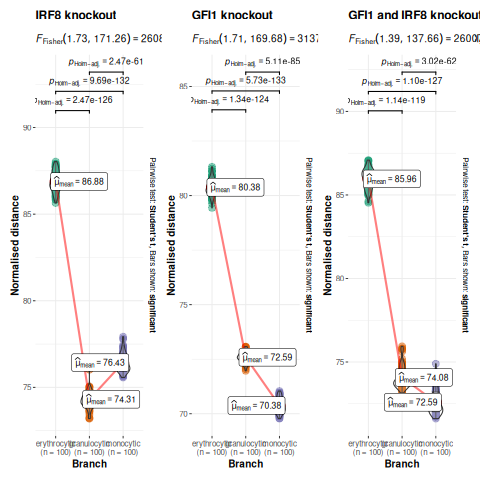

In [98]:
%%R -i irf8_data,gfi1_data,both_data
library(ggplot2)
# options(repr.plot.width = 3, repr.plot.height = 0.75, repr.plot.res = 100)
p1 <- ggwithinstats(irf8_data, x = branch, y = normalised_distance, title = "IRF8 knockout", xlab = "Branch", ylab = "Normalised distance")
p2 <- ggwithinstats(gfi1_data, x = branch, y = normalised_distance, title = "GFI1 knockout", xlab = "Branch", ylab = "Normalised distance")
p3 <- ggwithinstats(both_data, x = branch, y = normalised_distance, title = "GFI1 and IRF8 knockout", xlab = "Branch", ylab = "Normalised distance")
p <- p1 + p2 + p3
ggsave("knockout_comparison.pdf", p, width = 20, height = 7.5, units = "in", dpi = 300)
p

Error in validObject(.Object) : 
  invalid class “dsparseModelMatrix” object: superclass "xMatrix" not defined in the environment of the object's class


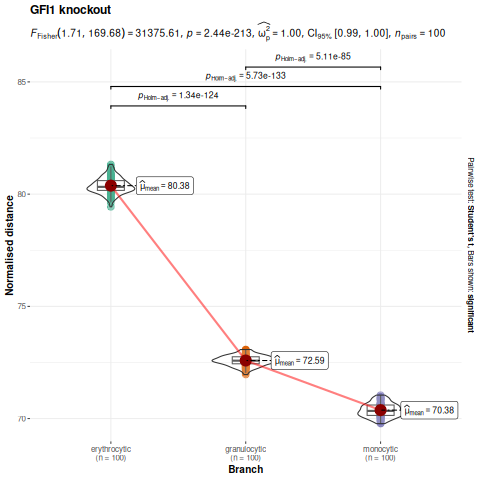

In [99]:
%%R -i gfi1_data
ggwithinstats(gfi1_data, x = branch, y = normalised_distance, title = "GFI1 knockout", xlab = "Branch", ylab = "Normalised distance")

Error in validObject(.Object) : 
  invalid class “dsparseModelMatrix” object: superclass "xMatrix" not defined in the environment of the object's class


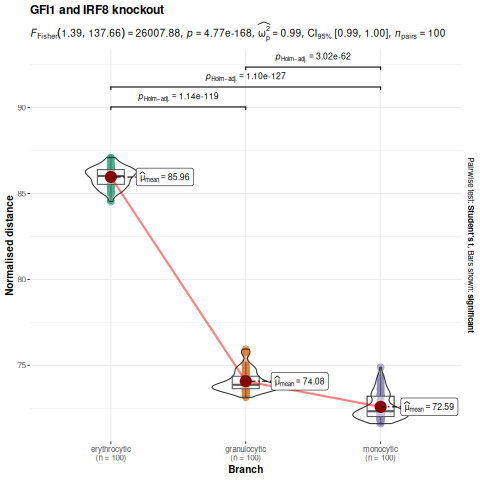

In [100]:
%%R -i both_data
ggwithinstats(both_data, x = branch, y = normalised_distance, title = "GFI1 and IRF8 knockout", xlab = "Branch", ylab = "Normalised distance")

In [101]:
results_irf8

array([[86.46338478, 86.40886885, 86.52663986, 87.91591862, 86.50074256,
        86.54964495, 86.74270475, 85.9431278 , 86.93920923, 86.22333812,
        87.4023282 , 87.37768983, 86.71053283, 87.38692965, 86.97924144,
        86.17331761, 86.53992171, 87.6675952 , 86.71119601, 85.83076816,
        87.23759127, 86.64017345, 87.52937348, 86.74772886, 87.90244004,
        87.30170431, 87.21826383, 87.5245014 , 87.17928144, 86.29223958,
        86.07808313, 87.57198644, 87.82211159, 86.99989877, 87.77873502,
        87.31055742, 86.76935799, 87.20442714, 86.88546145, 87.73184549,
        87.79229461, 86.77155938, 86.76880008, 87.52310703, 86.85651262,
        85.84039395, 86.55850496, 87.20835803, 86.0043321 , 86.03682619,
        88.03522971, 86.8466307 , 87.50294898, 87.17315193, 86.61390543,
        86.46674645, 86.26250873, 87.02192971, 86.96204079, 86.21450636,
        86.61296784, 86.53673172, 86.64165878, 87.26231355, 86.83608324,
        86.24784612, 87.86732053, 86.63609455, 85.9

# 3.5 plotting

In [62]:
adata = ad.read_h5ad("dynchro_prepped_orig.h5ad")
irf8 = ad.read_h5ad("dynchro_prepped_irf8.h5ad")
gfi1 = ad.read_h5ad("dynchro_prepped_gfi1.h5ad")
both = ad.read_h5ad("dynchro_prepped_both.h5ad")

In [63]:
adata, irf8

(AnnData object with n_obs × n_vars = 382 × 500
     obs: 'label', 'n_counts', 'n_genes', 'pct_genes', 'kmeans', 'node', 'branch_id', 'branch_id_alias', 'branch_lam', 'branch_dist', 'S0_pseudotime', 'S3_pseudotime', 'S5_pseudotime', 'S4_pseudotime', 'S2_pseudotime', 'S1_pseudotime', 'branch_id_id', 'pseudotime', 'milestones', 'erythrocytic', 'monocytic', 'granulocytic'
     var: 'n_counts', 'n_cells', 'pct_cells'
     uns: 'branch_id_alias_color', 'id', 'kmeans_color', 'label_color', 'label_colors', 'lineage_labels', 'lineages', 'params', 'pseudocells', 'pseudocells_50_erythrocytic_pseudotime', 'pseudocells_50_granulocytic_pseudotime', 'pseudocells_50_monocytic_pseudotime', 'var_genes', 'workdir'
     obsm: 'X_dr', 'X_mlle', 'X_spring', 'X_stream_S4', 'X_vis', 'X_vis_umap'
     varm: 'pseudocells_50_erythrocytic', 'pseudocells_50_granulocytic', 'pseudocells_50_monocytic',
 AnnData object with n_obs × n_vars = 62 × 500
     obs: 'label', 'pseudotime', 'milestones', 'irf8'
     uns: 'id'

In [64]:
def plot_pseudotime_warping(dataset1, dataset2, warping, lineage, ax = None, key = "X_vis_umap"):
    if ax is None:
        fig, ax = plt.subplots()
    else:
        fig = plt.gcf()
    dataset1 = dataset1[np.argsort(dataset1.obs.pseudotime)]
    dataset2 = dataset2[np.argsort(dataset2.obs.pseudotime)]

    erythrocytic = dataset1[dataset1.obs["erythrocytic"] == True]
    granulocytic = dataset1[dataset1.obs["granulocytic"] == True]
    monocytic = dataset1[dataset1.obs["monocytic"] == True]
    # cell is erythrocytic, granulocytic and monocytic
    common = dataset1[(dataset1.obs["granulocytic"] & dataset1.obs["monocytic"] & dataset1.obs["erythrocytic"])]

    colors = ["#315b25", "#ff681c", "#1b2944", "#3abbba"]

    for dataset, color in zip([erythrocytic, monocytic, granulocytic, common], colors):
        dimred = dataset.obsm[key]
        pseudotime = [i for i, x in enumerate(dataset.obs.pseudotime)]
        ax.scatter(pseudotime, dimred[:, 1], c = color, edgecolors="black", linewidths=1.1, s = 60)

    dimred2 = dataset2.obsm[key]
    pseudotime2 = [i*4 for i, x in enumerate(dataset2.obs.pseudotime)]
    ax.scatter(pseudotime2, dimred2[:, 1], c = "#ce8e90", edgecolors="black", linewidths=1.1, s = 60)

    dataset1_part = dataset1#[dataset1.obs.branch_id_id.isin([0, 1, 3, 4])]
    dataset1_part = dataset1_part[dataset1_part.obs[lineage] == True]  
    seq1 = [x - 1 for x in warping[0][1:]]
    seq2 = [x - 1 for x in warping[1][1:]]

    ds1_x = pd.Series([i for i, x in enumerate(dataset1.obs.pseudotime)])[seq2]
    ds1_y = dataset1_part.obsm[key][seq2, 1]
    ds2_x = pd.Series([i*4 for i, x in enumerate(dataset2.obs.pseudotime)])[seq1]
    ds2_y = dataset2.obsm[key][seq1, 1]

    # plot lines
    
    for x1, y1, x2, y2 in zip(ds1_x, ds1_y, ds2_x, ds2_y):
        ax.plot([x1, x2], [y1, y2], c = "black", alpha = 0.3)
    
    ax.spines[['top', 'right', 'bottom', 'left']].set_visible(False)
    x0 = ax.get_xlim()[0]
    y0 = ax.get_ylim()[0]

    ax.arrow(x0, y0 - 2, 2.2, 0, head_width=0.3, head_length=0.1, fc='k', ec='k')
    ax.arrow(x0, y0 - 2, 0, 5,  head_width=0.1, head_length=0.3, fc='k', ec='k')

    ax.set_xlabel("Pseudotime")
    ax.set_ylabel("UMAP1")
    ax.yaxis.set_label_coords(0.04, 0.2)
    ax.xaxis.set_label_coords(0.11, 0.02)

    ax.set_xticks([])
    ax.set_yticks([])


    return ax

In [213]:
# plot cells in graph between x and y
def plot_ko_scatter(result1: DTWResult, result2: DTWResult, show_pt = False):
    fig, ax = plt.subplots()
    fig.set_size_inches(8, 4)

    assert ((t1 := result1._lin2).n_obs == (t2 := result2._lin2).n_obs) and t1.n_vars == t2.n_vars, "assure that lin2 of both results are the same"

    dataset1 = result1._lin1
    ko = result1._lin2
    dataset2 = result2._lin1

    coordinates1 = result1.path1(), result1.path2() # knockout, wildtype lineage
    coordinates2 = result2.path1(), result2.path2() # knockout, wildtype lineage

    distances1 = [result1.cost()[x - 1][y - 1] for x, y in zip(coordinates1[0], coordinates1[1])]
    distances2 = [result2.cost()[x - 1][y - 1] for x, y in zip(coordinates2[0], coordinates2[1])]

    ratios = [d1 / (d1 + d2) for d1, d2 in zip(distances1, distances2)]

    ko_pseudotime = normalize(ko.obs.pseudotime)
    d1_pseudotime = normalize(dataset1.obs.pseudotime)
    d2_pseudotime = normalize(dataset2.obs.pseudotime)

    if show_pt:
        ko_x = ko_pseudotime
        d1_x = d1_pseudotime
        d2_x = d2_pseudotime
    else:
        ko_x = result1.path1()
        d1_x = result1.path2()
        d2_x = result2.path2()

    ax.scatter(ko_x, ratios, s = 2, c = "black")
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)

    ax.scatter(d1_x, [0.65] * len(result1.path2()), s = 2, c = "red")
    ax.scatter(d2_x, [0.4] * len(result2.path2()), s = 2, c = "green")

def normalize(pseudotime):
    return (pseudotime - pseudotime.min()) / (pseudotime.max() - pseudotime.min())

In [207]:
result2.path1()

array([ 0,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  2,  3,  4,  4,  5,  6,  6,
        6,  6,  6,  6,  7,  8,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18,
       19, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 28, 29, 29, 30, 30, 31,
       32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 44, 44, 44, 44,
       44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 53, 54, 55, 56, 57, 58, 59,
       60, 61, 62])

In [201]:
normalize(result1._lin1.obs.pseudotime).values

array([0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.00596326, 0.01274449, 0.01314315, 0.02072846,
       0.02080954, 0.03966635, 0.04049245, 0.04724617, 0.05058346,
       0.05522298, 0.06080609, 0.06625465, 0.07034744, 0.08046842,
       0.08067805, 0.08078162, 0.09942984, 0.1033976 , 0.11821675,
       0.12468918, 0.12833619, 0.13740807, 0.14022981, 0.15057629,
       0.15147487, 0.15594933, 0.15821287, 0.16229861, 0.16229861,
       0.17004567, 0.17170062, 0.17587264, 0.17832753, 0.17849294,
       0.19223306, 0.19409209, 0.20355079, 0.22399089, 0.23441804,
       0.24358661, 0.24713674, 0.25028345, 0.25795264, 0.25950987,
       0.25980997, 0.26530909, 0.26564257, 0.26951017, 0.27614498,
       0.27614498, 0.28206623, 0.28208733, 0.29613226, 0.3081146 ,
       0.31349284, 0.31871438, 0.32070552, 0.32990938, 0.33357687,
       0.33749556, 0.33992824, 0.34088054, 0.34088054, 0.34088054,
       0.34088054, 0.34202139, 0.34665726, 0.35287527, 0.35346

In [172]:
result1 = warping_irf8[0]
result2 = warping_irf8[0]

result1.cost().shape

(62, 155)

In [183]:
    coordinates1 = result1.path1(), result1.path2() # knockout, wildtype lineage
    coordinates2 = result2.path1(), result2.path2() # knockout, wildtype lineage

    distances1 = [result1.cost()[x - 1][y - 1] for x, y in zip(coordinates1[0], coordinates1[1])]
    distances2 = [result2.cost()[x - 1][y - 1] for x, y in zip(coordinates2[0], coordinates2[1])]

In [187]:
len(distances1), len(distances2)

(156, 156)

In [178]:
result2.cost()[0].shape

(155,)

In [190]:
result2.path2().shape

(156,)

In [177]:
[0] * 9

[0, 0, 0, 0, 0, 0, 0, 0, 0]

ValueError: x and y must be the same size

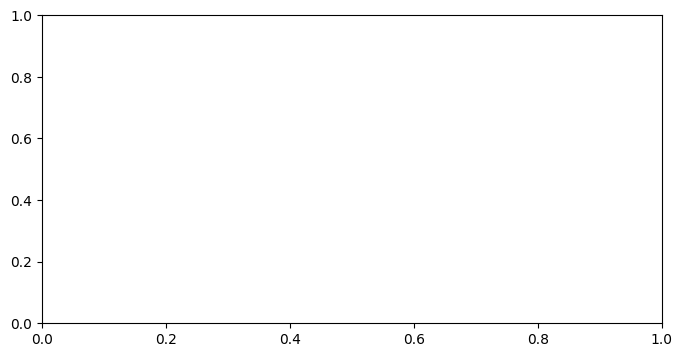

In [215]:
plot_ko_scatter(warping_irf8[0], warping_irf8[1], show_pt = True)

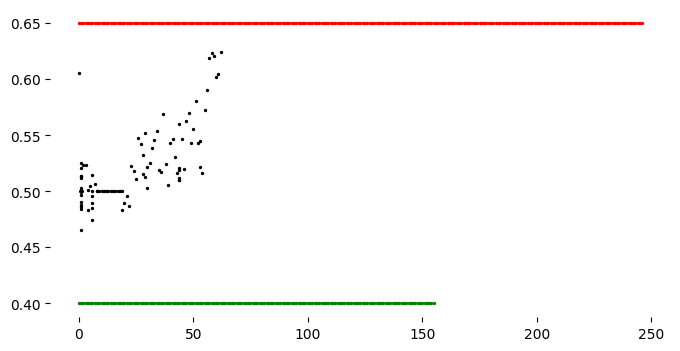

In [193]:
plot_ko_scatter(warping_irf8[0], warping_irf8[2])

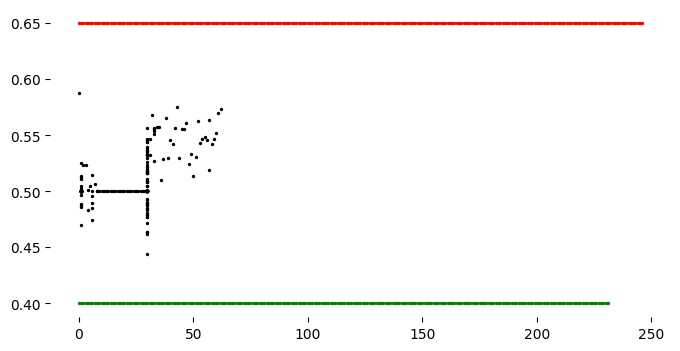

In [194]:
plot_ko_scatter(warping_irf8[1], warping_irf8[2])

In [170]:
warping_irf8[0]._lin2

View of AnnData object with n_obs × n_vars = 62 × 268
    obs: 'label', 'pseudotime', 'milestones', 'irf8'
    uns: 'id', 'label_color', 'lineage_labels', 'lineages', 'params', 'pseudocells', 'pseudocells_50_irf8_pseudotime', 'trans_mlle', 'trans_pca', 'var_genes', 'vis_trans_umap', 'workdir'
    obsm: 'X_dr', 'X_mlle', 'X_pca', 'X_vis', 'X_vis_umap', 'var_genes'
    varm: 'pseudocells_50_irf8'

In [114]:
t1

View of AnnData object with n_obs × n_vars = 155 × 268
    obs: 'label', 'n_counts', 'n_genes', 'pct_genes', 'kmeans', 'node', 'branch_id', 'branch_id_alias', 'branch_lam', 'branch_dist', 'S0_pseudotime', 'S3_pseudotime', 'S5_pseudotime', 'S4_pseudotime', 'S2_pseudotime', 'S1_pseudotime', 'branch_id_id', 'pseudotime', 'milestones', 'erythrocytic', 'monocytic', 'granulocytic'
    var: 'n_counts', 'n_cells', 'pct_cells'
    uns: 'branch_id_alias_color', 'id', 'kmeans_color', 'label_color', 'label_colors', 'lineage_labels', 'lineages', 'params', 'pseudocells', 'pseudocells_50_erythrocytic_pseudotime', 'pseudocells_50_granulocytic_pseudotime', 'pseudocells_50_monocytic_pseudotime', 'var_genes', 'workdir'
    obsm: 'X_dr', 'X_mlle', 'X_spring', 'X_stream_S4', 'X_vis', 'X_vis_umap'
    varm: 'pseudocells_50_erythrocytic', 'pseudocells_50_granulocytic', 'pseudocells_50_monocytic'

In [112]:
warping_irf8[0]._lin2.n_obs == warping_irf8[1]._lin2.n_obs

True

In [106]:
warping_irf8[1]._lin2

View of AnnData object with n_obs × n_vars = 62 × 268
    obs: 'label', 'pseudotime', 'milestones', 'irf8'
    uns: 'id', 'label_color', 'lineage_labels', 'lineages', 'params', 'pseudocells', 'pseudocells_50_irf8_pseudotime', 'trans_mlle', 'trans_pca', 'var_genes', 'vis_trans_umap', 'workdir'
    obsm: 'X_dr', 'X_mlle', 'X_pca', 'X_vis', 'X_vis_umap', 'var_genes'
    varm: 'pseudocells_50_irf8'

In [100]:
warping_irf8

[ID: erythrocytic irf8, Normalized distance: 84.28,
 ID: monocytic irf8, Normalized distance: 78.62,
 ID: granulocytic irf8, Normalized distance: 75.37]

In [101]:
warping_gfi1

[ID: erythrocytic gfi1, Normalized distance: 84.10,
 ID: monocytic gfi1, Normalized distance: 75.55,
 ID: granulocytic gfi1, Normalized distance: 76.27]

In [102]:
warping_both

[ID: erythrocytic both, Normalized distance: 83.89,
 ID: monocytic both, Normalized distance: 76.62,
 ID: granulocytic both, Normalized distance: 77.21]

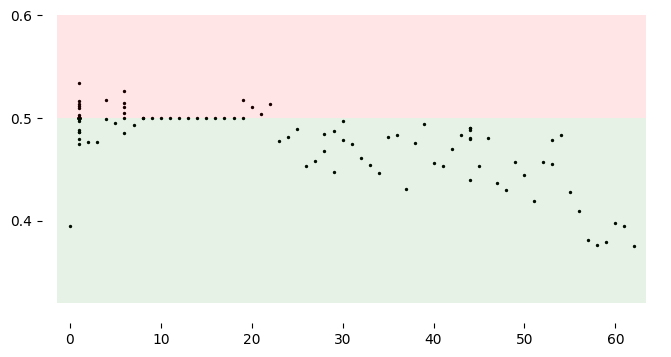

In [65]:
fig, ax = plt.subplots()
fig.set_size_inches(8, 4)
dataset1 = adata
dataset2 = irf8

dataset1 = dataset1[np.argsort(dataset1.obs.pseudotime)]
dataset2 = dataset2[np.argsort(dataset2.obs.pseudotime)]

erythrocytic = dataset1[dataset1.obs["erythrocytic"] == True]
granulocytic = dataset1[dataset1.obs["granulocytic"] == True]
monocytic = dataset1[dataset1.obs["monocytic"] == True]
# cell is erythrocytic, granulocytic and monocytic
common = dataset1[(dataset1.obs["granulocytic"] & dataset1.obs["monocytic"] & dataset1.obs["erythrocytic"])]

# plot distance on path
dst_mtx1 = warping_irf8[2][2]
dst_mtx2 = warping_irf8[0][2]

pad1 = (warping_irf8[2][0], warping_irf8[2][1])
pad2 = (warping_irf8[0][0], warping_irf8[0][1])

dst1 = [dst_mtx1[x - 1][y - 1] for x, y in zip(warping_irf8[2][0], warping_irf8[2][1])]
dst2 = [dst_mtx2[x - 1][y - 1] for x, y in zip(warping_irf8[0][0], warping_irf8[0][1])]
dst2
dsts = [(x, y, x + y, x / (x+y), y / (x+y)) for x, y in zip(dst1, dst2)]

plot_dst = [x[3] for x in dsts]
ax.set_ylim(0.3, 0.6)
# ax.hlines(0.5, 0, 60, colors = (0.5, 0.5, 0.5, 0.5))

ax.scatter(pad2[0], plot_dst, s = 2, c = "black")
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.set_xticks([0, 10, 20, 30, 40, 50, 60])
ax.set_yticks([0.4, 0.5, 0.6])
plt.axhspan(0.5, 0.6, 0.025, 0.975, facecolor = "red", alpha = 0.1)
plt.axhspan(0.32, 0.5, 0.025, 0.975, facecolor = "green", alpha = 0.1)
plt.show()

In [240]:
warping_irf8[0][0]

array([ 0,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  2,  3,  4,  4,  5,  6,  6,
        6,  6,  6,  6,  7,  8,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18,
       19, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 28, 29, 29, 30, 30, 31,
       32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 44, 44, 44, 44,
       44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 53, 54, 55, 56, 57, 58, 59,
       60, 61, 62])

In [239]:
len(plot_dst)

156

In [217]:
adata, irf8

(AnnData object with n_obs × n_vars = 382 × 500
     obs: 'label', 'n_counts', 'n_genes', 'pct_genes', 'kmeans', 'node', 'branch_id', 'branch_id_alias', 'branch_lam', 'branch_dist', 'S0_pseudotime', 'S3_pseudotime', 'S5_pseudotime', 'S4_pseudotime', 'S2_pseudotime', 'S1_pseudotime', 'branch_id_id', 'pseudotime', 'milestones', 'erythrocytic', 'monocytic', 'granulocytic'
     var: 'n_counts', 'n_cells', 'pct_cells'
     uns: 'branch_id_alias_color', 'id', 'kmeans_color', 'label_color', 'label_colors', 'lineage_labels', 'lineages', 'params', 'pseudocells', 'pseudocells_50_erythrocytic_pseudotime', 'pseudocells_50_granulocytic_pseudotime', 'pseudocells_50_monocytic_pseudotime', 'var_genes', 'workdir'
     obsm: 'X_dr', 'X_mlle', 'X_spring', 'X_stream_S4', 'X_vis', 'X_vis_umap'
     varm: 'pseudocells_50_erythrocytic', 'pseudocells_50_granulocytic', 'pseudocells_50_monocytic',
 AnnData object with n_obs × n_vars = 62 × 500
     obs: 'label', 'pseudotime', 'milestones', 'irf8'
     uns: 'id'

In [187]:
dataset1 = adata
dataset1 = dataset1[np.argsort(dataset1.obs.pseudotime)]
dataset1.obs.pseudotime.values

array([ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.04865925,  0.10399305,  0.10724606,  0.16914098,
        0.16980264,  0.32367124,  0.33041211,  0.38552138,  0.41275317,
        0.45061096,  0.49616822,  0.54062764,  0.57402417,  0.65660978,
        0.65832037,  0.6591655 ,  0.811332  ,  0.84370837,  0.96463031,
        1.01744433,  1.04720335,  1.12122849,  1.14425346,  1.22867912,
        1.23601138,  1.27252226,  1.29099242,  1.32433145,  1.32433145,
        1.38754624,  1.40105034,  1.43509342,  1.45512495,  1.45647461,
        1.56859188,  1.5837613 ,  1.66094279,  1.82773081,  1.91281477,
        1.98762887,  2.01659742,  2.04227404,  2.10485342,  2.11756017,
        2.12000894,  2.1648809 ,  2.16760211,  2.19916113,  2.25330008,
        2.25330008,  2.30161662,  2.30178875,  2.41639319,  2.51416721,
        2.55805284,  2.60065982,  2.61690722,  2.69200927,  2.72193539,
        2.75391135,  2.77376161,  2.78153223,  2.78153223,  2.78

In [207]:
dataset1.obs.pseudotime

index
Lsk.63          0.000000
Lsk.65          0.000000
Lsk.31          0.000000
Lsk.26          0.000000
Lsk.49          0.000000
                 ...    
LK.CD34+.34    17.167023
LK.CD34+.62    17.173748
LK.CD34+.40    17.173748
LK.CD34+.17    17.173748
LK.CD34+.10    17.173748
Name: pseudotime, Length: 382, dtype: float64

In [206]:
pd.Series([i for i, x in enumerate(dataset1.obs.pseudotime)])

0        0
1        1
2        2
3        3
4        4
      ... 
377    377
378    378
379    379
380    380
381    381
Length: 382, dtype: int64

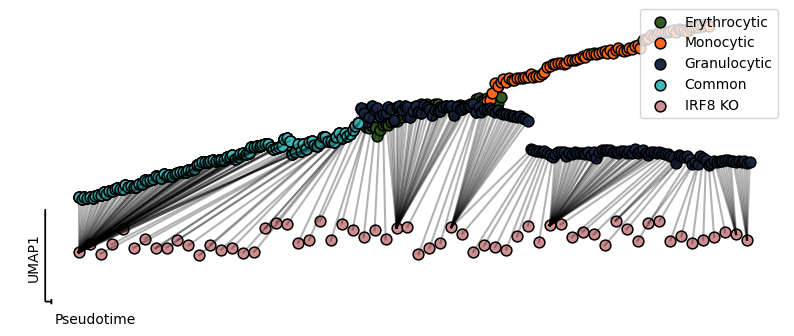

In [214]:
fig, ax = plt.subplots(1, 1)
fig.set_size_inches(10, 4)
plot_pseudotime_warping(adata, irf8, warping_irf8[2], "granulocytic", ax = ax)
# plot_pseudotime_warping(adata, gfi1, warping_gfi1[1], "monocytic", ax = ax)

fig.legend(["Erythrocytic", "Monocytic", "Granulocytic", "Common", "IRF8 KO"], loc = "upper right", bbox_to_anchor=(0.9, 0.9))

plt.show()

<Axes: xlabel='Pseudotime', ylabel='UMAP1'>

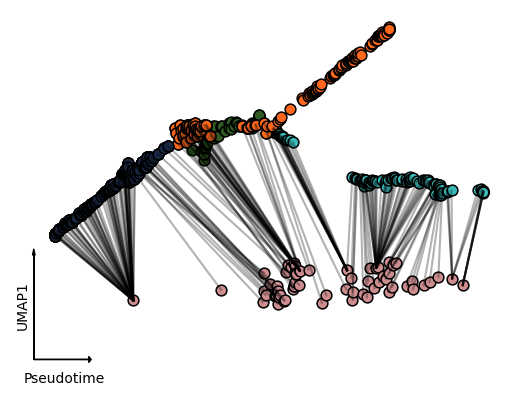

In [128]:
plot_pseudotime_warping(adata, irf8, warping_irf8[2], "granulocytic")

<Axes: xlabel='Pseudotime', ylabel='UMAP1'>

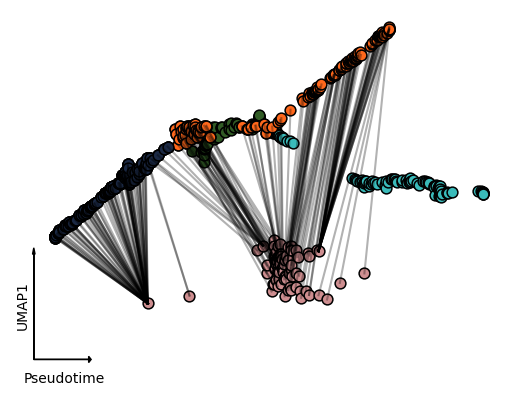

In [129]:
plot_pseudotime_warping(adata, gfi1, warping_gfi1[1], "monocytic")

<Axes: xlabel='Pseudotime', ylabel='UMAP1'>

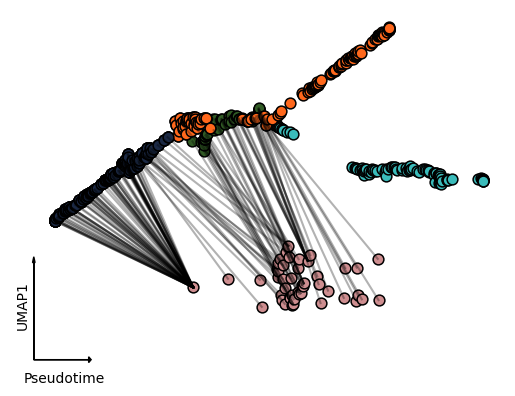

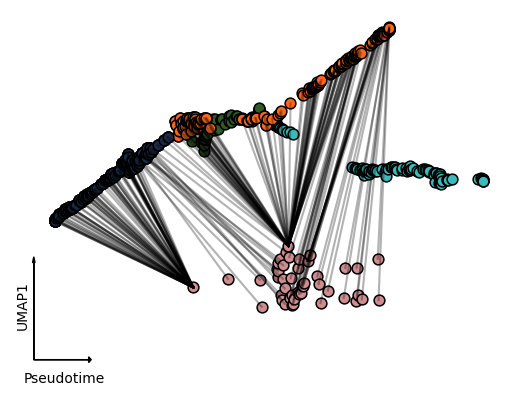

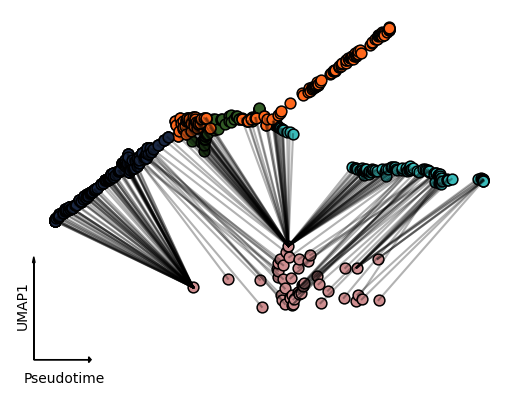

In [130]:
plot_pseudotime_warping(adata, both, warping_both[0], "erythrocytic")
plot_pseudotime_warping(adata, both, warping_both[1], "monocytic")
plot_pseudotime_warping(adata, both, warping_both[2], "granulocytic")

# 4. Rest

In [109]:
import anndata
import scanpy as sc
import seaborn as sns
import dynchro
import numpy as np
import pandas as pd
import matplotlib.pyplot as pltboot
import umap
from sklearn.decomposition import PCA as sklearnPCA
# from sklearn import preprocessing
from sklearn.manifold import (
    LocallyLinearEmbedding,
    TSNE,
    SpectralEmbedding
)
import anndata as ad


# Copy from STREAM

In [4]:
def dimension_reduction(adata,n_neighbors=50, nb_pct = None,n_components = 3,n_jobs = 1,
                        feature='var_genes',method = 'se',eigen_solver=None):

    """Perform dimension reduction.
    
    Parameters
    ----------
    adata: AnnData
        Annotated data matrix.
    n_neighbors: `int`, optional (default: 50)
        The number of neighbor cells used for manifold learning (only valid when 'mlle','se', or 'umap' is specified).
    nb_pct: `float`, optional (default: None)
        The percentage of neighbor cells (when sepcified, it will overwrite n_neighbors).
    n_components: `int`, optional (default: 3)
        Number of components to keep.
    n_jobs: `int`, optional (default: 1)
        The number of parallel jobs to run.
    feature: `str`, optional (default: 'var_genes')
        Choose from {{'var_genes','top_pcs','all'}}
        Feature used for dimension reduction.
        'var_genes': most variable genes
        'top_pcs': top principal components
        'all': all available features (genes)
    method: `str`, optional (default: 'se')
        Choose from {{'se','mlle','umap','pca'}}
        Method used for dimension reduction.
        'se': Spectral embedding algorithm
        'mlle': Modified locally linear embedding algorithm
        'umap': Uniform Manifold Approximation and Projection
        'pca': Principal component analysis
    eigen_solver: `str`, optional (default: None)
        For 'mlle', choose from {{'arpack', 'dense'}}
        For 'se', choose from {{'arpack', 'lobpcg', or 'amg'}}
        The eigenvalue decomposition strategy to use
   
    Returns
    -------
    updates `adata` with the following fields.
    
    X_dr : `numpy.ndarray` (`adata.obsm['X_dr']`)
        A #observations × n_components data matrix after dimension reduction.
    X_mlle : `numpy.ndarray` (`adata.obsm['X_mlle']`)
        Store #observations × n_components data matrix after mlle.
    X_se : `numpy.ndarray` (`adata.obsm['X_se']`)
        Store #observations × n_components data matrix after spectral embedding.    
    X_umap : `numpy.ndarray` (`adata.obsm['X_umap']`)
        Store #observations × n_components data matrix after umap.
    X_pca : `numpy.ndarray` (`adata.obsm['X_pca']`)
        Store #observations × n_components data matrix after pca.
    trans_mlle : `sklearn.manifold.locally_linear.LocallyLinearEmbedding` (`adata.uns['trans_mlle']`)
        Store mlle object
    trans_se : `sklearn.manifold.spectral_embedding_.SpectralEmbedding` (`adata.uns['trans_se']`)
        Store se object
    trans_umap : `umap.UMAP` (`adata.uns['trans_umap']`)
        Store umap object
    trans_pca : `sklearn.decomposition.PCA` (`adata.uns['trans_pca']`)
        Store pca object 
    """

    if(feature not in ['var_genes','top_pcs','all']):
        raise ValueError("unrecognized feature '%s'" % feature)
    if(method not in ['mlle','se','umap','pca']):
        raise ValueError("unrecognized method '%s'" % method)
    if(feature == 'var_genes'):
        input_data = adata.obsm['var_genes']
    if(feature == 'top_pcs'):
        input_data = adata.obsm['top_pcs']
    if(feature == 'all'):
        input_data = adata.X
    print('feature ' + feature + ' is being used ...')
    print(str(n_jobs)+' cpus are being used ...')
    if(nb_pct!=None):
        n_neighbors = int(np.around(input_data.shape[0]*nb_pct))

    if(method == 'mlle'):
        np.random.seed(2)
        if(eigen_solver==None):
            if(input_data.shape[0]<=2000):
                reducer = LocallyLinearEmbedding(n_neighbors=n_neighbors, 
                                                     n_components=n_components,
                                                     n_jobs = n_jobs,
                                                     method = 'modified',eigen_solver = 'dense',random_state=10,
                                                     neighbors_algorithm = 'kd_tree')
            else:
                reducer = LocallyLinearEmbedding(n_neighbors=n_neighbors, 
                                                     n_components=n_components,
                                                     n_jobs = n_jobs,
                                                     method = 'modified',eigen_solver = 'arpack',random_state=10,
                                                     neighbors_algorithm = 'kd_tree')
                
        else:
            reducer = LocallyLinearEmbedding(n_neighbors=n_neighbors, 
                                                 n_components=n_components,
                                                 n_jobs = n_jobs,
                                                 method = 'modified',eigen_solver = eigen_solver,random_state=10,
                                                 neighbors_algorithm = 'kd_tree')        
        trans = reducer.fit(input_data)
        adata.uns['trans_mlle'] = trans
        adata.obsm['X_mlle'] = trans.embedding_
        adata.obsm['X_dr'] = trans.embedding_
    if(method == 'se'):
        np.random.seed(2)
        reducer = SpectralEmbedding(n_neighbors=n_neighbors, 
                                         n_components=n_components,
                                         n_jobs = n_jobs,
                                         eigen_solver = eigen_solver,random_state=10)
        trans = reducer.fit(input_data)
        adata.uns['trans_se'] = trans
        adata.obsm['X_se'] = trans.embedding_
        adata.obsm['X_dr'] = trans.embedding_
    if(method == 'umap'):
        reducer = umap.UMAP(n_neighbors=n_neighbors,n_components=n_components,random_state=42)
        trans = reducer.fit(input_data)
        adata.uns['trans_umap'] = trans
        adata.obsm['X_umap'] = trans.embedding_
        adata.obsm['X_dr'] = trans.embedding_
    if(method == 'pca'):
        reducer = sklearnPCA(n_components=n_components,svd_solver='arpack',random_state=42)
        trans = reducer.fit(input_data)
        adata.uns['trans_pca'] = trans
        adata.obsm['X_pca'] = trans.transform(input_data) 
        adata.obsm['X_dr'] = adata.obsm['X_pca']
    if('params' not in adata.uns_keys()):
        adata.uns['params'] = dict()
    adata.uns['params']['dimension_reduction'] = {'feature':feature,'method':method,'n_components':n_components}
    return None

In [5]:
import shapely.geometry as geom
from statsmodels.nonparametric.smoothers_lowess import lowess
import matplotlib as mpl
import multiprocessing

def project_point_to_curve_distance(XP,p):
    curve = geom.LineString(XP)
    point = geom.Point(p)
    #distance from point to curve
    dist_p_to_c = point.distance(curve)
    return dist_p_to_c   

def select_variable_genes(adata,loess_frac=0.01,percentile=95,n_genes = None,n_jobs = multiprocessing.cpu_count(),
                          save_fig=False,fig_name='std_vs_means.pdf',fig_path=None,fig_size=(4,4),
                          pad=1.08,w_pad=None,h_pad=None):

    """Select the most variable genes.

    Parameters
    ----------
    adata: AnnData
        Annotated data matrix.
    loess_frac: `float`, optional (default: 0.1)
        Between 0 and 1. The fraction of the data used when estimating each y-value in LOWESS function.
    percentile: `int`, optional (default: 95)
        Between 0 and 100. Specify the percentile to select genes.Genes are ordered based on its distance from the fitted curve.
    n_genes: `int`, optional (default: None)
        Specify the number of selected genes. Genes are ordered based on its distance from the fitted curve.
    n_jobs: `int`, optional (default: all available cpus)
        The number of parallel jobs to run when calculating the distance from each gene to the fitted curve
    save_fig: `bool`, optional (default: False)
        if True,save the figure.
    fig_size: `tuple`, optional (default: (4,4))
        figure size.
    fig_path: `str`, optional (default: '')
        if empty, adata.uns['workdir'] will be used.
    fig_name: `str`, optional (default: 'std_vs_means.pdf')
        if save_fig is True, specify figure name.
    pad: `float`, optional (default: 1.08)
        Padding between the figure edge and the edges of subplots, as a fraction of the font size.
    h_pad, w_pad: `float`, optional (default: None)
        Padding (height/width) between edges of adjacent subplots, as a fraction of the font size. Defaults to pad.

    Returns
    -------
    updates `adata` with the following fields.
    var_genes: `numpy.ndarray` (`adata.obsm['var_genes']`)
        Store #observations × #var_genes data matrix used for subsequent dimension reduction.
    var_genes: `pandas.core.indexes.base.Index` (`adata.uns['var_genes']`)
        The selected variable gene names.
    """

    # if(not issparse(adata.X)):
    #     adata.X = csr_matrix(adata.X) 

    if(fig_path is None):
        fig_path = adata.uns['workdir']  
    fig_size = mpl.rcParams['figure.figsize'] if fig_size is None else fig_size
    mean_genes = np.mean(adata.X,axis=0)
    std_genes = np.std(adata.X,ddof=1,axis=0)
    loess_fitted = lowess(std_genes,mean_genes,return_sorted=False,frac=loess_frac)
    residuals = std_genes - loess_fitted
    XP = np.column_stack((np.sort(mean_genes),loess_fitted[np.argsort(mean_genes)]))
    mat_p = np.column_stack((mean_genes,std_genes))
    with multiprocessing.Pool(processes=n_jobs) as pool:
        dist_point_to_curve = pool.starmap(project_point_to_curve_distance,[(XP,mat_p[i,]) for i in range(XP.shape[0])])
    mat_sign = np.ones(XP.shape[0])
    mat_sign[np.where(residuals<0)[0]] = -1
    dist_point_to_curve = np.array(dist_point_to_curve)*mat_sign
    if(n_genes is None):
        cutoff = np.percentile(dist_point_to_curve,percentile)
        id_var_genes = np.where(dist_point_to_curve>cutoff)[0]
        id_non_var_genes = np.where(residuals<=cutoff)[0]
    else:
        id_var_genes = np.argsort(dist_point_to_curve)[::-1][:n_genes]
        id_non_var_genes = np.argsort(dist_point_to_curve)[::-1][n_genes:]
 
    adata.obsm['var_genes'] = adata.X[:,id_var_genes].copy()
    adata.uns['var_genes'] = adata.var_names[id_var_genes]
    print(str(len(id_var_genes))+' variable genes are selected')
    ###plotting
    fig = plt.figure(figsize=fig_size)      
    plt.scatter(mean_genes[id_non_var_genes], std_genes[id_non_var_genes],s=5,alpha=0.2,zorder=1,c='#6baed6')
    plt.scatter(mean_genes[id_var_genes], std_genes[id_var_genes],s=5,alpha=0.9,zorder=2,c='#EC4E4E')
    plt.plot(np.sort(mean_genes), loess_fitted[np.argsort(mean_genes)],linewidth=3,zorder=3,c='#3182bd')
    plt.xlabel('mean value')
    plt.ylabel('standard deviation')
    plt.locator_params(axis='x',nbins=5)
    plt.locator_params(axis='y',nbins=5)
    plt.tight_layout(pad=pad, h_pad=h_pad, w_pad=w_pad)
    if(save_fig):
        plt.savefig(os.path.join(fig_path,fig_name),pad_inches=1,bbox_inches='tight')
        plt.close(fig)
    return None

In [6]:
from pandas.api.types import (
    is_string_dtype,
    is_numeric_dtype
)
import seaborn as sns
import os
def plot_visualization_2D(adata,method='umap',n_neighbors=50, nb_pct=None,perplexity=30.0,color=None,use_precomputed=True,
                          fig_size=None,fig_ncol=3,fig_legend_ncol=1,fig_legend_order = None,
                          vmin=None,vmax=None,alpha=0.8,
                          pad=1.08,w_pad=None,h_pad=None,
                          save_fig=False,fig_path=None,fig_name='visualization_2D.pdf',
                          plotly=False):

    """ Visualize the results in 2D plane
    
    Parameters
    ----------
    adata: AnnData
        Annotated data matrix. 
    method: `str`, optional (default: 'umap')
        Choose from {{'umap','tsne'}}
        Method used for visualization.
        'umap': Uniform Manifold Approximation and Projection      
        'tsne': t-Distributed Stochastic Neighbor Embedding
    n_neighbors: `int`, optional (default: 50)
        The number of neighbor cells (only valid when 'umap' is specified).
    nb_pct: `float`, optional (default: None)
        The percentage of neighbor cells (when sepcified, it will overwrite n_neighbors).
    perplexity: `float`, optional (default: 30.0)
        The perplexity used for tSNE. 
    color: `list` optional (default: None)
        Column names of observations (adata.obs.columns) or variable names(adata.var_names). A list of names to be plotted.    
    use_precomputed: `bool`, optional (default: True)
        If True, the visualization coordinates from previous computing will be used
    fig_size: `tuple`, optional (default: None)
        figure size.
    fig_legend_order: `dict`,optional (default: None)
        Specified order for the appearance of the annotation keys.Only valid for ategorical variable  
        e.g. fig_legend_order = {'ann1':['a','b','c'],'ann2':['aa','bb','cc']}
    fig_legend_ncol: `int`, optional (default: 1)
        The number of columns that the legend has.
    vmin,vmax: `float`, optional (default: None)
        The min and max values are used to normalize continuous values. If None, the respective min and max of continuous values is used.
    alpha: `float`, optional (default: 0.8)
        0.0 transparent through 1.0 opaque
    pad: `float`, optional (default: 1.08)
        Padding between the figure edge and the edges of subplots, as a fraction of the font size.
    h_pad, w_pad: `float`, optional (default: None)
        Padding (height/width) between edges of adjacent subplots, as a fraction of the font size. Defaults to pad.
    save_fig: `bool`, optional (default: False)
        if True,save the figure.
    fig_path: `str`, optional (default: None)
        if save_fig is True, specify figure path. if None, adata.uns['workdir'] will be used.
    fig_name: `str`, optional (default: 'visualization_2D.pdf')
        if save_fig is True, specify figure name.
    plotly: `bool`, optional (default: False)
        if True, plotly will be used to make interactive plots

    Returns
    -------
    updates `adata` with the following fields. (Depending on `method`)
    vis_trans_umap : `umap.UMAP` (`adata.uns['vis_trans_umap']`)
        Store umap object
    vis_trans_tsne : `sklearn.manifold._t_sne.TSNE` (`adata.uns['vis_trans_tsne']`)
        Store tsne object
    X_vis_umap: `numpy.ndarray` (`adata.obsm['X_vis_umap']`)
        Store #observations × 2 umap data matrix. 
    X_vis_tsne: `numpy.ndarray` (`adata.obsm['X_vis_tsne']`)
        Store #observations × 2 tsne data matrix. 
    X_vis : `numpy.ndarray` (`adata.obsm['X_vis']`)
        A #observations × 2 data matrix after visualization.   
    """    
    if(fig_path is None):
        fig_path = adata.uns['workdir']
    fig_size = mpl.rcParams['figure.figsize'] if fig_size is None else fig_size

    if(method not in ['umap','tsne']):
        raise ValueError("unrecognized method '%s'" % method)
    if(color is None):
        color = ['label']
    ###remove duplicate keys
    color = list(dict.fromkeys(color))

    dict_ann = dict()
    for ann in color:
        if(ann in adata.obs.columns):
            dict_ann[ann] = adata.obs[ann]
        elif(ann in adata.var_names):
            dict_ann[ann] = adata.obs_vector(ann)
        else:
            raise ValueError("could not find '%s' in `adata.obs.columns` and `adata.var_names`"  % (ann))
    input_data = adata.obsm['X_dr']
    if(nb_pct!=None):
        n_neighbors = int(np.around(input_data.shape[0]*nb_pct)) 
    if(method == 'umap'):       
        if(use_precomputed and ('X_vis_umap' in adata.obsm_keys())):
            print('Importing precomputed umap visualization ...')
            embedding = adata.obsm['X_vis_umap']
        else:
            reducer = umap.UMAP(n_neighbors=n_neighbors,n_components=2,random_state=42)
            trans = reducer.fit(input_data)
            embedding = trans.embedding_
            adata.uns['vis_trans_umap'] = trans
            adata.obsm['X_vis_umap'] = embedding
    if(method == 'tsne'):
        if(use_precomputed and ('X_vis_tsne' in adata.obsm_keys())):
            print('Importing precomputed tsne visualization ...')
            embedding = adata.obsm['X_vis_tsne']
        else:
            reducer = TSNE(n_components=2, init='pca',perplexity=perplexity, random_state=42)
            trans = reducer.fit(input_data)
            embedding = trans.embedding_
            adata.uns['vis_trans_tsne'] = trans
            adata.obsm['X_vis_tsne'] = embedding
    adata.obsm['X_vis'] = embedding
    if('params' not in adata.uns_keys()):
        adata.uns['params'] = dict()
    adata.uns['params']['plot_visualization_2D'] = {'method':method}
    
    df_plot = pd.DataFrame(index=adata.obs.index,data = embedding,columns=[method.upper()+str(x) for x in [1,2]])
    for ann in color:
        df_plot[ann] = dict_ann[ann]
    df_plot_shuf = df_plot.sample(frac=1,random_state=100)
    
    legend_order = {ann:np.unique(df_plot_shuf[ann]) for ann in color if is_string_dtype(df_plot_shuf[ann])}
    if(fig_legend_order is not None):
        if(not isinstance(fig_legend_order, dict)):
            raise TypeError("`fig_legend_order` must be a dictionary")
        for ann in fig_legend_order.keys():
            if(ann in legend_order.keys()):
                legend_order[ann] = fig_legend_order[ann]
            else:
                print("'%s' is ignored for ordering legend labels due to incorrect name or data type" % ann)

    # if(plotly):
    #     for ann in color:
    #         fig = px.scatter(df_plot_shuf, x='Dim'+str(comp1+1), y='Dim'+str(comp2+1),color=ann,
    #                             opacity=alpha,width=500,height=500,
    #                             color_continuous_scale=px.colors.sequential.Viridis,
    #                             color_discrete_map=adata.uns[ann+'_color'] if ann+'_color' in adata.uns_keys() else {})
    #         fig.update_layout(legend= {'itemsizing': 'constant'}) 
    #         fig.show(renderer="notebook")
    else:
        if(len(color)<fig_ncol):
            fig_ncol=len(color)
        fig_nrow = int(np.ceil(len(color)/fig_ncol))
        fig = plt.figure(figsize=(fig_size[0]*fig_ncol*1.05,fig_size[1]*fig_nrow))
        for i,ann in enumerate(color):
            ax_i = fig.add_subplot(fig_nrow,fig_ncol,i+1)
            if(is_string_dtype(df_plot[ann])):
                sc_i=sns.scatterplot(ax=ax_i,
                                    x=method.upper()+'1', y=method.upper()+'2', 
                                    hue=ann,hue_order = legend_order[ann],
                                    data=df_plot_shuf,
                                    alpha=alpha,linewidth=0,
                                    palette= adata.uns[ann+'_color'] \
                                            if (ann+'_color' in adata.uns_keys()) and (set(adata.uns[ann+'_color'].keys()) >= set(np.unique(df_plot_shuf[ann]))) \
                                            else None
                                    )
                legend_handles, legend_labels = ax_i.get_legend_handles_labels()
                ax_i.legend(handles=legend_handles, labels=legend_labels,
                            bbox_to_anchor=(1, 0.5), loc='center left', ncol=fig_legend_ncol,
                            frameon=False,
                            )
                if(ann+'_color' not in adata.uns_keys()):
                    colors_sns = sc_i.get_children()[0].get_facecolors()
                    colors_sns_scaled = (255*colors_sns).astype(int)
                    adata.uns[ann+'_color'] = {df_plot_shuf[ann][i]:'#%02x%02x%02x' % (colors_sns_scaled[i][0], colors_sns_scaled[i][1], colors_sns_scaled[i][2])
                                                for i in np.unique(df_plot_shuf[ann],return_index=True)[1]}
                ### remove legend title
                # ax_i.get_legend().texts[0].set_text("")
            else:
                vmin_i = df_plot[ann].min() if vmin is None else vmin
                vmax_i = df_plot[ann].max() if vmax is None else vmax
                sc_i = ax_i.scatter(df_plot_shuf[method.upper()+'1'], df_plot_shuf[method.upper()+'2'],
                                    c=df_plot_shuf[ann],vmin=vmin_i,vmax=vmax_i,alpha=alpha)
                cbar = plt.colorbar(sc_i,ax=ax_i, pad=0.01, fraction=0.05, aspect=40)
                cbar.solids.set_edgecolor("face")
                cbar.ax.locator_params(nbins=5)                    
            ax_i.set_xlabel(method.upper()+'1')
            ax_i.set_ylabel(method.upper()+'2',labelpad=2)
            ax_i.get_xaxis().set_ticks([])
            ax_i.get_yaxis().set_ticks([])
            ax_i.set_title(ann)
#             plt.subplots_adjust(hspace=hspace,wspace=wspace)
        plt.tight_layout(pad=pad, h_pad=h_pad, w_pad=w_pad)
        if(save_fig):
            plt.savefig(os.path.join(fig_path,fig_name),pad_inches=1,bbox_inches='tight')
            plt.close(fig)

In [145]:
test = anndata.read_h5ad("orig_stream.h5ad")
test.uns_keys()

['epg',
 'flat_tree',
 'label_color',
 'ori_epg',
 'params',
 'seed_epg',
 'seed_flat_tree',
 'trans_mlle',
 'var_genes',
 'vis_trans_umap',
 'workdir']

In [146]:
test.uns['params']

{'dimension_reduction': {'feature': array(['var_genes'], dtype=object),
  'method': array(['mlle'], dtype=object),
  'n_components': array([4])},
 'epg': {'epg_alpha': array([0.02]),
  'epg_beta': array([0.]),
  'epg_lambda': array([0.05]),
  'epg_mu': array([0.05]),
  'epg_trimmingradius': array(['Inf'], dtype=object),
  'use_vis': array([ True])},
 'plot_visualization_2D': {'method': array(['umap'], dtype=object)}}

# Analysis

### Pre-dynchro

In [128]:
adata = anndata.read_h5ad('orig.h5ad')
adata

AnnData object with n_obs × n_vars = 382 × 12445
    obs: 'label', 'n_counts', 'n_genes', 'pct_genes', 'kmeans', 'node', 'branch_id', 'branch_id_alias', 'branch_lam', 'branch_dist', 'S0_pseudotime', 'S3_pseudotime', 'S5_pseudotime', 'S4_pseudotime', 'S2_pseudotime', 'S1_pseudotime'
    var: 'n_counts', 'n_cells', 'pct_cells'
    obsm: 'X_dr', 'X_mlle', 'X_spring', 'X_stream_S4', 'X_vis', 'X_vis_umap', 'var_genes'

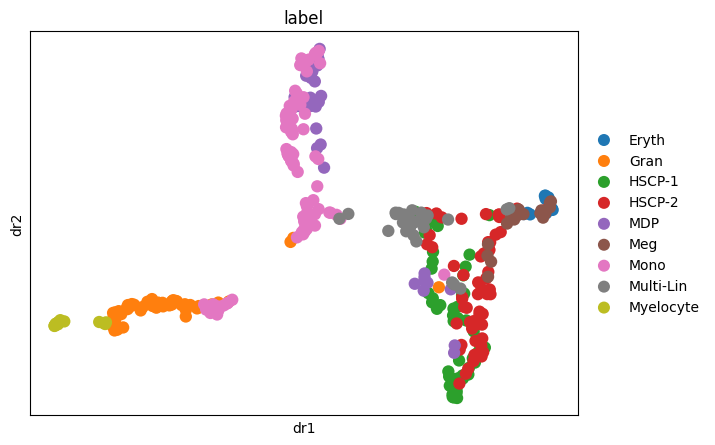

In [136]:
sc.pl.scatter(adata, color='label', basis='dr')

In [114]:
adata_ko = anndata.read_h5ad('before_knockout.h5ad')
adata_ko

AnnData object with n_obs × n_vars = 188 × 23955
    obs: 'label'
    uns: 'label_color', 'workdir'

In [187]:
sc.pl.scatter(adata_ko, color='label', basis='dr')

KeyError: 'compute coordinates using visualization tool dr first'

In [188]:
adata_all = ad.concat([adata, adata_ko], label = "batch")
adata_all.uns["workdir"] = "."
adata_all

AnnData object with n_obs × n_vars = 570 × 12445
    obs: 'label', 'batch'
    uns: 'workdir'

500 variable genes are selected


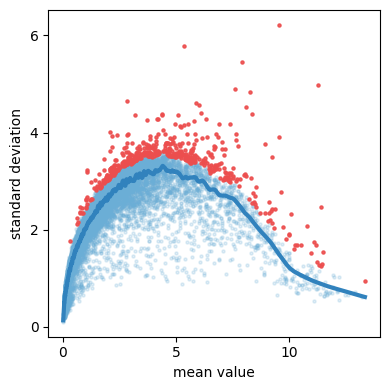

In [189]:
select_variable_genes(adata_all,loess_frac=0.01, n_genes=500)

In [207]:
dimension_reduction(adata_all, method='pca',feature='var_genes',n_components=4,n_neighbors=50,n_jobs=4)

feature var_genes is being used ...
4 cpus are being used ...


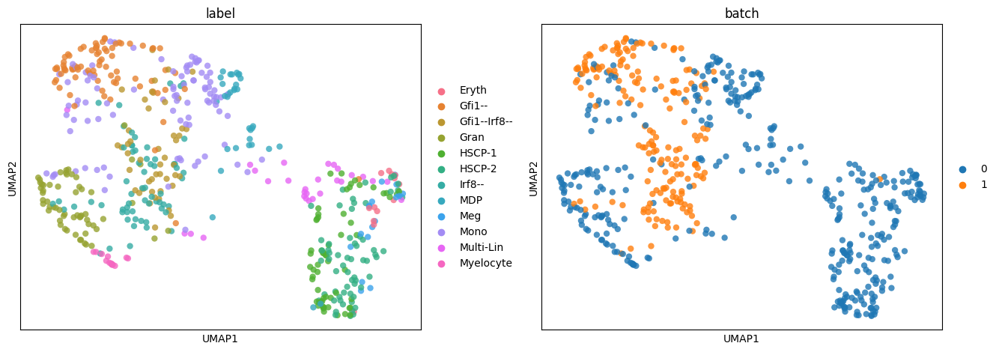

In [208]:
plot_visualization_2D(adata_all,n_neighbors=50,method='umap',color=['label','batch'],use_precomputed=False)

Importing precomputed umap visualization ...


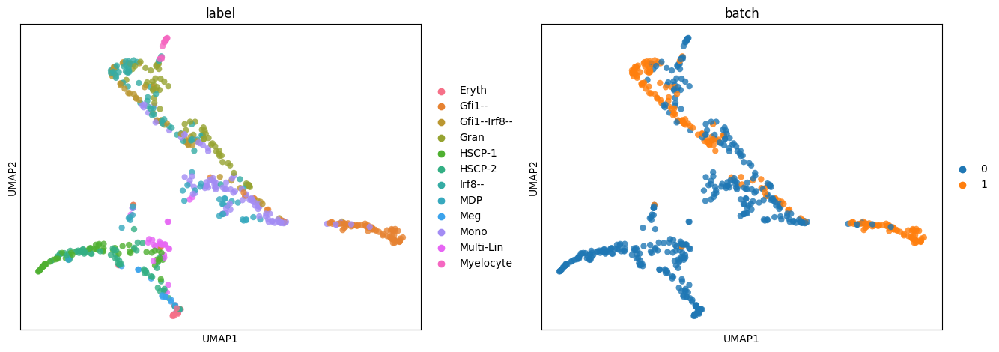

In [194]:
plot_visualization_2D(adata_all,n_neighbors=50,method='umap',color=['label','batch'],use_precomputed=True)

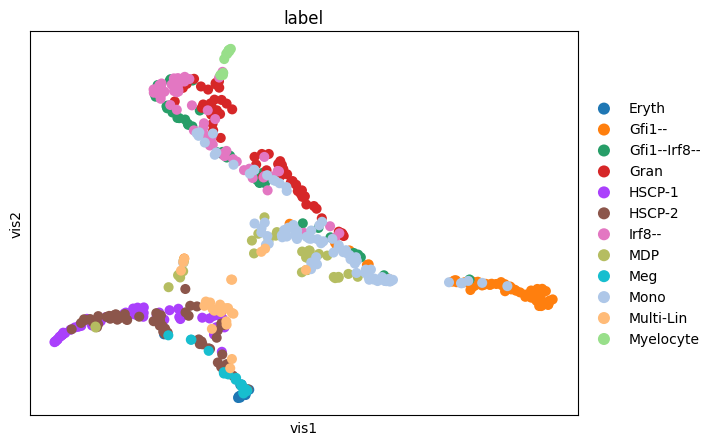

In [206]:
sc.pl.scatter(adata_all, color='label', basis='vis')

In [202]:
adata_all.obsm

AxisArrays with keys: var_genes, X_mlle, X_dr, X_vis_umap, X_vis

In [184]:
adata_all.obs

,label,node,branch_id,branch_id_alias,branch_lam,branch_dist,S0_pseudotime,S3_pseudotime,S5_pseudotime,S4_pseudotime,S2_pseudotime,S1_pseudotime,batch
index,,,,,,,,,,,,,
Lsk.3,HSCP-1,23,"(47, 11)","('S4', 'S3')",1.401050,0.526706,7.204265,3.251385,6.758794,1.401050,15.772697,11.992853,0
Lsk.80,HSCP-1,47,"(47, 11)","('S4', 'S3')",0.048659,0.056745,8.556656,4.603776,8.111185,0.048659,17.125088,13.345244,0
Lsk.81,HSCP-1,40,"(47, 11)","('S4', 'S3')",0.496168,0.100695,8.109147,4.156268,7.663676,0.496168,16.677579,12.897735,0
Lsk.65,HSCP-1,47,"(47, 11)","('S4', 'S3')",0.000000,0.151354,8.605316,4.652436,8.159845,0.000000,17.173748,13.393903,0
Lsk.16,HSCP-1,40,"(47, 11)","('S4', 'S3')",0.450611,0.040671,8.154705,4.201825,7.709234,0.450611,16.723137,12.943292,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
Gfi1--Irf8--.Gfi17,Gfi1--Irf8--,35,"(48, 42)","('S2', 'S0')",7.433700,0.228362,1.134732,5.087612,8.595021,9.740047,7.433700,5.923319,1
Gfi1--Irf8--.H7,Gfi1--Irf8--,35,"(48, 42)","('S2', 'S0')",7.420004,0.138494,1.148428,5.101307,8.608716,9.753743,7.420004,5.937015,1
Gfi1--Irf8--.A8,Gfi1--Irf8--,32,"(49, 42)","('S1', 'S0')",3.616068,0.094763,1.172519,5.125399,8.632808,9.777835,9.740951,3.616068,1


In [276]:
adata_all.obs

,label,batch
index,,
Lsk.3,HSCP-1,0
Lsk.80,HSCP-1,0
Lsk.81,HSCP-1,0
Lsk.65,HSCP-1,0
Lsk.16,HSCP-1,0
...,...,...
Gfi1--Irf8--.Gfi17,Gfi1--Irf8--,1
Gfi1--Irf8--.H7,Gfi1--Irf8--,1
Gfi1--Irf8--.A8,Gfi1--Irf8--,1


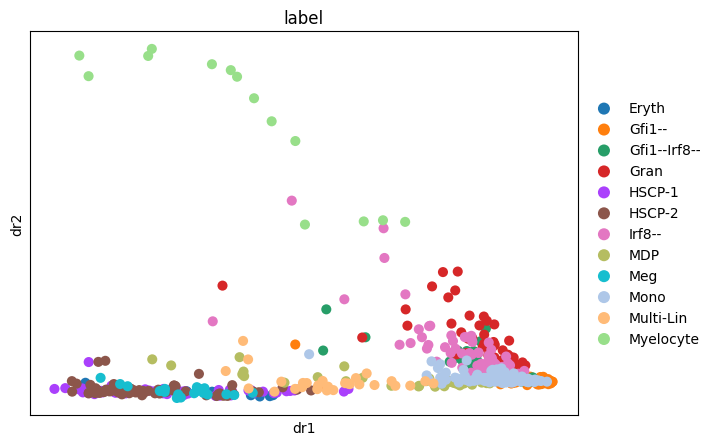

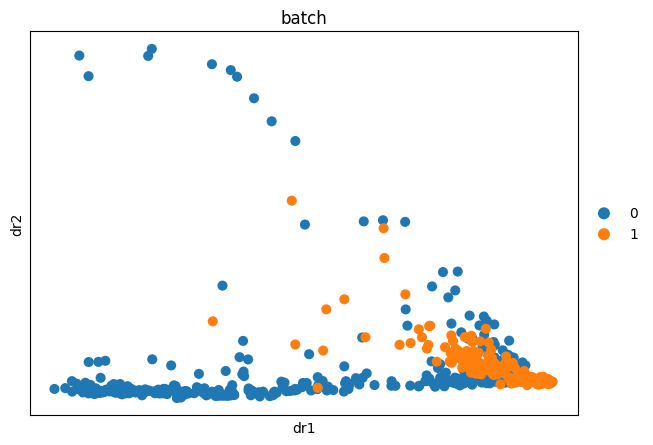

In [171]:
sc.pl.scatter(adata_all, color='label', basis='dr')
sc.pl.scatter(adata_all, color='batch', basis='dr')

Importing precomputed umap visualization ...


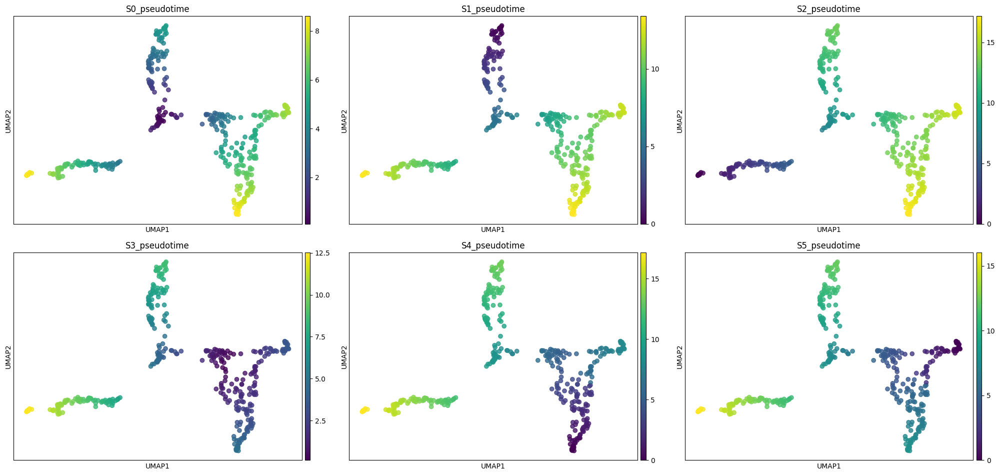

In [216]:
adata.uns["workdir"] = "."
plot_visualization_2D(adata,n_neighbors=50,method='umap',color=['S0_pseudotime', 'S1_pseudotime', 'S2_pseudotime', 'S3_pseudotime', 'S4_pseudotime', 'S5_pseudotime'],use_precomputed=True)

Importing precomputed umap visualization ...


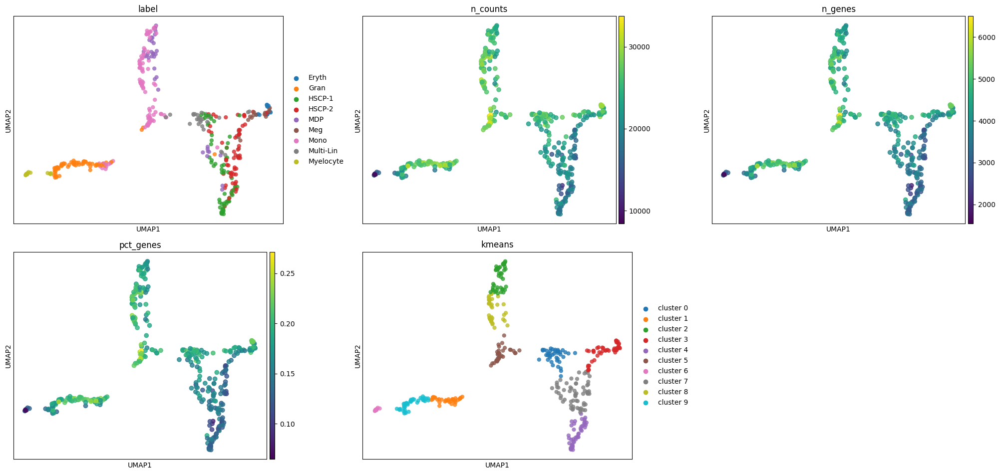

In [217]:
plot_visualization_2D(adata,n_neighbors=50,method='umap',color=['label', 'n_counts', 'n_genes', 'pct_genes', 'kmeans'],use_precomputed=True)

Importing precomputed umap visualization ...


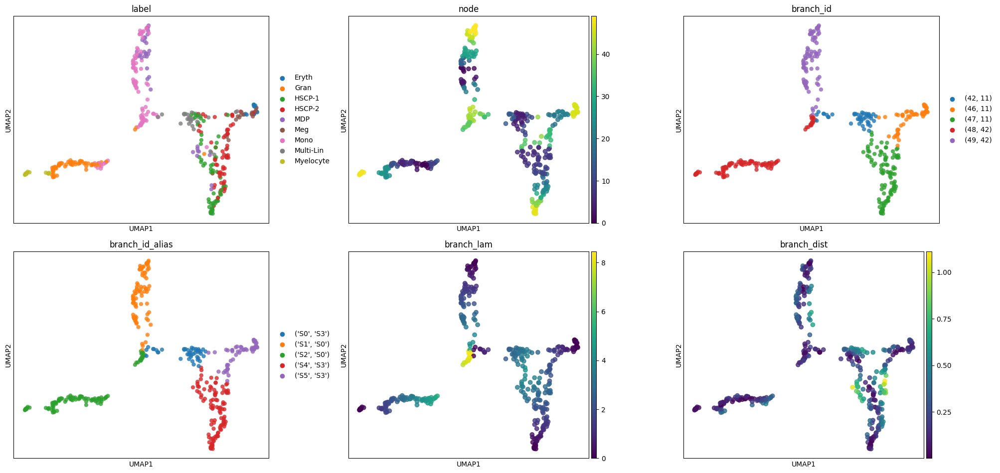

In [219]:
plot_visualization_2D(adata,n_neighbors=50,method='umap',color=['label', 'node', 'branch_id', 'branch_id_alias', 'branch_lam', 'branch_dist'],use_precomputed=True)

Importing precomputed umap visualization ...


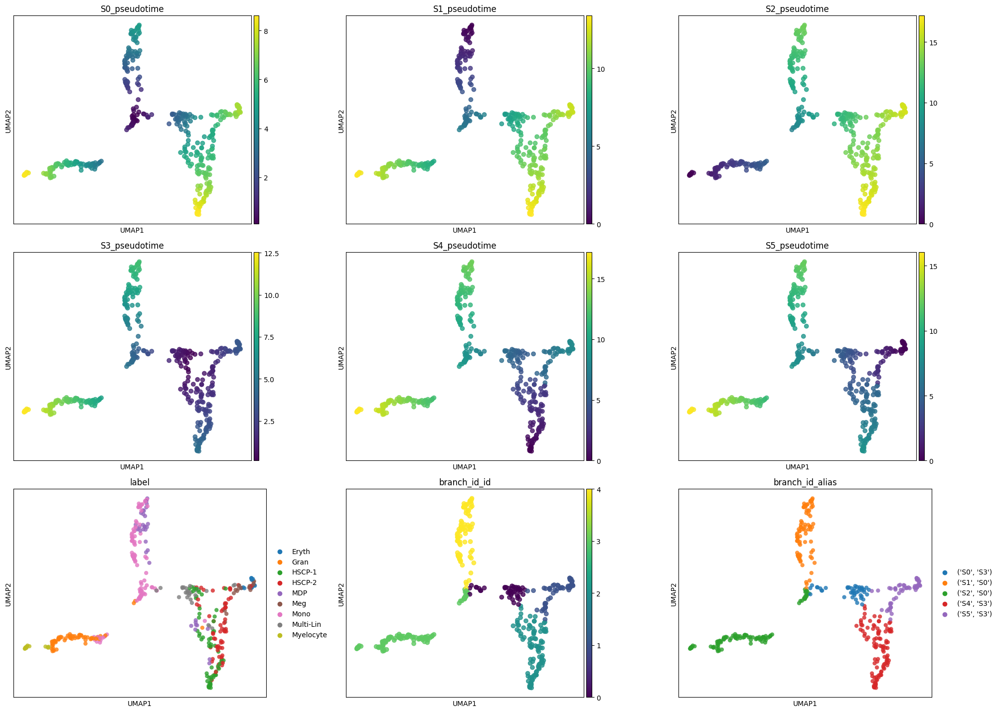

In [256]:
plot_visualization_2D(adata,n_neighbors=50,method='umap',color=['S0_pseudotime', 'S1_pseudotime', 'S2_pseudotime', 'S3_pseudotime', 'S4_pseudotime', 'S5_pseudotime', 'label', 'branch_id_id', 'branch_id_alias'],use_precomputed=True)

In [257]:
adata.obs["pseudotime"] = adata.obs["S5_pseudotime"]
# fix milestones
adata.obs["milestones"] = adata.obs["branch_id_id"]
lineages = {"erythrocytic": [1, 2], "monocytic": [1, 0, 4], "granulocytic": [1, 0, 3]}
adata.uns["lineages"] = lineages
adata.write_h5ad("dynchro_prepped_orig.h5ad")

In [247]:
adata.obs["branch_id_id"] = [list(adata.obs["branch_id"].cat.categories).index(x) for x in adata.obs["branch_id"]]
adata.obs[["branch_id_id", "branch_id"]]

,branch_id_id,branch_id
index,,
Lsk.3,2,"(47, 11)"
Lsk.80,2,"(47, 11)"
Lsk.81,2,"(47, 11)"
Lsk.65,2,"(47, 11)"
Lsk.16,2,"(47, 11)"
...,...,...
LK.CD34+.62,3,"(48, 42)"
LK.CD34+.34,3,"(48, 42)"
LK.CD34+.40,3,"(48, 42)"


In [249]:
adata.obs["branch_id"].cat.categories

Index(['(42, 11)', '(46, 11)', '(47, 11)', '(48, 42)', '(49, 42)'], dtype='object')

In [254]:
for y in ["S0_pseudotime", "S1_pseudotime", "S2_pseudotime", "S3_pseudotime", "S4_pseudotime", "S5_pseudotime"]:
    print(f"{y}:")
    for x in adata.obs["branch_id_alias"].cat.categories:
        t = max(adata[adata.obs.branch_id_alias == x].obs[y])
        print(f"{x}: {t}")
    print("=====================================")



S0_pseudotime:
('S0', 'S3'): 3.7940424319462145
('S1', 'S0'): 4.788587353167246
('S2', 'S0'): 8.568431923064372
('S4', 'S3'): 8.605315669327936
('S5', 'S3'): 7.460288755954167
S1_pseudotime:
('S0', 'S3'): 8.582629785113461
('S1', 'S0'): 4.691793133805524
('S2', 'S0'): 13.357019276231618
('S4', 'S3'): 13.393903022495184
('S5', 'S3'): 12.248876109121413
S2_pseudotime:
('S0', 'S3'): 12.362474355010587
('S1', 'S0'): 13.357019276231618
('S2', 'S0'): 8.4579549197245
('S4', 'S3'): 17.17374759239231
('S5', 'S3'): 16.02872067901854
S3_pseudotime:
('S0', 'S3'): 3.831463418294761
('S1', 'S0'): 8.741467280919107
('S2', 'S0'): 12.521311850816232
('S4', 'S3'): 4.652435741576077
('S5', 'S3'): 3.507408828202307
S4_pseudotime:
('S0', 'S3'): 8.483899159870838
('S1', 'S0'): 13.393903022495182
('S2', 'S0'): 17.17374759239231
('S4', 'S3'): 4.506959344578765
('S5', 'S3'): 8.159844569778384
S5_pseudotime:
('S0', 'S3'): 7.338872246497068
('S1', 'S0'): 12.248876109121413
('S2', 'S0'): 16.02872067901854
('S4', 

Canonical pseudotime is the S5 pseudotime

/home/louise/Work/dynchro/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:227: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/home/louise/Work/dynchro/lib/python3.11/site-packages/shapely/measurement.py:72: RuntimeWarning: invalid value encountered in distance
  return lib.distance(a, b, **kwargs)
/home/louise/Work/dynchro/lib/python3.11/site-packages/shapely/measurement.py:72: RuntimeWarning: invalid value encountered in distance
  return lib.distance(a, b, **kwargs)
/home/louise/Work/dynchro/lib/python3.11/site-packages/shapely/measurement.py:72: RuntimeWarning: invalid value encountered in distance
  return lib.distance(a, b, **kwargs)
/home/louise/Work/dynchro/lib/python3.11/site-packages/shapely/measurement.py:72: RuntimeWarning: invalid value encountered in distance
  return lib.distance(a, b, **kwargs)
/home/louise/Work/dynchro/lib/python3.11/site-packages/shapely/measurement.py:72: RuntimeWarning: inv

500 variable genes are selected


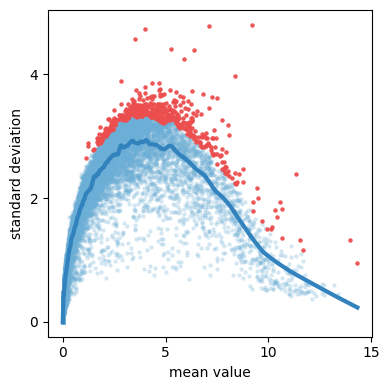

In [115]:
select_variable_genes(adata_ko, loess_frac=0.01, n_genes=500)

In [116]:
dimension_reduction(adata_ko, method="pca", feature="var_genes", n_components=4, n_neighbors=50, n_jobs=4)

feature var_genes is being used ...
4 cpus are being used ...


In [117]:
for k, v in adata_ko.uns["label_color"].items():
    adata_ko.uns["label_color"][k] = v[0]


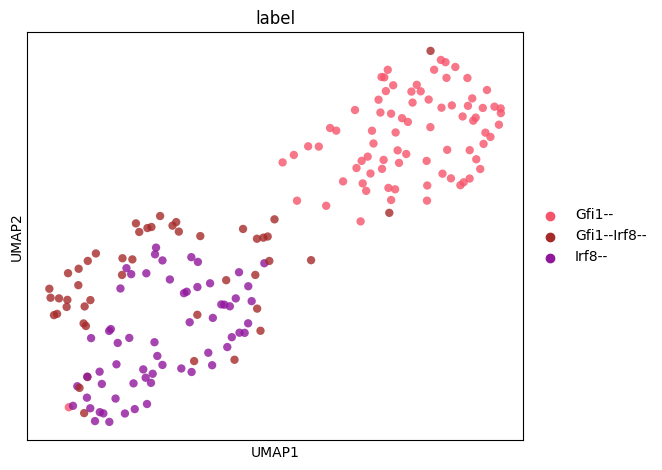

In [118]:
plot_visualization_2D(adata_ko, n_neighbors=50, method="umap", color = ["label"], use_precomputed=False)

In [128]:
adata_ko.uns["var_genes"] = list(adata_ko.uns["var_genes"])
len(adata_ko.uns["var_genes"])

500

In [121]:
adata_ko = adata_ko[:, adata_ko.uns["var_genes"]]

In [127]:
mapped_irf8 = ad.read_h5ad("irf8_mapped.h5ad")
mapped_gfi1 = ad.read_h5ad("gfil_mapped.h5ad")
mapped_both = ad.read_h5ad("both_mapped.h5ad")
mapped_irf8, mapped_gfi1, mapped_both

(AnnData object with n_obs × n_vars = 62 × 23955
     obs: 'label', 'node', 'branch_id', 'branch_id_alias', 'branch_lam', 'branch_dist', 'S0_pseudotime', 'S3_pseudotime', 'S5_pseudotime', 'S4_pseudotime', 'S2_pseudotime', 'S1_pseudotime', 'batch'
     uns: 'epg', 'flat_tree', 'label_color', 'var_genes', 'vis_trans_umap', 'workdir'
     obsm: 'X_dr', 'X_vis_umap', 'var_genes',
 AnnData object with n_obs × n_vars = 79 × 23955
     obs: 'label', 'node', 'branch_id', 'branch_id_alias', 'branch_lam', 'branch_dist', 'S0_pseudotime', 'S3_pseudotime', 'S5_pseudotime', 'S4_pseudotime', 'S2_pseudotime', 'S1_pseudotime', 'batch'
     uns: 'epg', 'flat_tree', 'label_color', 'var_genes', 'vis_trans_umap', 'workdir'
     obsm: 'X_dr', 'X_vis_umap', 'var_genes',
 AnnData object with n_obs × n_vars = 47 × 23955
     obs: 'label', 'node', 'branch_id', 'branch_id_alias', 'branch_lam', 'branch_dist', 'S0_pseudotime', 'S3_pseudotime', 'S5_pseudotime', 'S4_pseudotime', 'S2_pseudotime', 'S1_pseudotime', 'ba

In [129]:
irf8 = adata_ko[adata_ko.obs.label == "Irf8--"]
gfi1 = adata_ko[adata_ko.obs.label == "Gfi1--"]
both = adata_ko[adata_ko.obs.label == "Gfi1--Irf8--"]
irf8, gfi1, both

(View of AnnData object with n_obs × n_vars = 62 × 500
     obs: 'label'
     uns: 'label_color', 'workdir', 'var_genes', 'trans_pca', 'params', 'vis_trans_umap'
     obsm: 'var_genes', 'X_pca', 'X_dr', 'X_vis_umap', 'X_vis',
 View of AnnData object with n_obs × n_vars = 79 × 500
     obs: 'label'
     uns: 'label_color', 'workdir', 'var_genes', 'trans_pca', 'params', 'vis_trans_umap'
     obsm: 'var_genes', 'X_pca', 'X_dr', 'X_vis_umap', 'X_vis',
 View of AnnData object with n_obs × n_vars = 47 × 500
     obs: 'label'
     uns: 'label_color', 'workdir', 'var_genes', 'trans_pca', 'params', 'vis_trans_umap'
     obsm: 'var_genes', 'X_pca', 'X_dr', 'X_vis_umap', 'X_vis')

In [130]:
mapped_irf8.obs["S5_pseudotime"]

index
Irf8.Null.10-new     7.218443
Irf8.Null.11-new     7.174709
Irf8.Null.12-new     9.014411
Irf8.Null.13-new    10.784788
Irf8.Null.14-new     7.292647
                      ...    
Irf8.Null.63-new    12.110735
Irf8.Null.6-new      5.508220
Irf8.Null.7-new     11.488973
Irf8.Null.8-new     11.722497
Irf8.Null.9-new      8.415615
Name: S5_pseudotime, Length: 62, dtype: float64

In [10]:
irf8.obs["label"]

NameError: name 'irf8' is not defined

In [147]:
irf8.obs["pseudotime"] = mapped_irf8.obs["S5_pseudotime"].values
gfi1.obs["pseudotime"] = mapped_gfi1.obs["S5_pseudotime"].values
both.obs["pseudotime"] = mapped_both.obs["S5_pseudotime"].values
irf8, gfi1, both

(AnnData object with n_obs × n_vars = 62 × 500
     obs: 'label', 'pseudotime', 'milestones', 'irf8'
     uns: 'label_color', 'workdir', 'var_genes', 'trans_pca', 'params', 'vis_trans_umap', 'id', 'lineages', 'lineage_labels', 'pseudocells_50_irf8_pseudotime', 'pseudocells'
     obsm: 'var_genes', 'X_pca', 'X_dr', 'X_vis_umap', 'X_vis'
     varm: 'pseudocells_50_irf8',
 AnnData object with n_obs × n_vars = 79 × 500
     obs: 'label', 'pseudotime', 'milestones', 'gfi1'
     uns: 'label_color', 'workdir', 'var_genes', 'trans_pca', 'params', 'vis_trans_umap', 'id', 'lineages', 'lineage_labels', 'pseudocells_50_gfi1_pseudotime', 'pseudocells'
     obsm: 'var_genes', 'X_pca', 'X_dr', 'X_vis_umap', 'X_vis'
     varm: 'pseudocells_50_gfi1',
 AnnData object with n_obs × n_vars = 47 × 500
     obs: 'label', 'pseudotime', 'milestones', 'both'
     uns: 'label_color', 'workdir', 'var_genes', 'trans_pca', 'params', 'vis_trans_umap', 'id', 'lineages', 'lineage_labels', 'pseudocells_50_both_pseudoti

## dynchro analysis

In [2]:
lineages = {"erythrocytic": [1, 2], "monocytic": [1, 0, 4], "granulocytic": [1, 0, 3]}
adata, irf8, gfi1, both, lineages

NameError: name 'adata' is not defined

In [153]:
# Run lineage prep on adata
adata.uns["id"] = "wildtype"
adata.uns["lineages"] = lineages
adata.obs["milestones"] = adata.obs["branch_id_id"]
for name, labels in lineages.items():
    adata = dynchro.pp.label_lineage(adata, "milestones", labels, name)
for name, labels in lineages.items():
    adata = dynchro.pp.calculate_pseudocells(adata, 50, name)
adata = dynchro.pp.merge_pseudocells_lineages(adata, list(lineages.keys()), 50)
adata

/home/louise/Work/dynchro/src/dynchro/pp/pseudocells.py:53: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[f"transition_matrix_{amount}"] = np.array(


AnnData object with n_obs × n_vars = 382 × 12445
    obs: 'label', 'n_counts', 'n_genes', 'pct_genes', 'kmeans', 'node', 'branch_id', 'branch_id_alias', 'branch_lam', 'branch_dist', 'S0_pseudotime', 'S3_pseudotime', 'S5_pseudotime', 'S4_pseudotime', 'S2_pseudotime', 'S1_pseudotime', 'branch_id_id', 'pseudotime', 'milestones', 'erythrocytic', 'monocytic', 'granulocytic'
    var: 'n_counts', 'n_cells', 'pct_cells'
    uns: 'branch_id_alias_color', 'branch_id_color', 'id', 'kmeans_color', 'label_color', 'label_colors', 'lineage_labels', 'lineages', 'params', 'pseudocells', 'pseudocells_50_erythrocytic_pseudotime', 'pseudocells_50_granulocytic_pseudotime', 'pseudocells_50_monocytic_pseudotime', 'var_genes', 'workdir'
    obsm: 'X_dr', 'X_mlle', 'X_spring', 'X_stream_S4', 'X_vis', 'X_vis_umap', 'var_genes'
    varm: 'pseudocells_50_erythrocytic', 'pseudocells_50_granulocytic', 'pseudocells_50_monocytic'

In [154]:
# Run lineage prep on irf8, gfi1, both
irf8.uns["id"] = "irf8"
gfi1.uns["id"] = "gfi1"
both.uns["id"] = "both"

for a in [irf8, gfi1, both]:
    a.uns["lineages"] = lineages
    a.obs["milestones"] = 1
    a = dynchro.pp.label_lineage(a, "milestones", [1], a.uns["id"])
    a = dynchro.pp.calculate_pseudocells(a, 50, a.uns["id"])

irf8, gfi1, both


/home/louise/Work/dynchro/src/dynchro/pp/pseudocells.py:53: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[f"transition_matrix_{amount}"] = np.array(


(AnnData object with n_obs × n_vars = 62 × 500
     obs: 'label', 'pseudotime', 'milestones', 'irf8'
     uns: 'label_color', 'workdir', 'var_genes', 'trans_pca', 'params', 'vis_trans_umap', 'id', 'lineages', 'lineage_labels', 'pseudocells_50_irf8_pseudotime', 'pseudocells'
     obsm: 'var_genes', 'X_pca', 'X_dr', 'X_vis_umap', 'X_vis'
     varm: 'pseudocells_50_irf8',
 AnnData object with n_obs × n_vars = 79 × 500
     obs: 'label', 'pseudotime', 'milestones', 'gfi1'
     uns: 'label_color', 'workdir', 'var_genes', 'trans_pca', 'params', 'vis_trans_umap', 'id', 'lineages', 'lineage_labels', 'pseudocells_50_gfi1_pseudotime', 'pseudocells'
     obsm: 'var_genes', 'X_pca', 'X_dr', 'X_vis_umap', 'X_vis'
     varm: 'pseudocells_50_gfi1',
 AnnData object with n_obs × n_vars = 47 × 500
     obs: 'label', 'pseudotime', 'milestones', 'both'
     uns: 'label_color', 'workdir', 'var_genes', 'trans_pca', 'params', 'vis_trans_umap', 'id', 'lineages', 'lineage_labels', 'pseudocells_50_both_pseudoti

In [152]:
adata.uns["lineage_labels"] = []

In [157]:
# irf8.uns["trans_pca"] = 0
# irf8.uns["vis_trans_umap"] = 0
irf8.uns["pseudocells_50_irf8_pseudotime"] = irf8.uns["pseudocells_50_irf8_pseudotime"].to_dict()

In [158]:
# gfi1.uns["trans_pca"] = 0
# gfi1.uns["vis_trans_umap"] = 0
gfi1.uns["pseudocells_50_gfi1_pseudotime"] = gfi1.uns["pseudocells_50_gfi1_pseudotime"].to_dict()

# both.uns["trans_pca"] = 0
# both.uns["vis_trans_umap"] = 0
both.uns["pseudocells_50_both_pseudotime"] = both.uns["pseudocells_50_both_pseudotime"].to_dict()

In [342]:
gfi1.uns["var_genes"] = 0
both.uns["var_genes"] = 0

In [155]:
adata.uns["lineage_labels"] = adata.uns["lineage_labels"][0:3]
irf8.uns["lineage_labels"] = irf8.uns["lineage_labels"][0:1]
gfi1.uns["lineage_labels"] = gfi1.uns["lineage_labels"][0:1]
both.uns["lineage_labels"] = both.uns["lineage_labels"][0:1]

In [159]:
adata.write_h5ad("dynchro_prepped_orig.h5ad")
irf8.write_h5ad("dynchro_prepped_irf8.h5ad")
gfi1.write_h5ad("dynchro_prepped_gfi1.h5ad")
both.write_h5ad("dynchro_prepped_both.h5ad")

In [2]:
adata = ad.read_h5ad("dynchro_prepped_orig.h5ad")
irf8 = ad.read_h5ad("dynchro_prepped_irf8.h5ad")
gfi1 = ad.read_h5ad("dynchro_prepped_gfi1.h5ad")
both = ad.read_h5ad("dynchro_prepped_both.h5ad")

### config and run all

In [161]:
config = {
    "compare_lineages_pseudocells": False,
    "compare_lineages_pseudocells_label": "pseudocells_50",
    "compare_trajectories_pseudocells": False,
    "compare_trajectories_pseudocells_label": "pseudocells_50",
    "align_pseudocells": False,
}
res = dynchro.tl.get_matching_lineages([adata, irf8], config)
res, adata.uns["lineage_labels"]

((array([0]),
  array([0]),
  [[23660.979663811733, 24735.64320734176, 25801.781147680937]]),
 array(['erythrocytic', 'monocytic', 'granulocytic'], dtype=object))

In [162]:
config = {
    "compare_lineages_pseudocells": False,
    "compare_lineages_pseudocells_label": "pseudocells_50",
    "compare_trajectories_pseudocells": False,
    "compare_trajectories_pseudocells_label": "pseudocells_50",
    "align_pseudocells": False,
}
res = dynchro.tl.get_matching_lineages([adata, gfi1], config)
res, adata.uns["lineage_labels"]

((array([0]),
  array([1]),
  [[25290.45467948417, 23801.04971265805, 25620.82056443175]]),
 array(['erythrocytic', 'monocytic', 'granulocytic'], dtype=object))

In [17]:
config = {
    "compare_lineages_pseudocells": False,
    "compare_lineages_pseudocells_label": "pseudocells_50",
    "compare_trajectories_pseudocells": False,
    "compare_trajectories_pseudocells_label": "pseudocells_50",
    "align_pseudocells": False,
}
res = dynchro.tl.get_matching_lineages([adata, both], config)
res, adata.uns["lineage_labels"]

((array([0]),
  array([0]),
  [[69586.4813450801, 74310.64537889468, 79025.56223181494]]),
 array(['erythrocytic', 'monocytic', 'granulocytic'], dtype=object))

### config and visulaise all

In [43]:
def plot_comparisons(adata, ko, label_ko):
    trajectories = [adata, ko]

    config = {
        "compare_lineages_pseudocells": False,
        "compare_lineages_pseudocells_label": "pseudocells_50",
        "compare_trajectories_pseudocells": False,
        "compare_trajectories_pseudocells_label": "pseudocells_50",
        "align_pseudocells": False,
    }


    common_vars = list(set.intersection(*(set(trajectory.var_names) for trajectory in trajectories)))

    lineages = [
        [
            dynchro.tl.get_counts_common_vars(trajectory, config, "compare_trajectories_pseudocells", linlabel, common_vars)
            for linlabel in trajectory.uns["lineage_labels"]
        ]
        for trajectory in trajectories
    ]
    results = []
    print(label_ko)
    for lineage1, label in zip(lineages[0], adata.uns["lineage_labels"]):
        for lineage2 in lineages[1]:
            total_dist, cost, distances = dynchro.tl.skip_dtw(lineage2, lineage1, distance = "correlation")
            total_dist_norm = total_dist / (lineage1.shape[0] * lineage2.shape[0])
            path1, path2 = dynchro.tl.skip_traceback(distances[1:, 1:])
            print(max(path1), max(path2))

            fig, (ax1, ax2) = plt.subplots(1,2)
            fig.set_size_inches(12, 4)
            sns.heatmap(cost, ax = ax1)
            distances = distances[1:, 1:]
            sns.heatmap(distances, ax = ax2)
            # plot the path
            # path1 = [max(path1) - x for x in path1]
            plt.scatter(path2, path1, c = "white")
            plt.show()

            results.append(f"{label_ko.upper()}: \t{label}: \t{total_dist}, \t{total_dist_norm}\n")

    print("".join(results))

In [35]:
a = np.array([[1, 2, 3], [4, 5, 6]])
a[::-1, :]

array([[4, 5, 6],
       [1, 2, 3]])

irf8
61 154


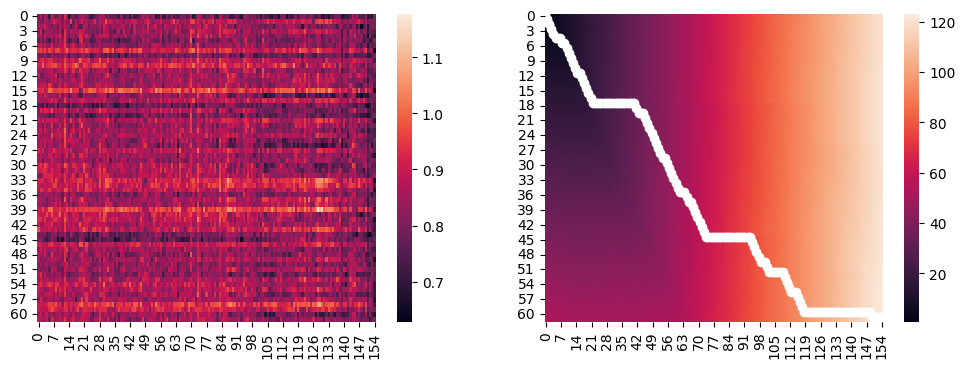

61 179


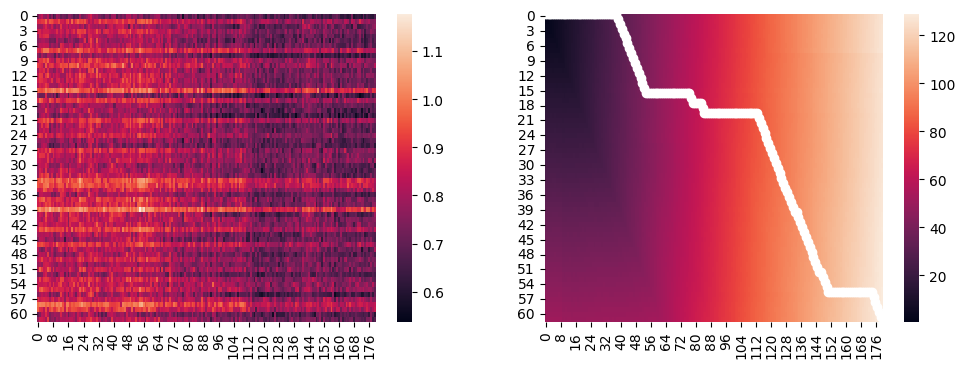

61 194


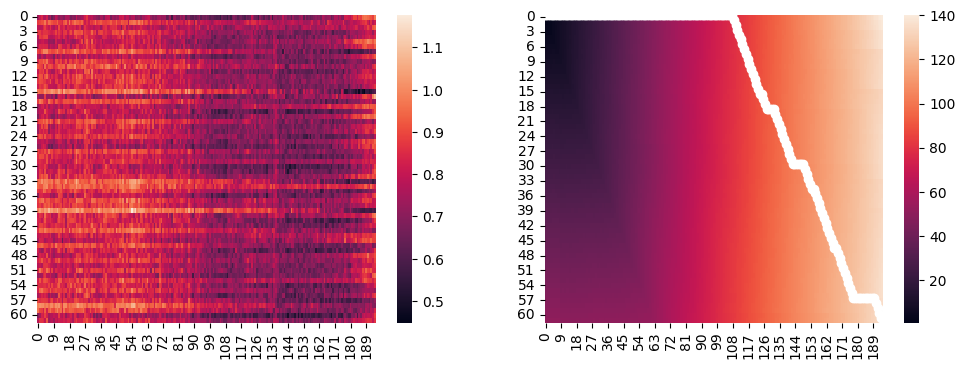

IRF8: 	erythrocytic: 	123.03052480258411, 	0.012802343892048295
IRF8: 	monocytic: 	129.02682986958268, 	0.011561543895123896
IRF8: 	granulocytic: 	135.24286697828038, 	0.011186341354696474



In [44]:
plot_comparisons(adata, irf8, "irf8") # == granulocytic

gfi1
78 154


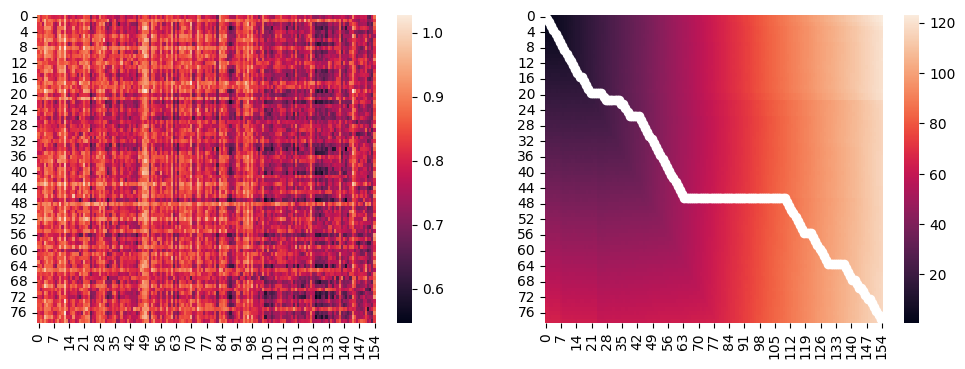

78 179


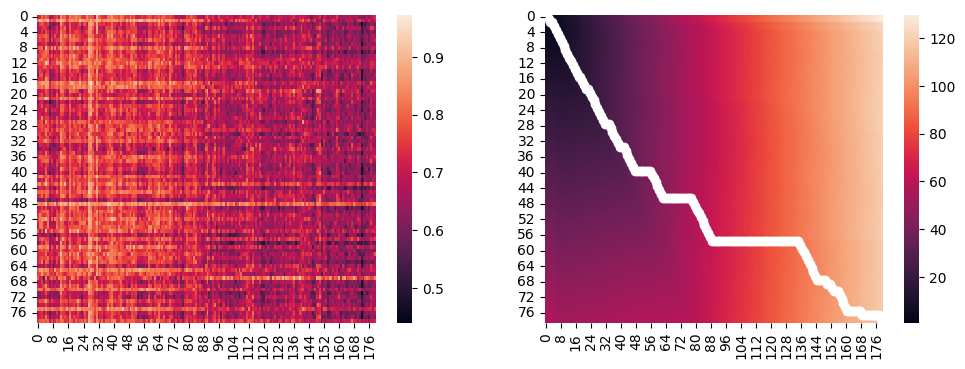

78 194


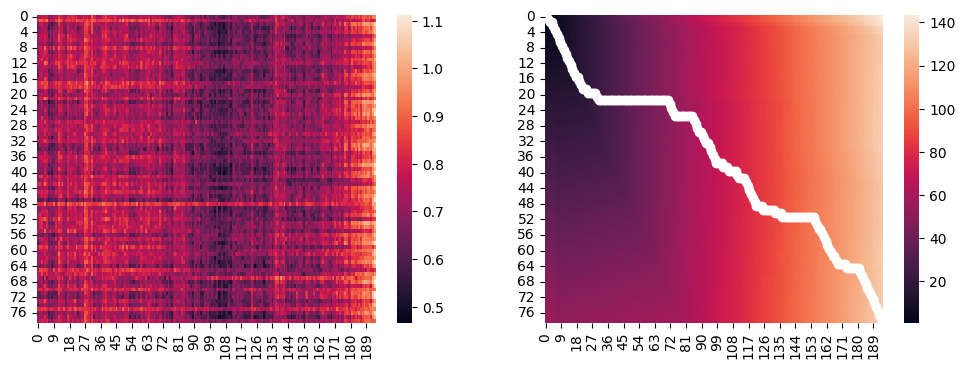

GFI1: 	erythrocytic: 	116.83919032367533, 	0.009541787694869361
GFI1: 	monocytic: 	118.11608620674146, 	0.008306335176282802
GFI1: 	granulocytic: 	132.23125641457466, 	0.008583658319673785



In [45]:
plot_comparisons(adata, gfi1, "gfi1") # == monocytic

both
46 154


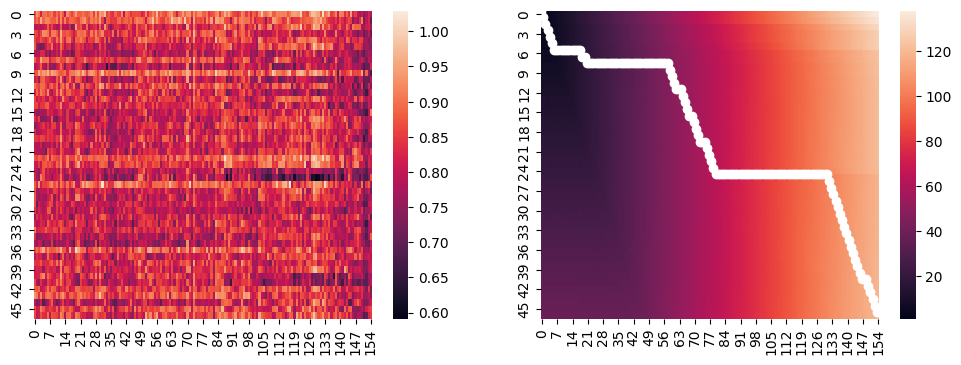

46 179


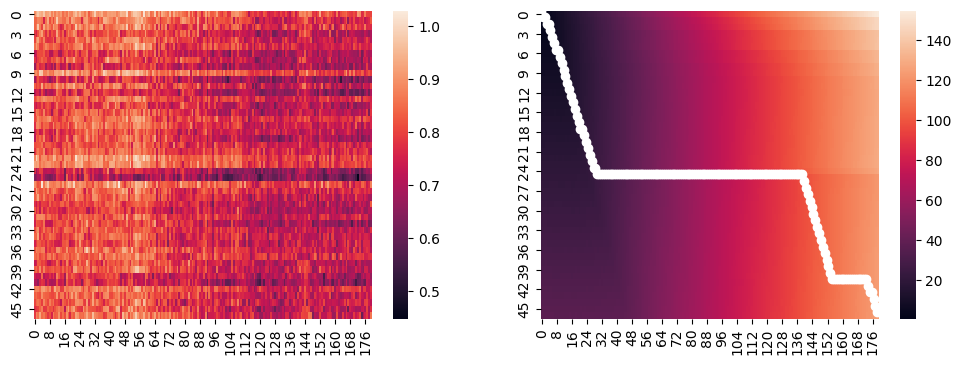

46 194


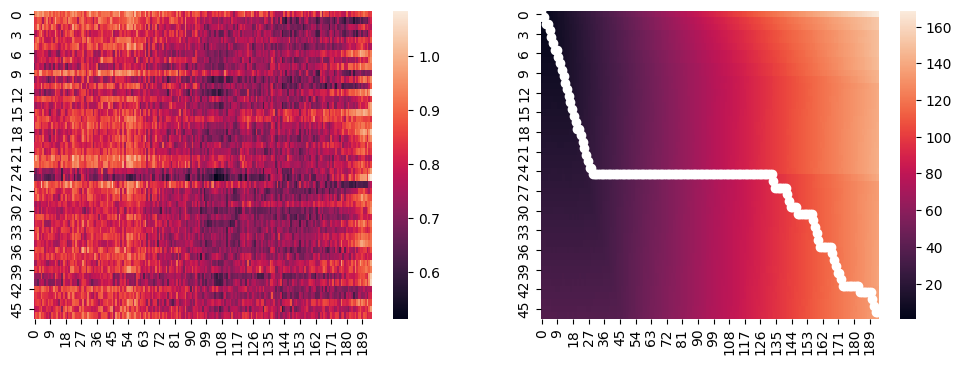

BOTH: 	erythrocytic: 	119.01246822406763, 	0.016336646290194597
BOTH: 	monocytic: 	124.38731795983719, 	0.014702992666647423
BOTH: 	granulocytic: 	136.4012609203036, 	0.014882843526492483



In [46]:
plot_comparisons(adata, both, "both") # == none

#### what if I scale gene expression?

In [20]:
from dtw import dtw as new_dtw
from dtw import dtwPlot, dtwPlotDensity, dtwPlotAlignment
import scipy as sp

def plot_comparisons(adata, ko, label_ko):
    trajectories = [adata, ko]

    config = {
        "compare_lineages_pseudocells": False,
        "compare_lineages_pseudocells_label": "pseudocells_50",
        "compare_trajectories_pseudocells": False,
        "compare_trajectories_pseudocells_label": "pseudocells_50",
        "align_pseudocells": False,
    }


    common_vars = list(set.intersection(*(set(trajectory.var_names) for trajectory in trajectories)))

    lineages = [
        [
            dynchro.tl.get_counts_common_vars(trajectory, config, "compare_trajectories_pseudocells", linlabel, common_vars)
            for linlabel in trajectory.uns["lineage_labels"]
        ]
        for trajectory in trajectories
    ]
    results = []
    print(label_ko)
    for lineage1, label in zip(lineages[0], adata.uns["lineage_labels"]):
        for lineage2 in lineages[1]:
            local_cost = sp.spatial.distance.cdist(lineage1, lineage2, metric = "correlation")
            alignment = new_dtw(local_cost, keep_internals = True)

            total_dist = alignment.distance
            total_dist_norm = alignment.normalizedDistance

            dtwPlotAlignment(alignment)


            # # total_dist, cost, distances = dynchro.tl.skip_dtw(lineage2, lineage1, distance = "correlation")
            # total_dist_norm = total_dist / (lineage1.shape[0] * lineage2.shape[0])
            # path1, path2 = dynchro.tl.skip_traceback(distances[1:, 1:])
            # print(max(path1), max(path2))

            # fig, (ax1, ax2) = plt.subplots(1,2)
            # fig.set_size_inches(12, 4)
            # sns.heatmap(cost, ax = ax1)
            # sns.heatmap(distances[1:, 1:], ax = ax2)
            # # plot the path
            # plt.scatter(path2, path1, c = "white")
            # plt.show()

            results.append(f"{label_ko.upper()}: \t{label}: \t{total_dist}, \t{total_dist_norm}\n")

    print("".join(results))

irf8
IRF8: 	erythrocytic: 	164.9412342286859, 	0.7600978535884142
IRF8: 	monocytic: 	167.72633918886265, 	0.6930840462349697
IRF8: 	granulocytic: 	172.02486481279382, 	0.669357450633439



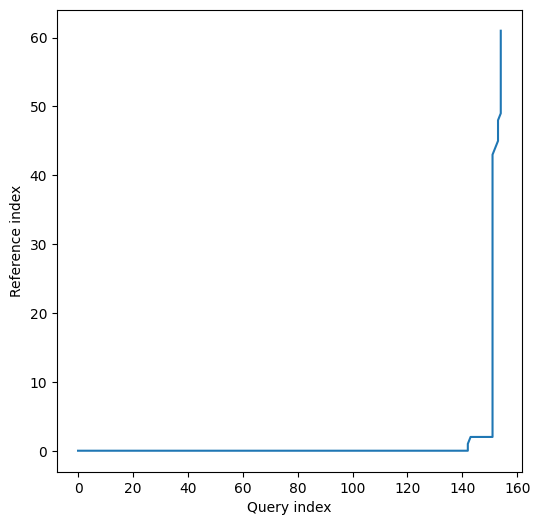

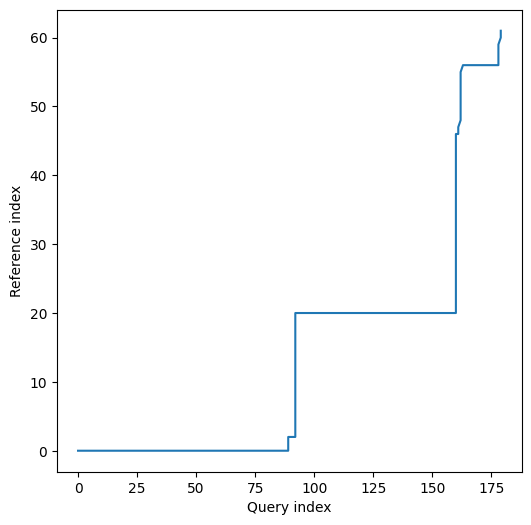

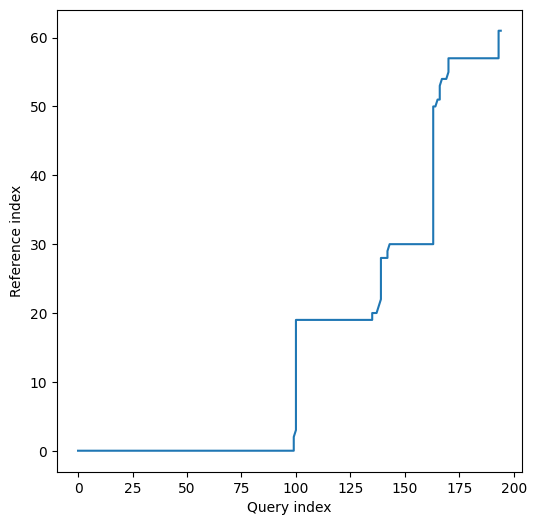

In [21]:
plot_comparisons(adata, irf8, "irf8") # == granulocytic

gfi1
GFI1: 	erythrocytic: 	170.1855838474581, 	0.7272888198609321
GFI1: 	monocytic: 	163.1806224466182, 	0.6300410133074061
GFI1: 	granulocytic: 	176.81692431468394, 	0.645317242024394



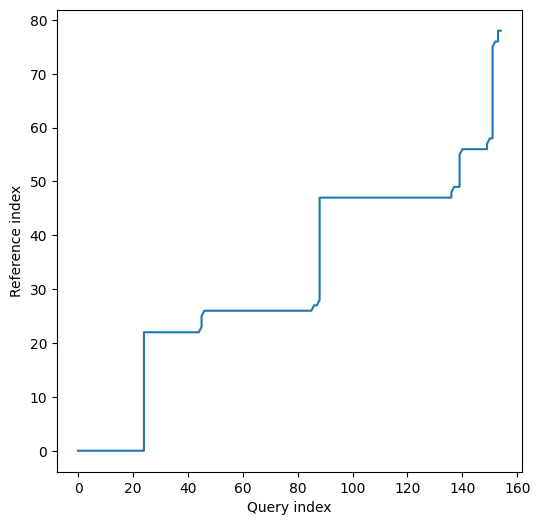

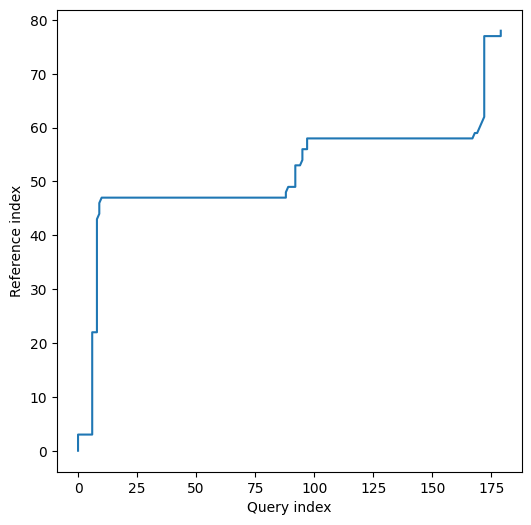

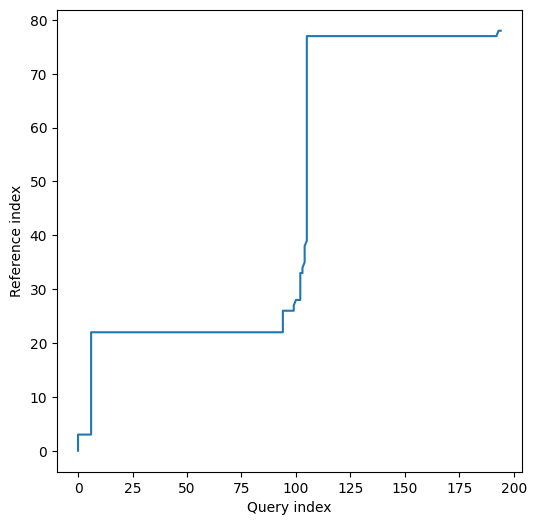

In [22]:
plot_comparisons(adata, gfi1, "gfi1") # == monocytic

both
BOTH: 	erythrocytic: 	151.82247394643406, 	0.7515964056754161
BOTH: 	monocytic: 	153.72059396236756, 	0.6771832333143946
BOTH: 	granulocytic: 	167.212623140001, 	0.6909612526446323



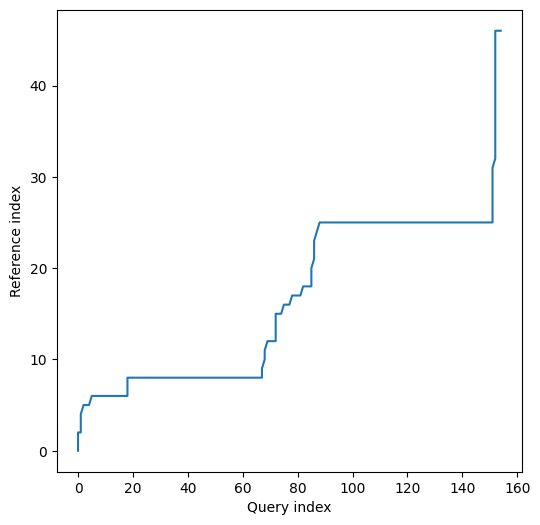

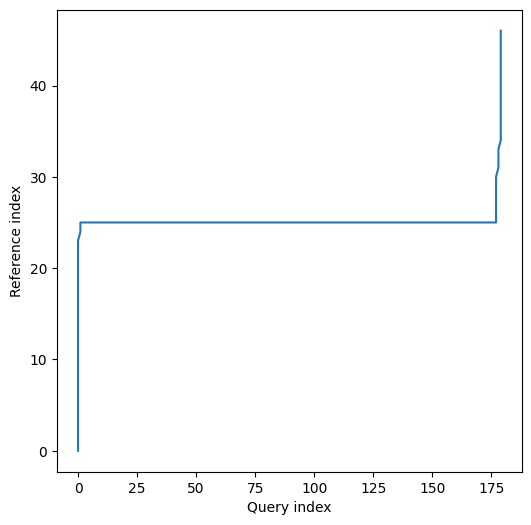

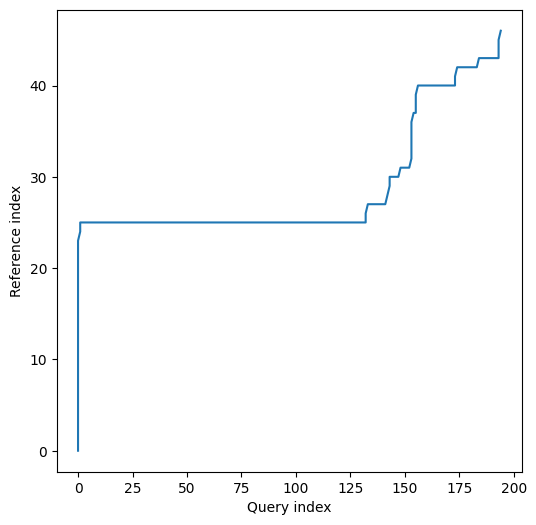

In [23]:
plot_comparisons(adata, both, "both") # == none

IRF8


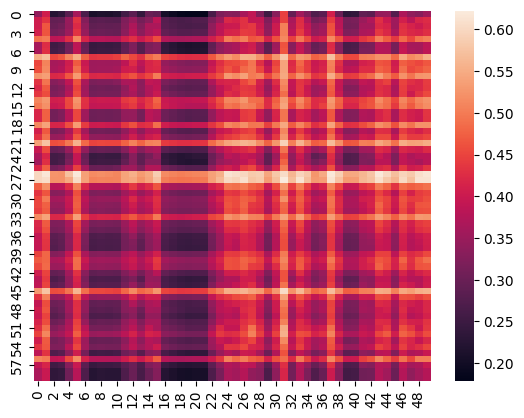

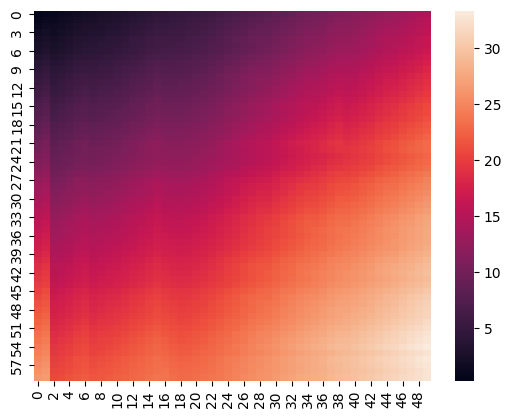

erythrocytic: 	32.73362804441681, 0.010911209348138938


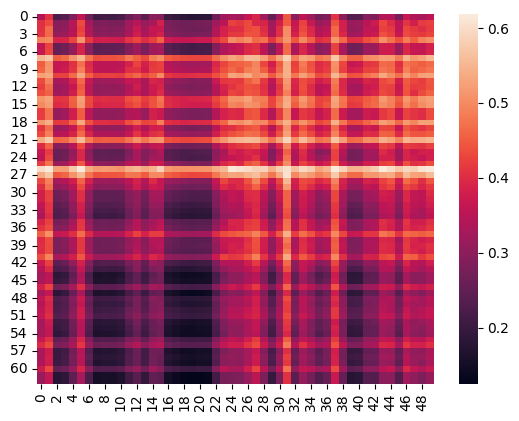

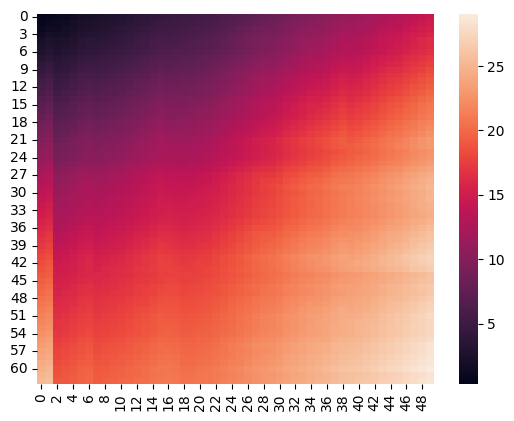

monocytic: 	28.572678197516723, 0.00907069149127515


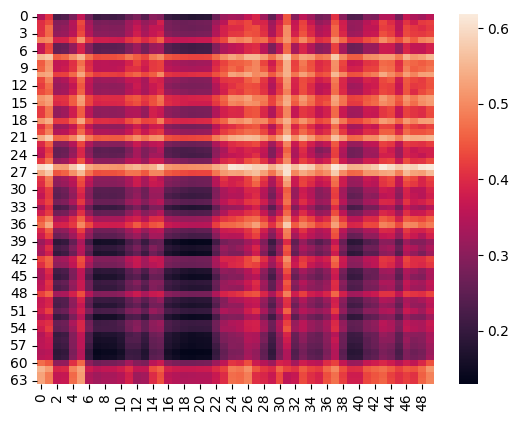

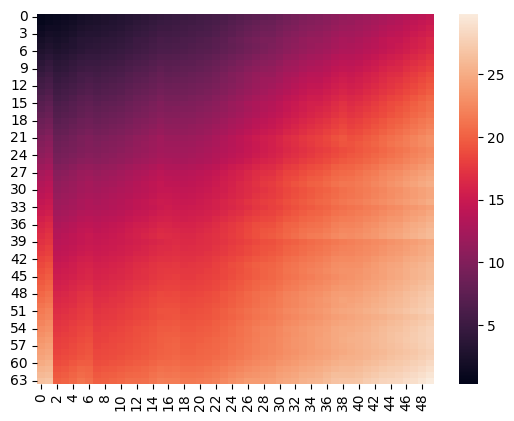

granulocytic: 	29.821401153453603, 0.00931918786045425


In [63]:
trajectories = [adata, irf8]

config = {
    "compare_lineages_pseudocells": True,
    "compare_lineages_pseudocells_label": "pseudocells_50",
    "compare_trajectories_pseudocells": True,
    "compare_trajectories_pseudocells_label": "pseudocells_50",
    "align_pseudocells": True,
}


common_vars = list(set.intersection(*(set(trajectory.var_names) for trajectory in trajectories)))

lineages = [
    [
        dynchro.tl.get_counts_common_vars(trajectory, config, "compare_trajectories_pseudocells", linlabel, common_vars)
        for linlabel in trajectory.uns["lineage_labels"]
    ]
    for trajectory in trajectories
]
print("IRF8")
for lineage1, label in zip(lineages[0], adata.uns["lineage_labels"]):
    for lineage2 in lineages[1]:
        total_dist, cost, distances = dynchro.tl.skip_dtw(lineage1, lineage2, distance = "correlation")
        total_dist_norm = total_dist / (lineage1.shape[0] * lineage2.shape[0])

        fig = plt.figure()
        sns.heatmap(cost)
        plt.show()
        sns.heatmap(distances[1:, 1:])
        plt.show()

        print(f"{label}: \t{total_dist}, {total_dist_norm}")


In [69]:
adata.var

,n_counts,n_cells,pct_cells
index,,,
March1,40,7,0.018325
Marc2,547,135,0.353403
March2,373,78,0.204188
March5,990,321,0.840314
March6,657,137,0.358639
...,...,...,...
Zxdc,287,58,0.151832
Zyg11b,620,170,0.445026
Zyx,2240,334,0.874346


GFI1


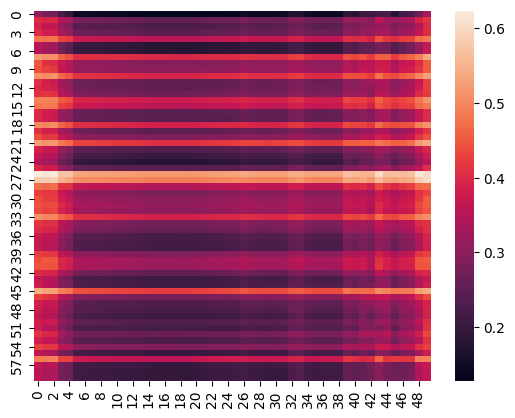

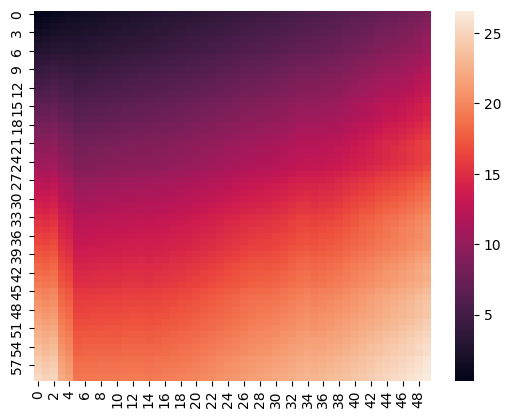

erythrocytic: 	26.564004827206457, 0.008854668275735486


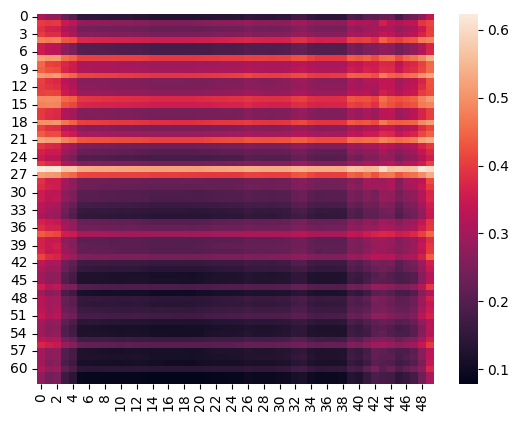

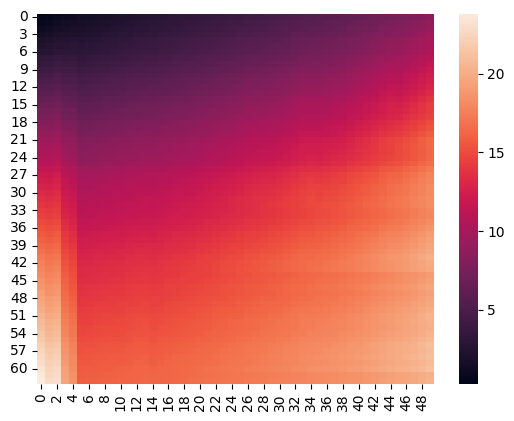

monocytic: 	20.368930964590938, 0.0064663272903463295


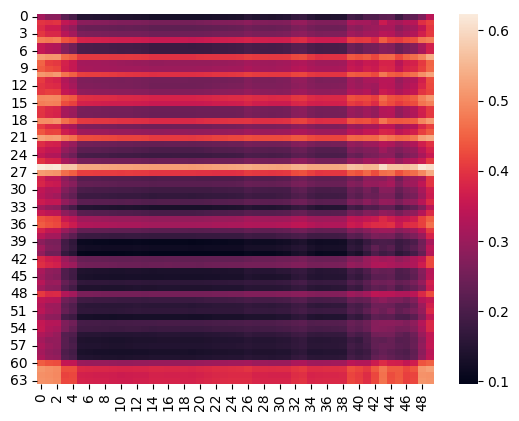

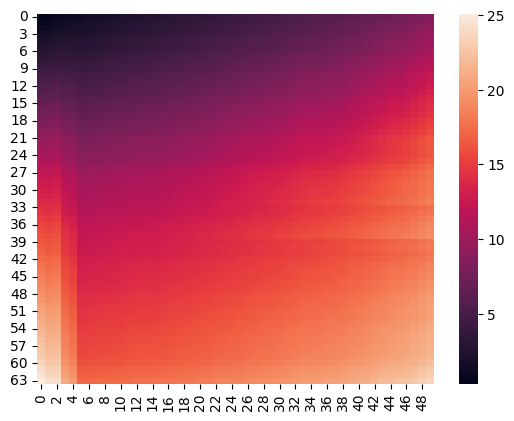

granulocytic: 	23.62845441091517, 0.0073838920034109915


In [56]:
trajectories = [adata, gfi1]

config = {
    "compare_lineages_pseudocells": True,
    "compare_lineages_pseudocells_label": "pseudocells_50",
    "compare_trajectories_pseudocells": True,
    "compare_trajectories_pseudocells_label": "pseudocells_50",
    "align_pseudocells": True,
}

common_vars = list(set.intersection(*(set(trajectory.var_names) for trajectory in trajectories)))

lineages = [
    [
        dynchro.tl.get_counts_common_vars(trajectory, config, "compare_trajectories_pseudocells", linlabel, common_vars)
        for linlabel in trajectory.uns["lineage_labels"]
    ]
    for trajectory in trajectories
]
print("GFI1")
for lineage1, label in zip(lineages[0], adata.uns["lineage_labels"]):
    for lineage2 in lineages[1]:
        total_dist, cost, distances = dynchro.tl.skip_dtw(lineage1, lineage2, distance = "correlation")
        total_dist_norm = total_dist / (lineage1.shape[0] * lineage2.shape[0])

        fig = plt.figure()
        sns.heatmap(cost)
        plt.show()
        sns.heatmap(distances[1:, 1:])
        plt.show()

        print(f"{label}: \t{total_dist}, {total_dist_norm}")

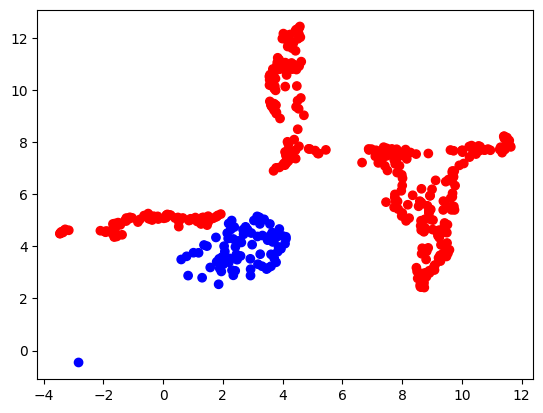

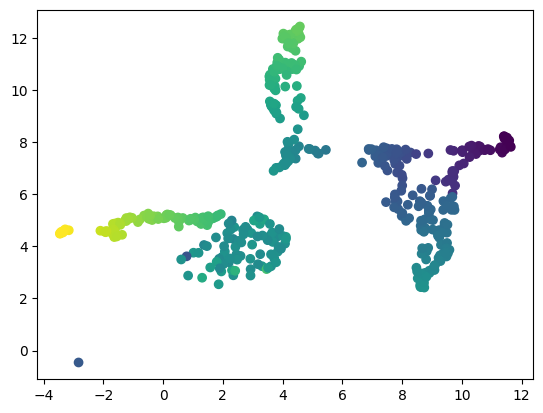

In [85]:
umapxy = np.append(adata.obsm["X_vis_umap"], gfi1.obsm["X_vis_umap"], axis = 0)
# plt.scatter(umapx[0:], umapx[1:], c = ["red"] * adata.shape[0] + ["blue"] * gfi1.shape[0])
umapx = [x[0] for x in umapxy]
umapy = [x[1] for x in umapxy]
color1 = adata.obs["pseudotime"]
color2 = gfi1.obs["pseudotime"]
color = np.append(color1, color2)
plt.scatter(umapx, umapy, c = ["red"] * adata.shape[0] + ["blue"] * gfi1.shape[0])
plt.show()
plt.scatter(umapx, umapy, c = color, cmap = "viridis")

In [106]:
def plot_vis(adata, ko):
    umapxy = np.append(adata.obsm["X_pca"], ko.obsm["X_pca"][:, (0,1)], axis = 0)
    # plt.scatter(umapx[0:], umapx[1:], c = ["red"] * adata.shape[0] + ["blue"] * gfi1.shape[0])
    umapx = [x[0] for x in umapxy]
    umapy = [x[1] for x in umapxy]
    color1 = adata.obs["pseudotime"]
    color2 = ko.obs["pseudotime"]
    color = np.append(color1, color2)
    plt.scatter(umapx, umapy, c = ["red"] * adata.shape[0] + ["blue"] * ko.shape[0])
    plt.show()
    plt.scatter(umapx, umapy, c = color, cmap = "viridis")
    plt.show()

In [113]:
irf8.obsm, adata.obsm

(AxisArrays with keys: X_dr, X_pca, X_vis, X_vis_umap, var_genes,
 AxisArrays with keys: X_dr, X_mlle, X_spring, X_stream_S4, X_vis, X_vis_umap, var_genes)

In [107]:
plot_vis(adata, irf8)
plot_vis(adata, gfi1)
plot_vis(adata, both)

KeyError: 'X_pca'

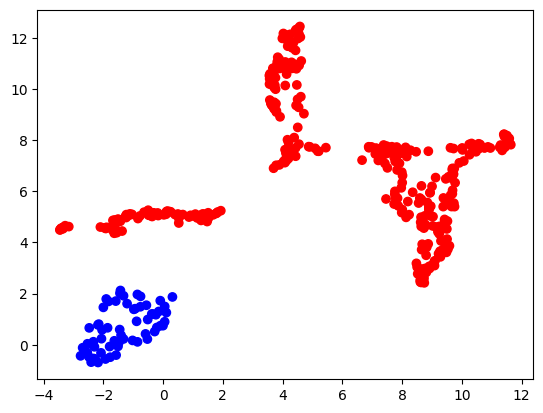

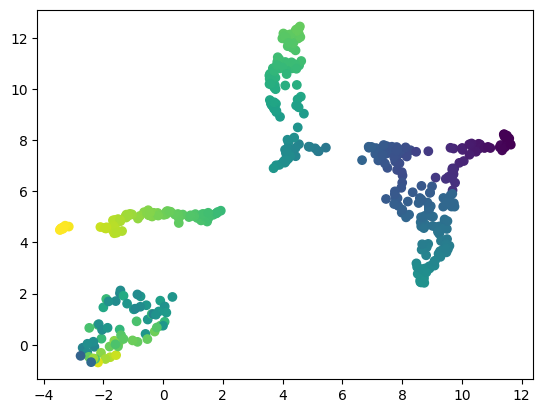

In [87]:
umapxy = np.append(adata.obsm["X_vis_umap"], irf8.obsm["X_vis_umap"], axis = 0)
# plt.scatter(umapx[0:], umapx[1:], c = ["red"] * adata.shape[0] + ["blue"] * gfi1.shape[0])
umapx = [x[0] for x in umapxy]
umapy = [x[1] for x in umapxy]
color1 = adata.obs["pseudotime"]
color2 = irf8.obs["pseudotime"]
color = np.append(color1, color2)
plt.scatter(umapx, umapy, c = ["red"] * adata.shape[0] + ["blue"] * irf8.shape[0])
plt.show()
plt.scatter(umapx, umapy, c = color, cmap = "viridis")

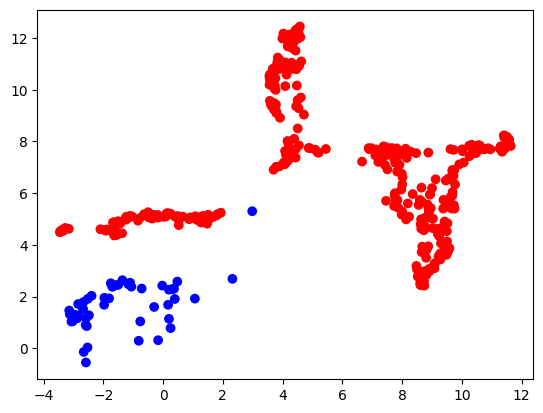

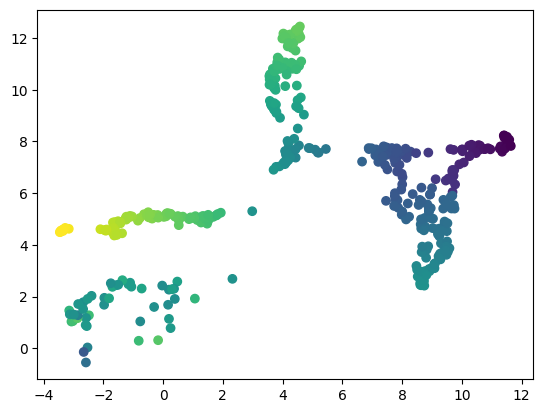

In [88]:
umapxy = np.append(adata.obsm["X_vis_umap"], both.obsm["X_vis_umap"], axis = 0)
# plt.scatter(umapx[0:], umapx[1:], c = ["red"] * adata.shape[0] + ["blue"] * gfi1.shape[0])
umapx = [x[0] for x in umapxy]
umapy = [x[1] for x in umapxy]
color1 = adata.obs["pseudotime"]
color2 = both.obs["pseudotime"]
color = np.append(color1, color2)
plt.scatter(umapx, umapy, c = ["red"] * adata.shape[0] + ["blue"] * both.shape[0])
plt.show()
plt.scatter(umapx, umapy, c = color, cmap = "viridis")

In [70]:
adata

AnnData object with n_obs × n_vars = 382 × 12445
    obs: 'label', 'n_counts', 'n_genes', 'pct_genes', 'kmeans', 'node', 'branch_id', 'branch_id_alias', 'branch_lam', 'branch_dist', 'S0_pseudotime', 'S3_pseudotime', 'S5_pseudotime', 'S4_pseudotime', 'S2_pseudotime', 'S1_pseudotime', 'branch_id_id', 'pseudotime', 'milestones', 'erythrocytic', 'monocytic', 'granulocytic'
    var: 'n_counts', 'n_cells', 'pct_cells'
    uns: 'branch_id_alias_color', 'branch_id_color', 'id', 'kmeans_color', 'label_color', 'label_colors', 'lineage_labels', 'lineages', 'params', 'pseudocells', 'pseudocells_50_erythrocytic_pseudotime', 'pseudocells_50_granulocytic_pseudotime', 'pseudocells_50_monocytic_pseudotime', 'var_genes', 'workdir'
    obsm: 'X_dr', 'X_mlle', 'X_spring', 'X_stream_S4', 'X_vis', 'X_vis_umap', 'var_genes'
    varm: 'pseudocells_50_erythrocytic', 'pseudocells_50_granulocytic', 'pseudocells_50_monocytic'

In [45]:
trajectories = [adata, both]

config = {
    "compare_lineages_pseudocells": False,
    "compare_lineages_pseudocells_label": "pseudocells_50",
    "compare_trajectories_pseudocells": False,
    "compare_trajectories_pseudocells_label": "pseudocells_50",
    "align_pseudocells": False,
}

common_vars = list(set.intersection(*(set(trajectory.var_names) for trajectory in trajectories)))

lineages = [
    [
        dynchro.tl.get_counts_common_vars(trajectory, config, "compare_trajectories_pseudocells", linlabel, common_vars)
        for linlabel in trajectory.uns["lineage_labels"]
    ]
    for trajectory in trajectories
]
print("BOTH")
for lineage1, label in zip(lineages[0], adata.uns["lineage_labels"]):
    for lineage2 in lineages[1]:
        total_dist, cost, distances = dynchro.tl.skip_dtw(lineage1, lineage2, distance = "correlation")
        total_dist_norm = total_dist / (lineage1.shape[0] * lineage2.shape[0])

        print(f"{label}: \t{total_dist}, {total_dist_norm}")

BOTH
erythrocytic: 	106.94095452906777, 0.014679609406872721
monocytic: 	100.38152674101441, 0.0118654286927913
granulocytic: 	109.00511443491042, 0.011893629507355202


In [31]:
lineage1 = lineages[0][0]
lineage2 = lineages[1][0]
total_dist, cost, distances = dynchro.tl.skip_dtw(lineage1, lineage2, distance = "euclidean")
total_dist_norm = total_dist / (lineage1.shape[0] * lineage2.shape[0])
path1, path2 = dynchro.tl.skip_traceback(distances[1:, 1:])
total_dist, total_dist_norm


(75663.84672382392, 7.87344919082455)

In [32]:
lineage1 = lineages[0][1]
lineage2 = lineages[1][0]
total_dist, cost, distances = dynchro.tl.skip_dtw(lineage1, lineage2, distance = "euclidean")
total_dist_norm = total_dist / (lineage1.shape[0] * lineage2.shape[0])
path1, path2 = dynchro.tl.skip_traceback(distances[1:, 1:])
total_dist, total_dist_norm

(80011.60184045292, 7.16949837280044)

In [33]:
lineage1 = lineages[0][2]
lineage2 = lineages[1][0]
total_dist, cost, distances = dynchro.tl.skip_dtw(lineage1, lineage2, distance = "euclidean")
total_dist_norm = total_dist / (lineage1.shape[0] * lineage2.shape[0])
path1, path2 = dynchro.tl.skip_traceback(distances[1:, 1:])
total_dist, total_dist_norm

(83771.51908369605, 6.92899248004103)

---> this would mean that irf8 leads more to granulocytic, which is correct

In [11]:
adata.uns["lineage_labels"] = adata.uns["lineage_labels"][0:3]
irf8.uns["lineage_labels"] = irf8.uns["lineage_labels"][0:1]
gfi1.uns["lineage_labels"] = gfi1.uns["lineage_labels"][0:1]
both.uns["lineage_labels"] = both.uns["lineage_labels"][0:1]

In [14]:
adata.uns["lineage_labels"]

array(['erythrocytic', 'monocytic', 'granulocytic'], dtype=object)

In [302]:
from importlib import reload
reload(dynchro)

<module 'dynchro' from '/home/louise/Work/dynchro/src/dynchro/__init__.py'>

## Rest

In [288]:
irf8.obs.pseudotime

index
Irf8.Null.10     7.218443
Irf8.Null.11     7.174709
Irf8.Null.12     9.014411
Irf8.Null.13    10.784788
Irf8.Null.14     7.292647
                  ...    
Irf8.Null.63    12.110735
Irf8.Null.6      5.508220
Irf8.Null.7     11.488973
Irf8.Null.8     11.722497
Irf8.Null.9      8.415615
Name: pseudotime, Length: 62, dtype: float64

In [13]:
sc.pp.filter_genes(adata, min_cells=max(5,int(round(adata.shape[0]*0.001))))
sc.pp.filter_genes(adata, min_counts = 1)
adata

AnnData object with n_obs × n_vars = 382 × 13109
    obs: 'label'
    var: 'n_cells', 'n_counts'
    uns: 'workdir', 'label_color'

656 variable genes are selected


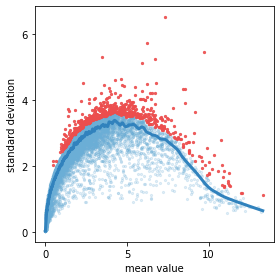

In [14]:
st.select_variable_genes(adata)

In [15]:
st.dimension_reduction(adata,n_components=4)

feature var_genes is being used ...
1 cpus are being used ...


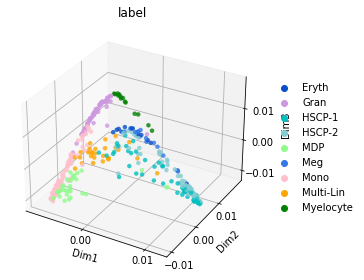

In [16]:
st.plot_dimension_reduction(adata)

In [17]:
st.seed_elastic_principal_graph(adata)

Seeding initial elastic principal graph...
Clustering...
K-Means clustering ...
The number of initial nodes is 10
Calculatng minimum spanning tree...


AttributeError: 'Graph' object has no attribute 'node'

In [18]:
st.elastic_principal_graph(adata)

Learning elastic principal graph...
[1]
 "Constructing tree 1 of 1 / Subset 1 of 1"


[1]
 "Computing EPG with 50 nodes on 382 points and 4 dimensions"


[1]
 "Using a single core"


Nodes = 
10
 
11
 
12
 
13
 
14
 
15
 
16
 
17
 
18
 
19
 
20
 
21
 
22
 
23
 
24
 
25
 
26
 
27
 
28
 
29
 
30
 
31
 
32
 
33
 
34
 
35
 
36
 
37
 
38
 
39
 
40
 
41
 
42
 
43
 
44
 
45
 
46
 
47
 
48
 
49
 


BARCODE	ENERGY	NNODES	NEDGES	NRIBS	NSTARS	NRAYS	NRAYS2	MSE	MSEP	FVE	FVEP	UE	UR	URN	URN2	URSD

2||50
	
1.853e-05
	
50
	
49
	
44
	
2
	
0
	
0
	
1.011e-05
	
9.723e-06
	
0.9562
	
0.9579
	
6.774e-06
	
1.647e-06
	
8.233e-05
	
0.004116
	
0


9.918 sec elapsed

[[1]]





AttributeError: 'Graph' object has no attribute 'node'

AttributeError: module 'stream' has no attribute 'plot_branches_with_cells'

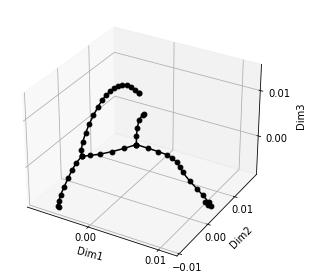

In [19]:
st.plot_branches(adata)
st.plot_branches_with_cells(adata)

In [20]:
st.optimize_branching(adata)
st.plot_branches(adata)
st.plot_branches_with_cells(adata)

Optimizing branching...


KeyError: 'epg'

In [21]:
st.shift_branching(adata)
st.plot_branches(adata)
st.plot_branches_with_cells(adata)

Shifting branching point to denser area ...


KeyError: 'epg'

In [22]:
st.plot_flat_tree(adata)

TypeError: argmap_spring_layout_9() got an unexpected keyword argument 'random_state'

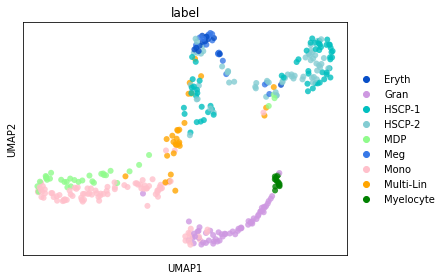

In [23]:
st.plot_visualization_2D(adata,use_precomputed=False,nb_pct=0.9)

# Combine all

In [106]:
adata = anndata.read_text('Olsson_2016/data_Olsson/data_LG.tsv')
adata = adata.transpose()
cell_labels = pd.read_csv('Olsson_2016/cell_label.tsv', sep='\t', header=None)
cell_labels = [x[0] for x in cell_labels.values]
adata.obs['cell_labels'] = cell_labels
adata

AnnData object with n_obs × n_vars = 382 × 23955
    obs: 'cell_labels'

In [108]:
adata2 = anndata.read_text('Olsson_2016/data_perturbation.tsv')
adata2 = adata2.transpose()
cell_labels_2 = pd.read_csv('Olsson_2016/cell_perturbation_label.tsv', sep='\t', header=None)
cell_labels_2 = [x[0] for x in cell_labels_2.values]
adata2.obs['cell_labels'] = cell_labels_2
adata2

AnnData object with n_obs × n_vars = 188 × 23955
    obs: 'cell_labels'

In [110]:
adata_all = anndata.concat([adata, adata2], label = "batch")

In [115]:
sc.pp.filter_genes(adata_all, min_cells=max(5,int(round(adata.shape[0]*0.001))))
sc.pp.highly_variable_genes(adata_all, n_top_genes=610)
adata_all = adata_all[:, adata_all.var.highly_variable]

In [117]:
sc.pp.neighbors(adata_all, n_neighbors=10, n_pcs=40)

         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/louise/Work/dynchro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/louise/Work/dynchro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/louise/Work/dynchro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/louise/Work/dynchro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/louise/Work/dynchro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' wil

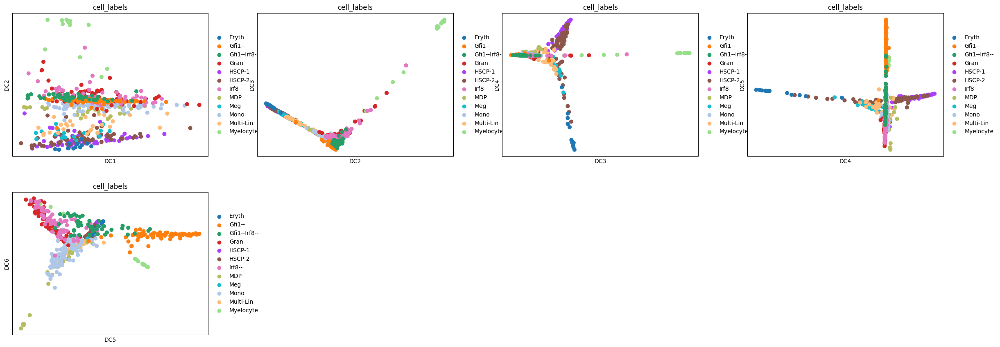

/home/louise/Work/dynchro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/louise/Work/dynchro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/louise/Work/dynchro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/louise/Work/dynchro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/louise/Work/dynchro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' wil

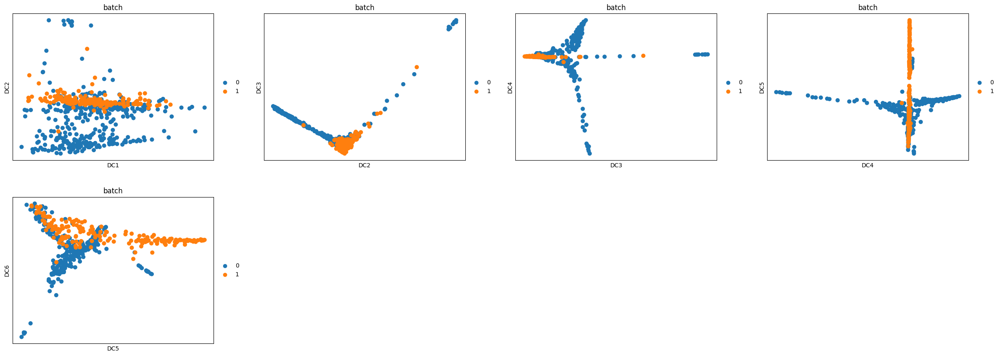

In [120]:
sc.tl.diffmap(adata_all, n_comps=10)
sc.pl.diffmap(adata_all, color = "cell_labels", components = ["1,2", "2,3", "3,4", "4,5", "5,6"])
sc.pl.diffmap(adata_all, color = "batch", components = ["1,2", "2,3", "3,4", "4,5", "5,6"])

In [121]:
sc.pp.filter_genes(adata2, min_cells=max(5,int(round(adata.shape[0]*0.001))))
sc.pp.highly_variable_genes(adata2, n_top_genes=610)
adata2 = adata2[:, adata2.var.highly_variable]

         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/louise/Work/dynchro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/louise/Work/dynchro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


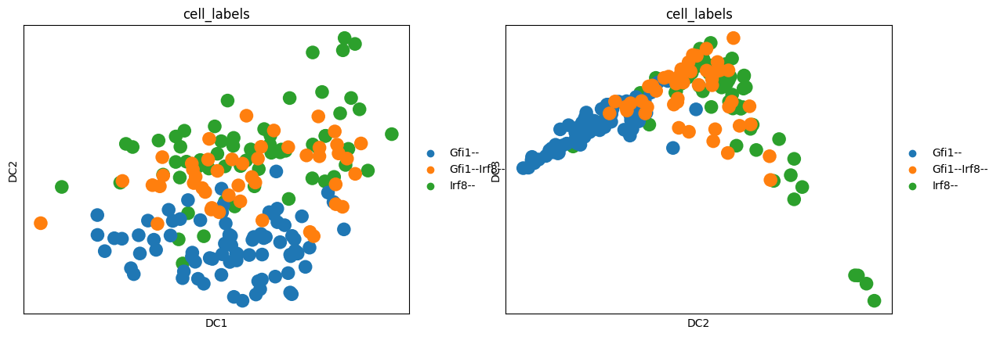

/home/louise/Work/dynchro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/louise/Work/dynchro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/louise/Work/dynchro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


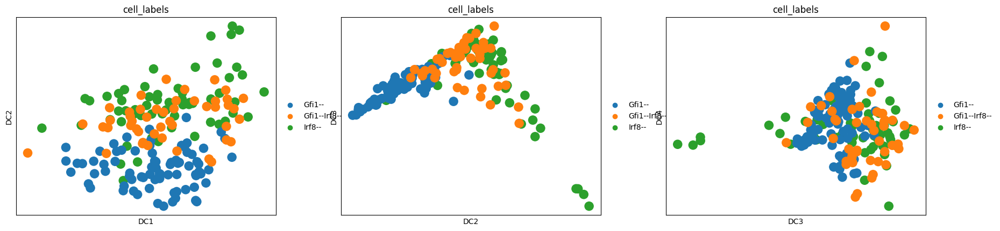

In [123]:
sc.pp.neighbors(adata2, n_neighbors=10, n_pcs=40)
sc.tl.diffmap(adata2, n_comps=4)
sc.pl.diffmap(adata2, color = "cell_labels", components = ["1,2", "2,3"])
sc.pl.diffmap(adata2, color = "cell_labels", components = ["1,2", "2,3", "3,4"])

In [75]:
cell_labels = pd.read_csv('Olsson_2016/cell_label.tsv', sep='\t', header=None)
cell_labels = [x[0] for x in cell_labels.values]
cell_labels

['HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-1',
 'HSCP-2',
 'HSCP-2',
 'HSCP-2',
 'HSCP-2',
 'HSCP-2',
 'HSCP-2',
 'HSCP-2',
 'HSCP-2',
 'HSCP-2',
 'HSCP-2',
 'HSCP-2',
 'HSCP-2',
 'HSCP-2',
 'HSCP-2',
 'HSCP-2',
 'HSCP-2',
 'HSCP-2',
 'HSCP-2',
 'HSCP-2',
 'HSCP-2',
 'HSCP-2',
 'HSCP-2',
 'HSCP-2',
 'HSCP-2',
 'HSCP-2',
 'HSCP-2',
 'HSCP-2',
 'HSCP-2',
 'HSCP-2',
 'HSCP-2',
 'HSCP-2',
 'HSCP-2',

In [76]:
adata.obs['cell_labels'] = cell_labels
adata.obs

,cell_labels
Lsk.3,HSCP-1
Lsk.80,HSCP-1
Lsk.81,HSCP-1
Lsk.65,HSCP-1
Lsk.16,HSCP-1
...,...
LK.CD34+.62,Myelocyte
LK.CD34+.34,Myelocyte
LK.CD34+.40,Myelocyte
LK.CD34+.10,Myelocyte


In [77]:
sc.pp.filter_genes(adata, min_cells=max(5,int(round(adata.shape[0]*0.001))))
sc.pp.highly_variable_genes(adata, n_top_genes=610)
adata = adata[:, adata.var.highly_variable]

In [78]:
sc.pp.normalize_total(adata, target_sum=1e4)
# sc.pp.log1p(adata)
# sc.pp.scale(adata, max_value=10)
sc.pp.neighbors(adata, random_state=1)
sc.tl.umap(adata, random_state=1)

         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/louise/Work/dynchro/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


/home/louise/Work/dynchro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


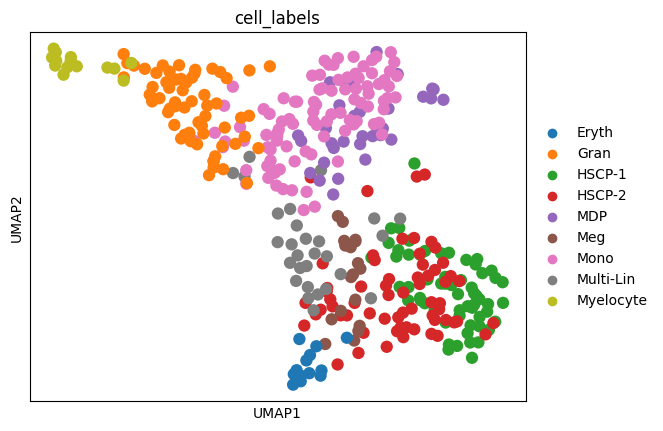

In [79]:
sc.pl.umap(adata, color = "cell_labels")

/home/louise/Work/dynchro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/louise/Work/dynchro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


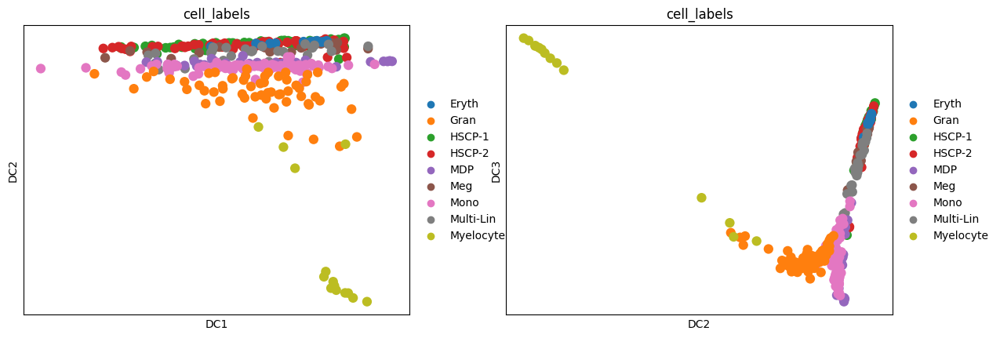

/home/louise/Work/dynchro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/louise/Work/dynchro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/louise/Work/dynchro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


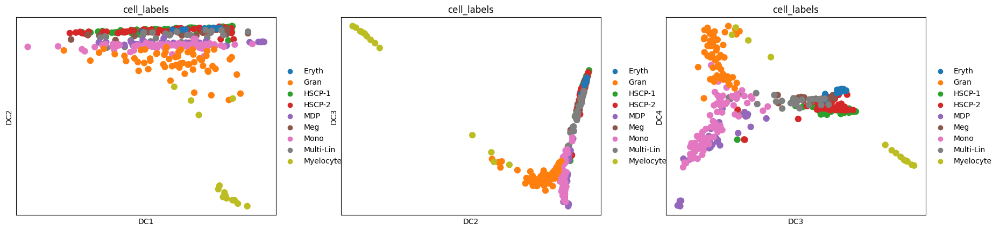

In [80]:
sc.tl.diffmap(adata, n_comps=4)
sc.pl.diffmap(adata, color = "cell_labels", components = ["1,2", "2,3"])
sc.pl.diffmap(adata, color = "cell_labels", components = ["1,2", "2,3", "3,4"])

/home/louise/Work/dynchro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


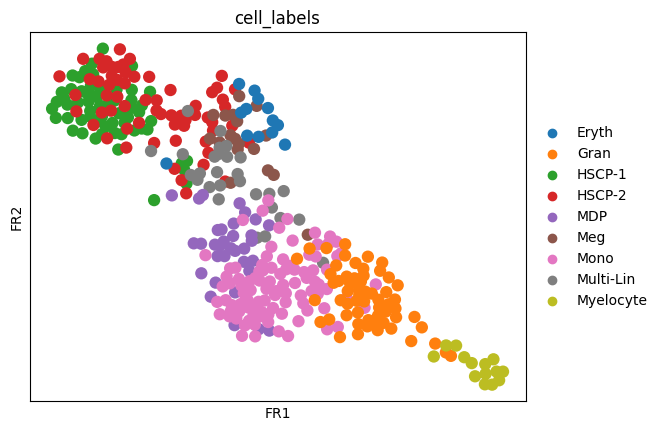

In [72]:
sc.tl.draw_graph(adata, random_state=1)
sc.pl.draw_graph(adata, color = "cell_labels")

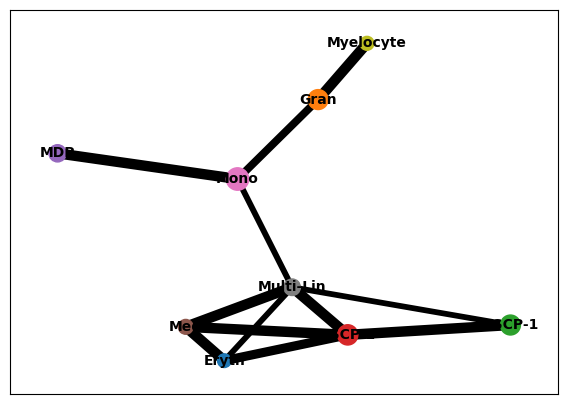

In [93]:
sc.tl.paga(adata, groups='cell_labels')
sc.pl.paga(adata, color = "cell_labels", threshold = 0.5)

/home/louise/Work/dynchro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


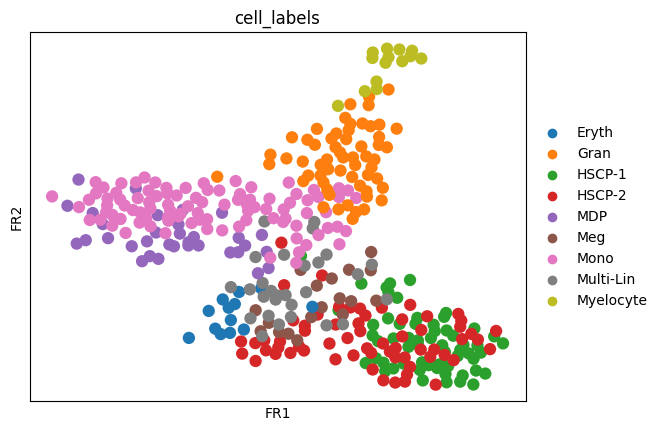

In [94]:
sc.tl.draw_graph(adata, init_pos='paga')
sc.pl.draw_graph(adata, color = "cell_labels")

In [95]:
adata.uns["iroot"] = np.flatnonzero(adata.obs['cell_labels'] == 'Myelocyte')[0]

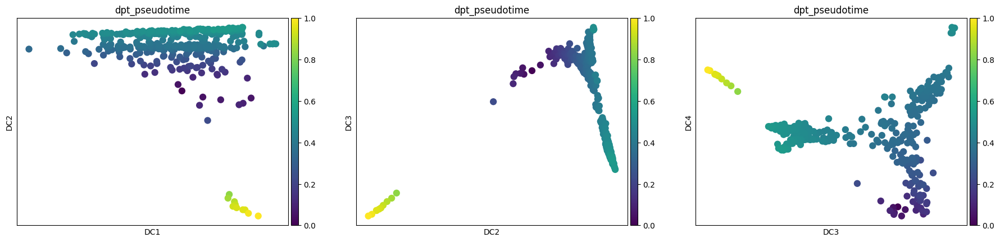

/home/louise/Work/dynchro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/louise/Work/dynchro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/louise/Work/dynchro/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


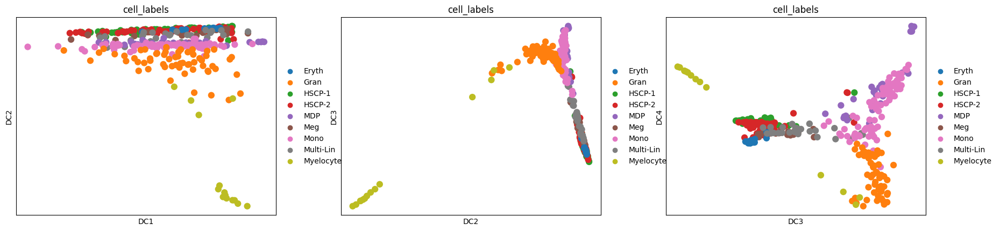

In [101]:
sc.tl.diffmap(adata, n_comps=10)

sc.tl.dpt(adata)

sc.pl.diffmap(adata, color = "dpt_pseudotime", components = ["1,2", "2,3", "3,4"])
sc.pl.diffmap(adata, color = "cell_labels", components = ["1,2", "2,3", "3,4"])



In [103]:
adata_new = anndata.read_text('Olsson_2016/data_perturbation.tsv')
adata_new = adata_new.transpose()
adata_new

AnnData object with n_obs × n_vars = 188 × 23955

In [104]:
cell_labels_new = pd.read_csv('Olsson_2016/cell_perturbation_label.tsv', sep='\t', header=None)

In [105]:
adata_new.obs['cell_labels'] = cell_labels_new

In [ ]:
adata1 = adata.read_text('Olsson_2016/data_Olsson/data_LG.tsv')
adata2 = adata.read_text('Olsson_2016/data_perturbation.tsv')
adata1 = adata1.transpose()
adata2 = adata2.transpose()
adata = adata1.concatenate(adata2)



In [124]:
adata2

AnnData object with n_obs × n_vars = 188 × 610
    obs: 'cell_labels'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'neighbors', 'diffmap_evals', 'cell_labels_colors'
    obsm: 'X_pca', 'X_diffmap'
    obsp: 'distances', 'connectivities'

In [125]:
adata

AnnData object with n_obs × n_vars = 382 × 23955
    obs: 'cell_labels'